### BADASS Analysis: sugars

Can we distinguish five different sugar molecules from one another? And can we reduce the number of peptides we include in the array without negatively affecting model performance?

#### Analytes

Sugars:
- D-(+)-mannose (man)
- D-(-)-fructose (fru)
- D-(+)-glucose (glu)
- D-(+)-maltose monohydrate (mal)
- D-(+)-glucosamine HCl (gluam)

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Large array sugar data

In [3]:
sugar_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/'
                           'Sugars/Reformatted_sugar_csvs/'},
    results_dir='/home/ks17361/ML_environment/BADASS/Small_molecule_analysis_large_array/'
                'Sugars/Sugar_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep','GRP46', 'GRP51', 'CCHept', 'CCHept-L14A', 'CCHept-I17A-L21A',
                            'CCHept-I17G-L21G', 'CCHept-I24A', 'CCHept-I24P', 'GRP80', 'GRP63', 'GRP52',
                            'CCHex', 'CCPent', 'NLKEIA', 'QLKEIA', 'CCHex2', 'GRP22', 'CCHept-I17H',
                            'CCHept-I17T', 'CCHept-L21H-I24H', 'CCHept-L21N-I24N', 'CCHept-L21S-I24S',
                            'CCHept-L21T-I24T', 'CCHept-I24H', 'CCHept-I24N', 'CCHept-I24S', 'CCHept-I24T',
                            'CCHept-L7K', 'CCHept-I17K', 'CCHept-I17K-I24E', 'CCHept-L21E-I24K', 'CCHept-L21K',
                            'CCHept-L21K-I24E', 'CCHept-I24D', 'CCHept-I24E', 'CCHept-I24K', 'CCHept-L28K',
                            'CCPent-I24K', 'CCHex2-I24K', 'CCHept-L7W', 'CCHept-L7Y', 'CCHept-L21S-I24Y',
                            'CCHept-L21Y-I24S', 'CCHept-I24Y', 'CCHept-L28W', 'CCHept-L28Y', 'GRP35']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
sugar_fluor_data.group_xlsx_repeats()

In [5]:
sugar_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['fru_repeat_1.xlsx',
                             'glu_repeat_1.xlsx',
                             'gluam_repeat_1.xlsx',
                             'mal_repeat_1.xlsx',
                             'man_repeat_1.xlsx'])])),
             ('repeat_2',
              OrderedDict([('DPH',
                            ['fru_repeat_2.xlsx',
                             'glu_repeat_2.xlsx',
                             'gluam_repeat_2.xlsx',
                             'mal_repeat_2.xlsx',
                             'man_repeat_2.xlsx'])])),
             ('repeat_3',
              OrderedDict([('DPH',
                            ['fru_repeat_3.xlsx',
                             'glu_repeat_3.xlsx',
                             'gluam_repeat_3.xlsx',
                             'mal_repeat_3.xlsx',
                             'man_repeat_3.xlsx'])])),
             ('repeat_4',
              Ordere

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx
Drawing scatter plot of data spread for fru_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

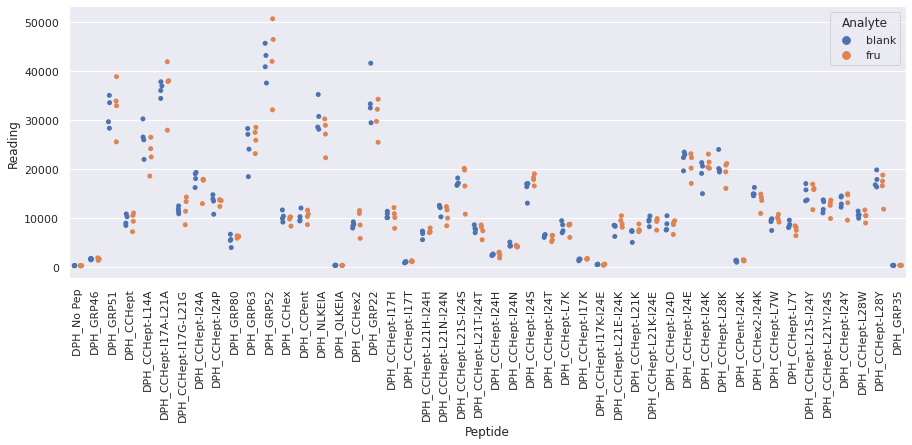

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_1.xlsx
Drawing scatter plot of data spread for glu_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

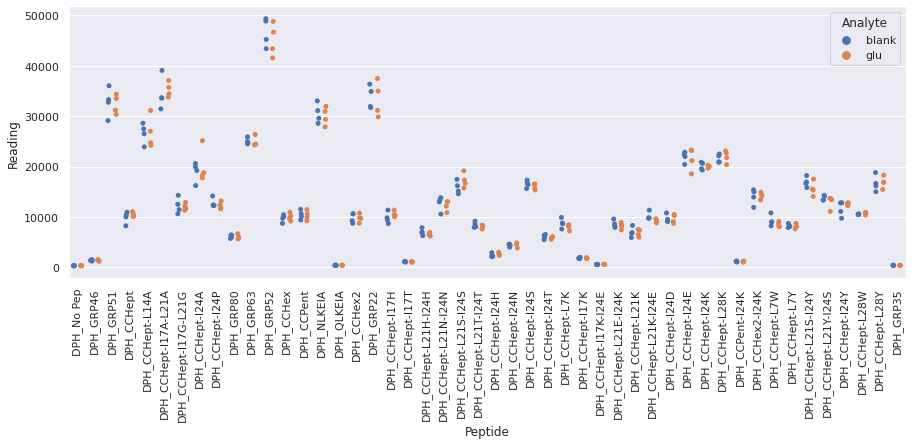

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_1.xlsx
Drawing scatter plot of data spread for gluam_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

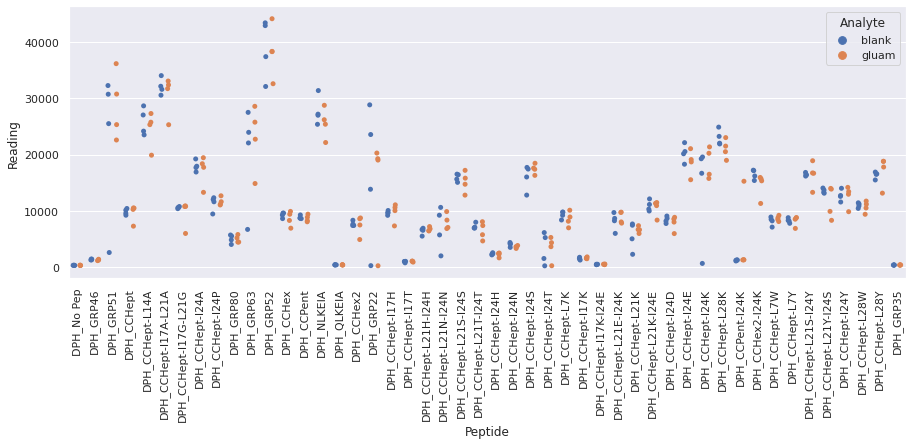

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_1.xlsx
Drawing scatter plot of data spread for mal_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

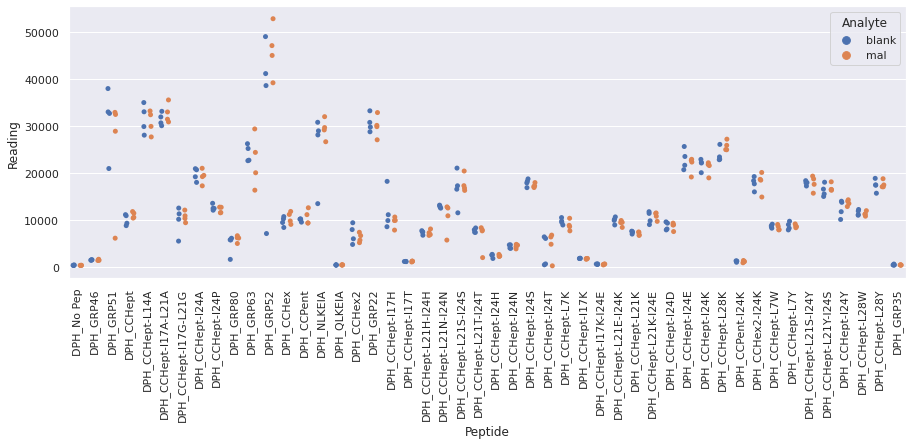

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_1.xlsx
Drawing scatter plot of data spread for man_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

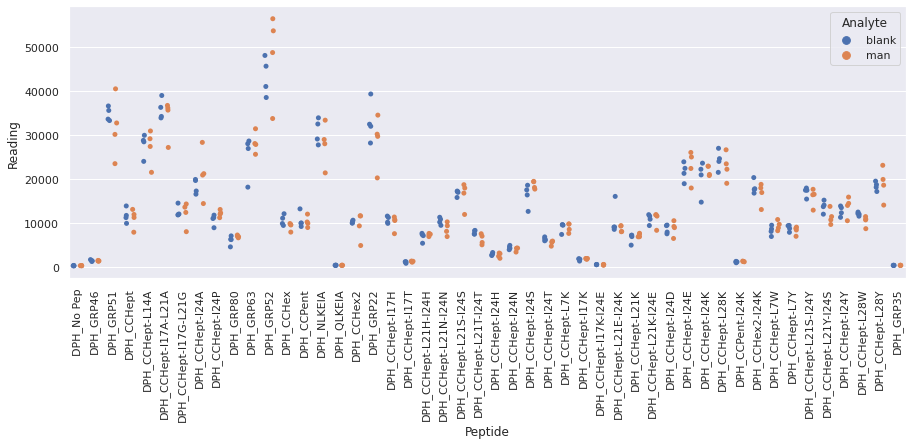

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_2.xlsx
Drawing scatter plot of data spread for fru_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

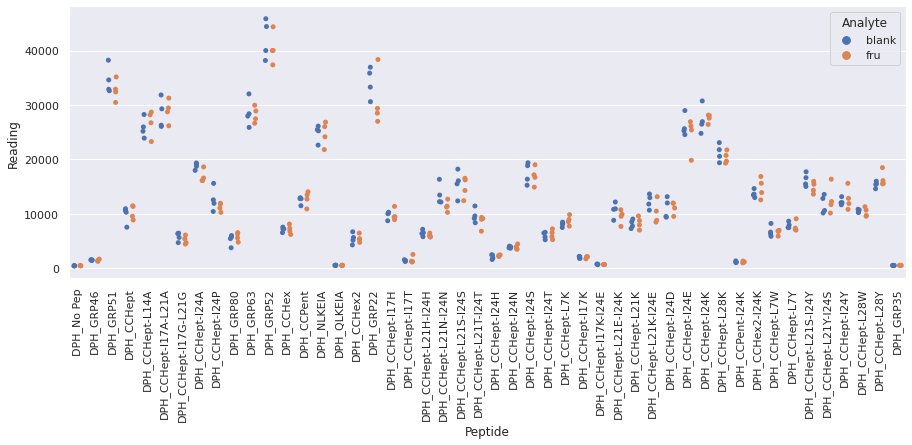

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_2.xlsx
Drawing scatter plot of data spread for glu_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

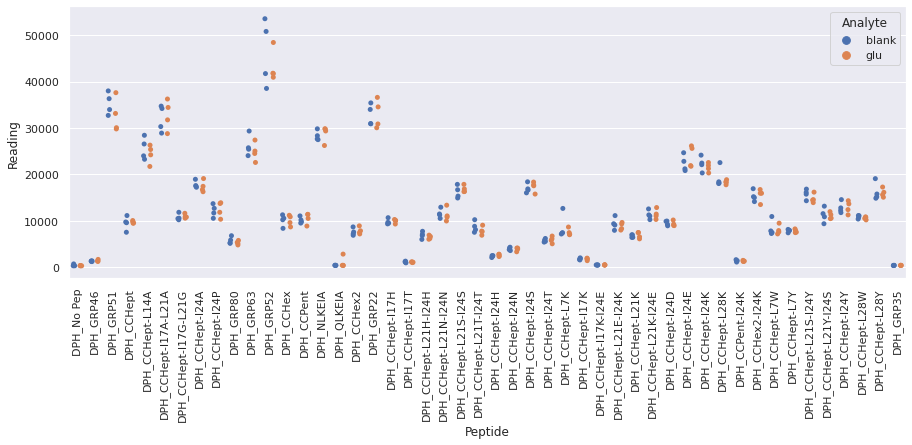

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_2.xlsx
Drawing scatter plot of data spread for gluam_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

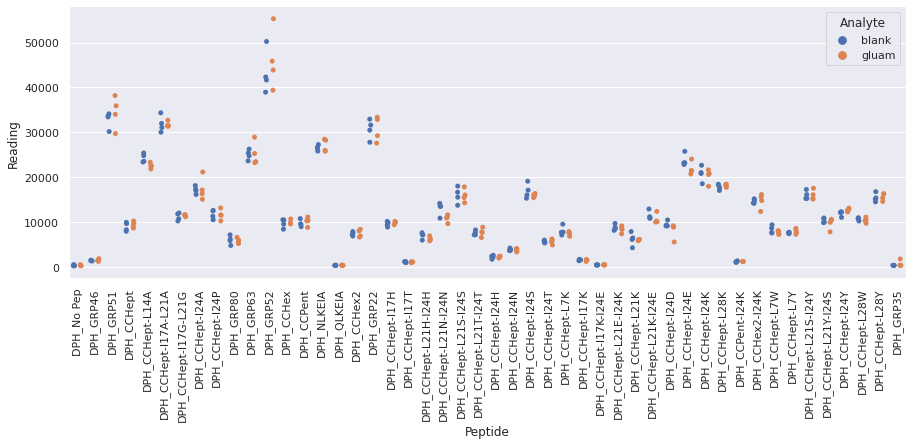

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_2.xlsx
Drawing scatter plot of data spread for mal_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

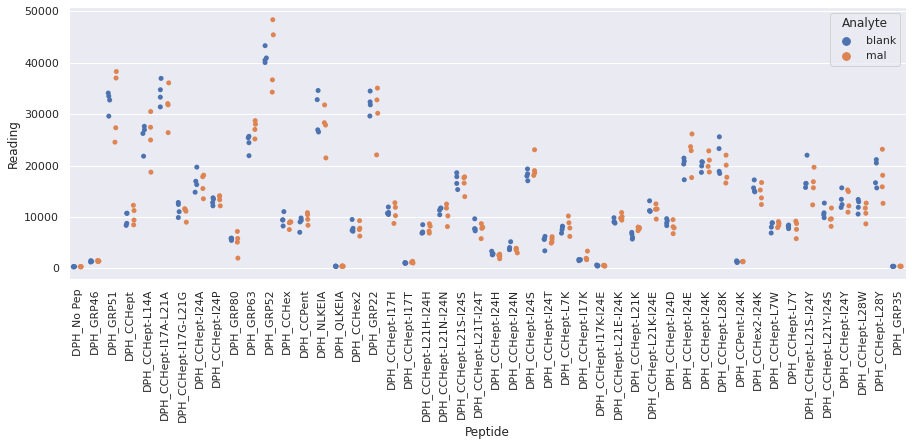

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_2.xlsx
Drawing scatter plot of data spread for man_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

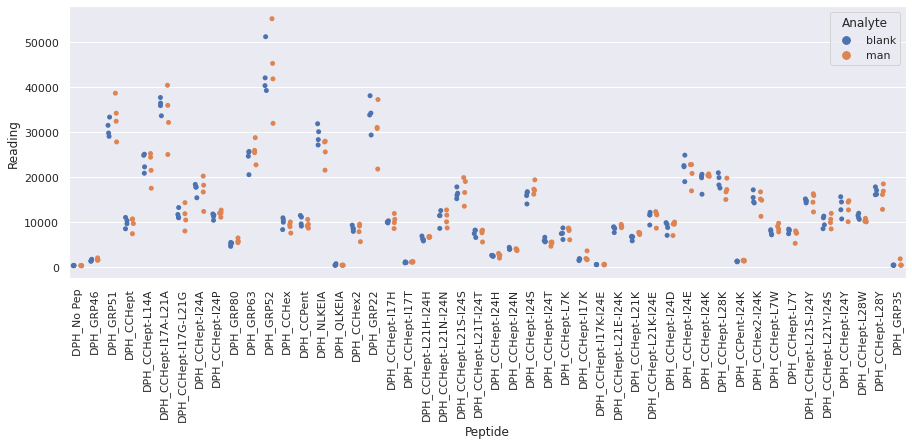

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_3.xlsx
Drawing scatter plot of data spread for fru_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

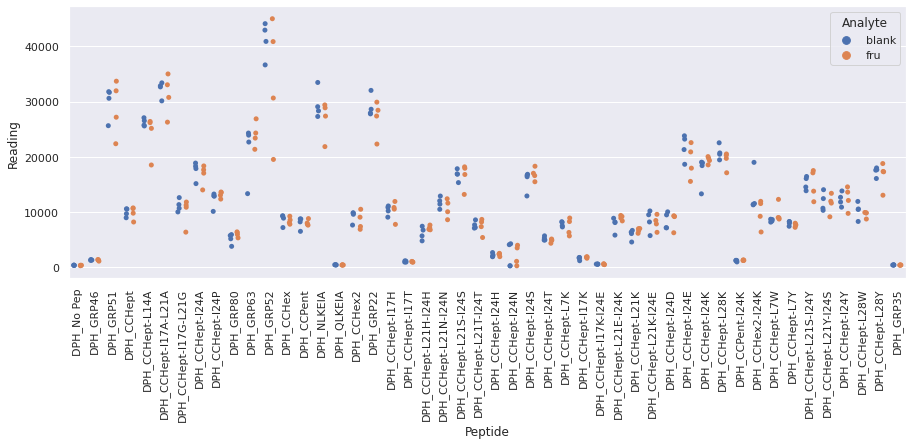

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_3.xlsx
Drawing scatter plot of data spread for glu_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

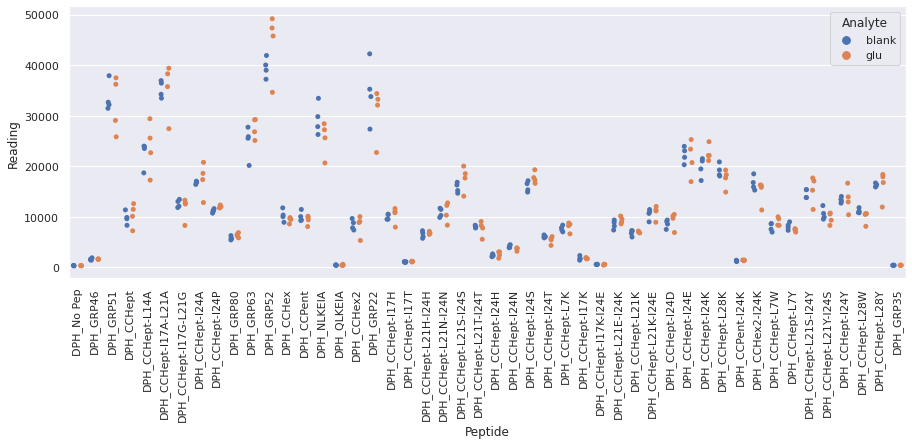

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_3.xlsx
Drawing scatter plot of data spread for gluam_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

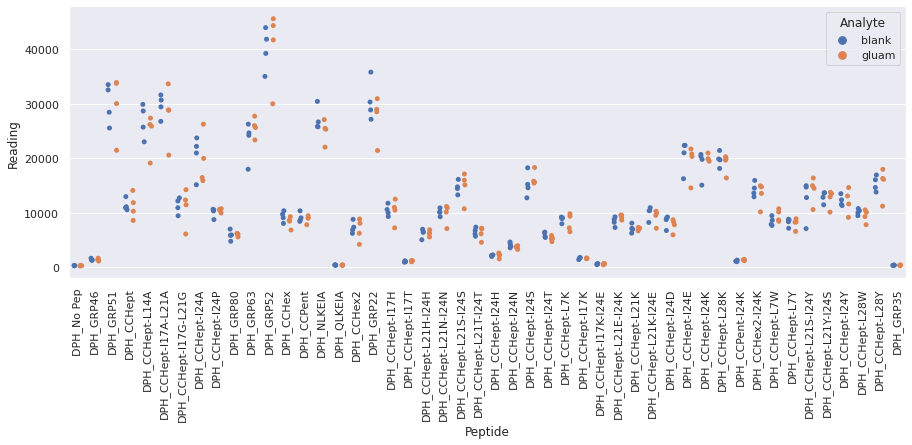

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_3.xlsx
Drawing scatter plot of data spread for mal_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

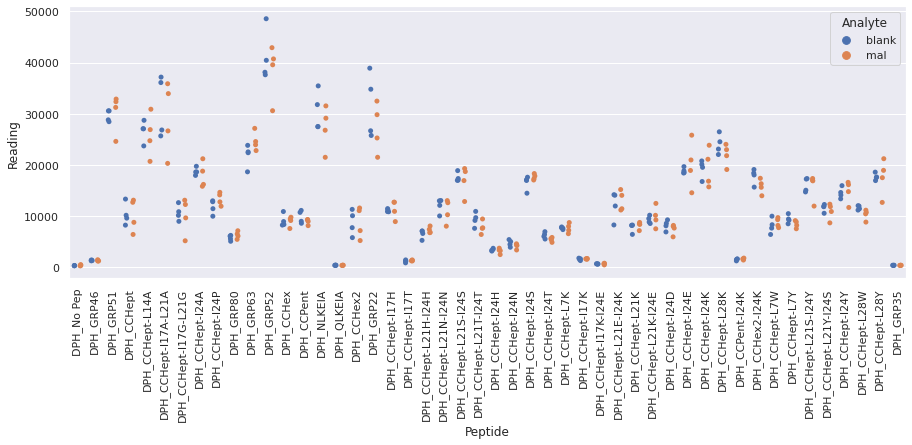

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_3.xlsx
Drawing scatter plot of data spread for man_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

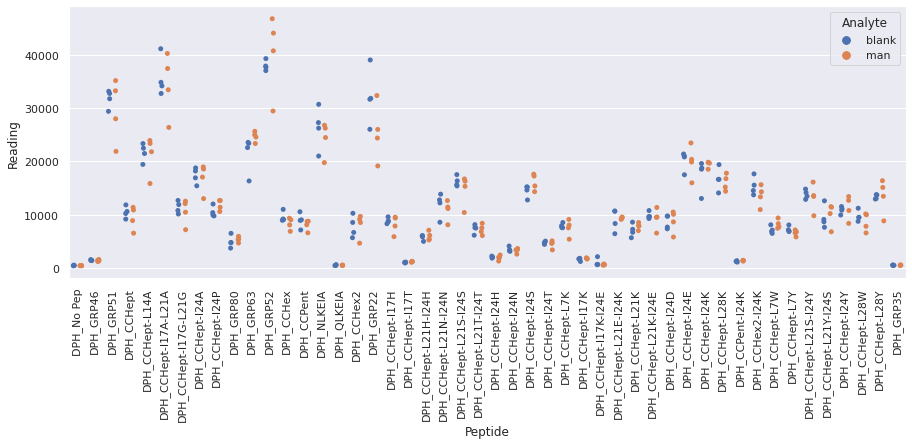

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_4.xlsx
Drawing scatter plot of data spread for fru_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

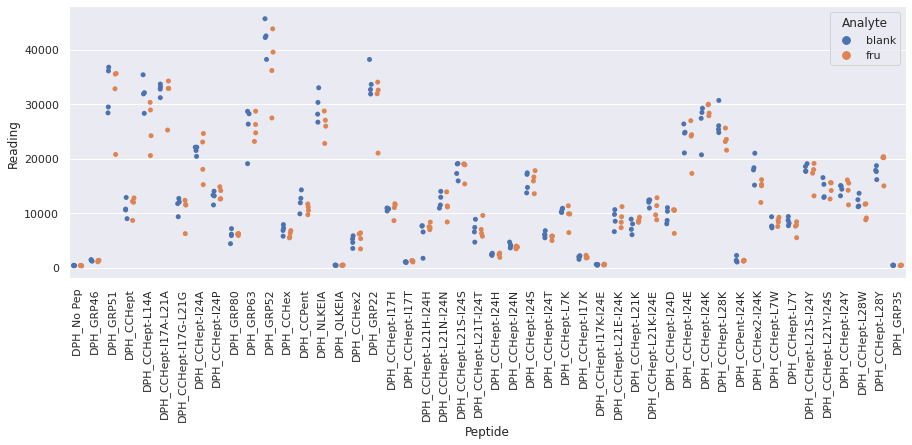

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_4.xlsx
Drawing scatter plot of data spread for glu_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

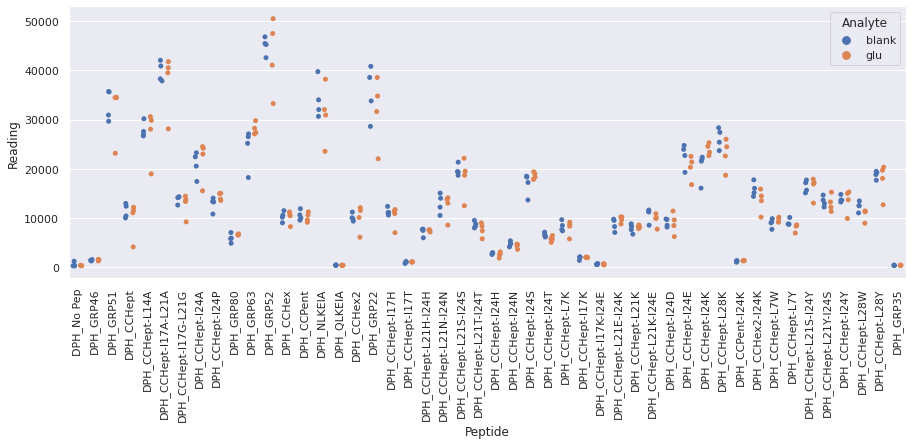

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_4.xlsx
Drawing scatter plot of data spread for gluam_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

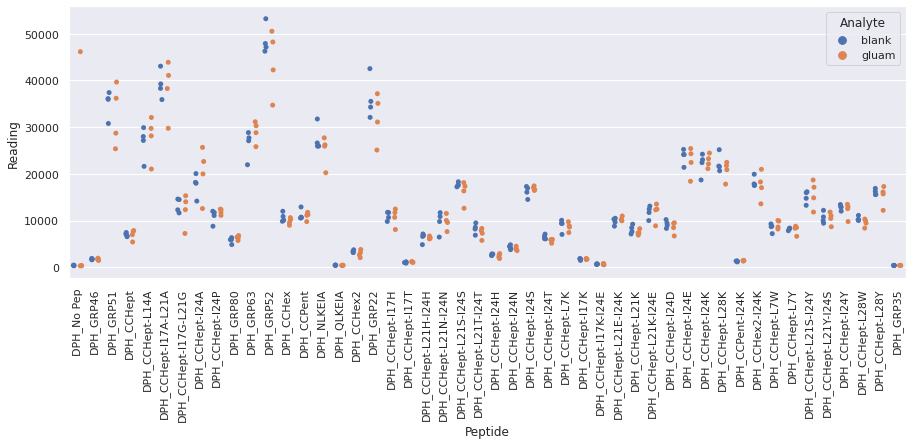

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_4.xlsx
Drawing scatter plot of data spread for mal_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

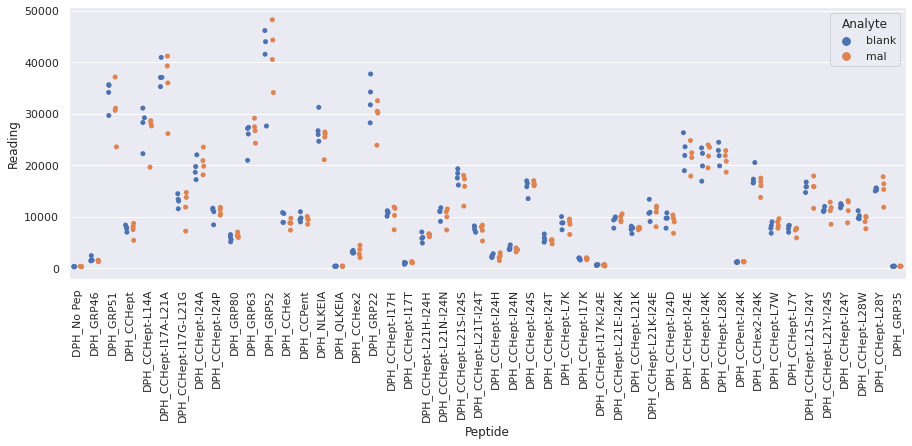

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_4.xlsx
Drawing scatter plot of data spread for man_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

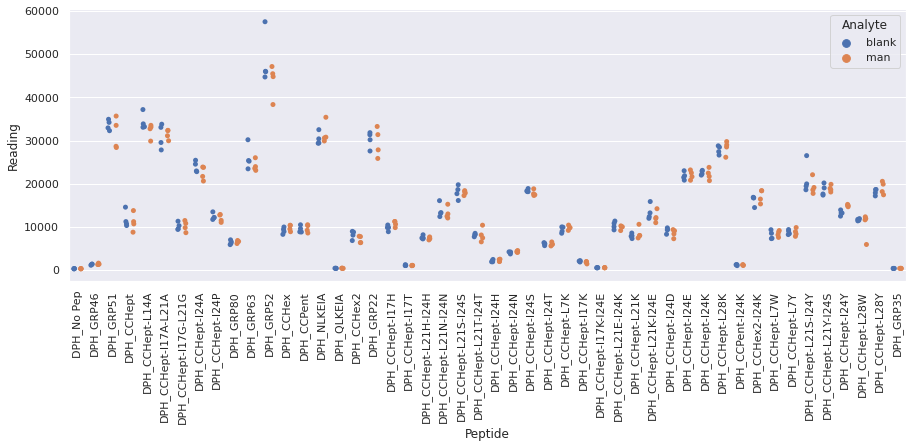

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_5.xlsx
Drawing scatter plot of data spread for fru_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

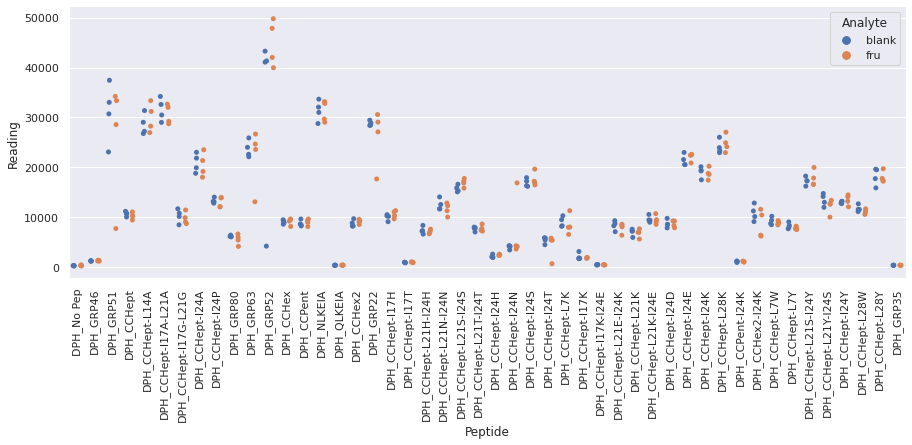

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_5.xlsx
Drawing scatter plot of data spread for glu_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

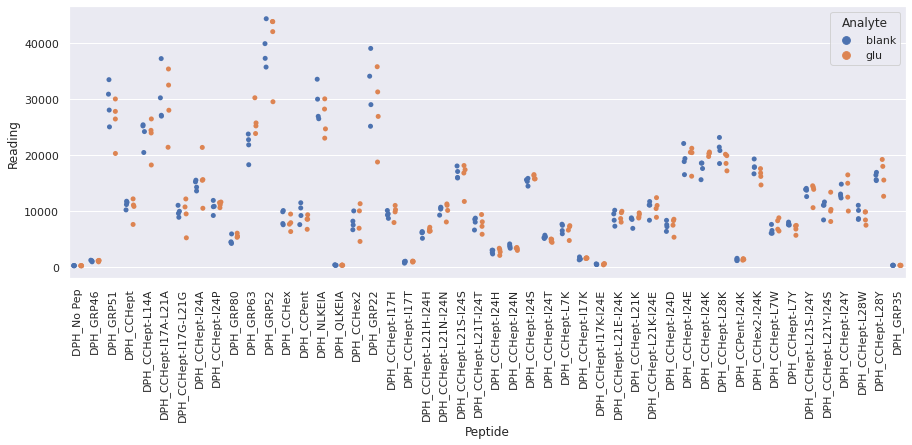

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_5.xlsx
Drawing scatter plot of data spread for gluam_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

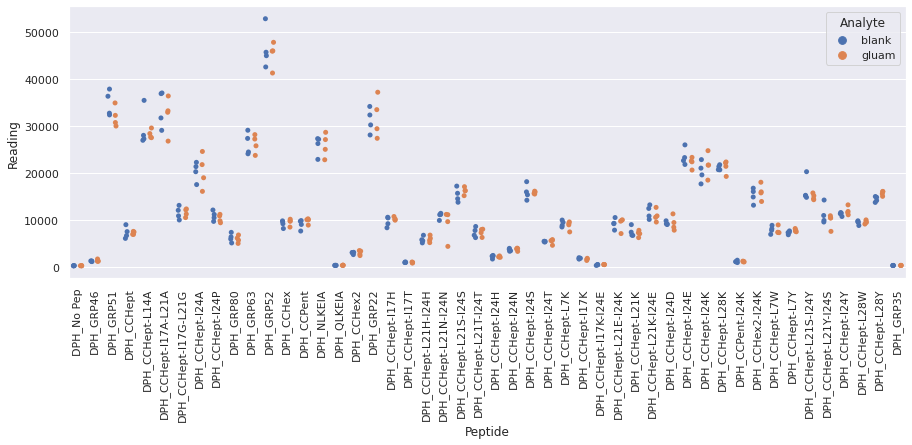

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_5.xlsx
Drawing scatter plot of data spread for mal_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

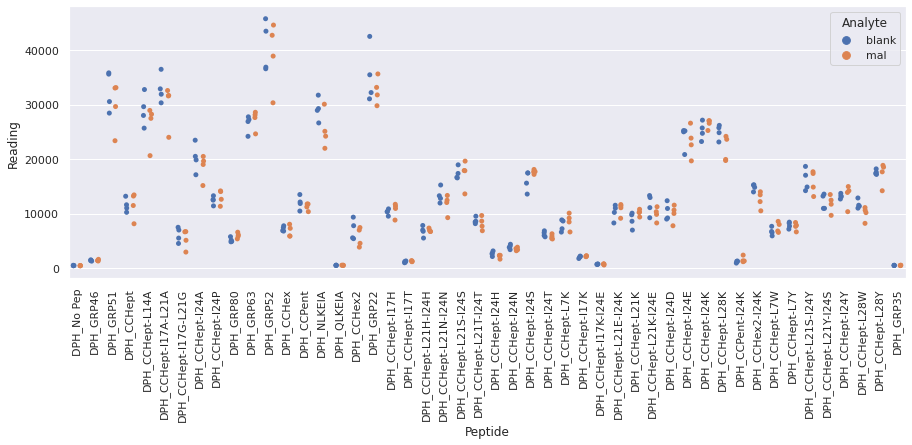

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_5.xlsx
Drawing scatter plot of data spread for man_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

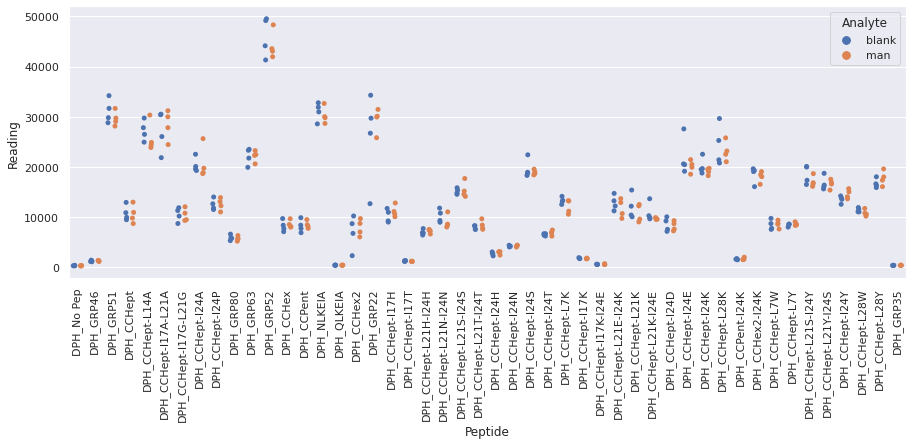

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_6.xlsx
Drawing scatter plot of data spread for fru_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

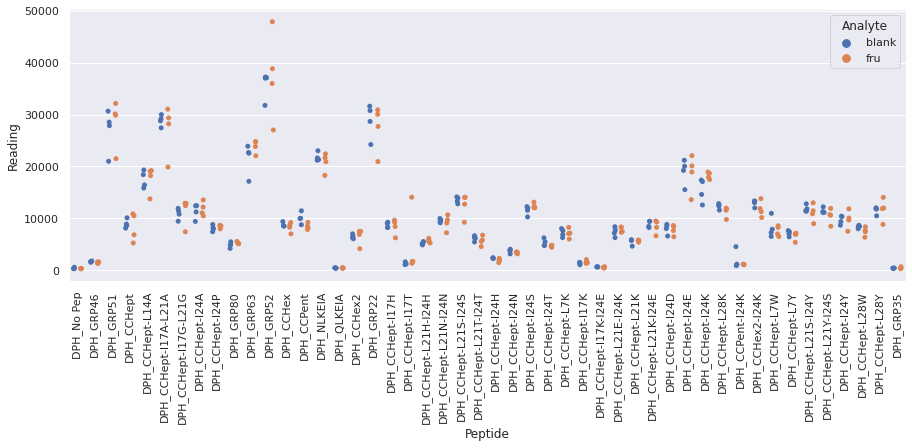

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_6.xlsx
Drawing scatter plot of data spread for glu_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

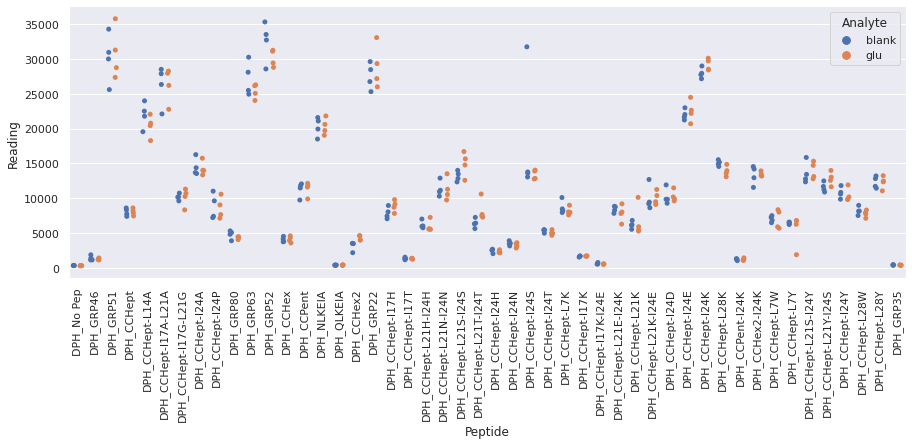

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_6.xlsx
Drawing scatter plot of data spread for gluam_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

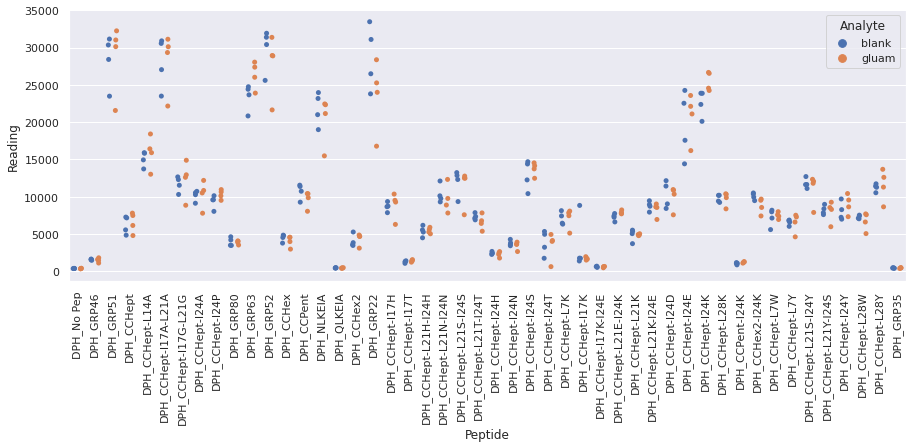

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_6.xlsx
Drawing scatter plot of data spread for mal_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

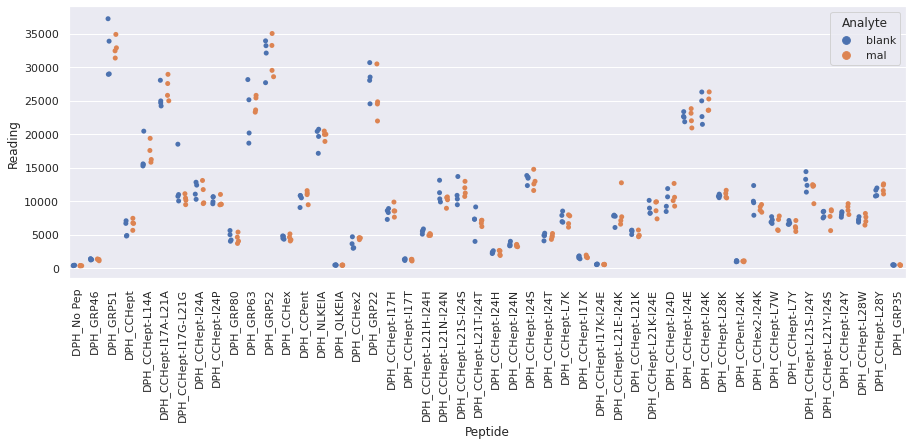

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_6.xlsx
Drawing scatter plot of data spread for man_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

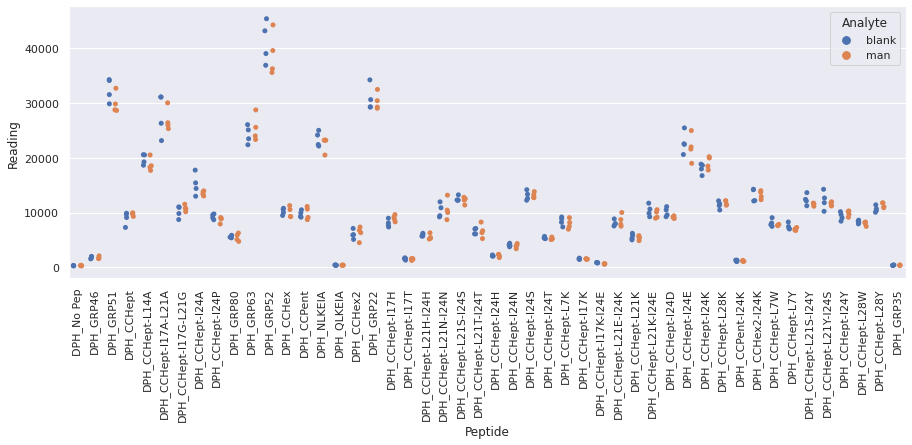

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_7.xlsx
Drawing scatter plot of data spread for fru_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

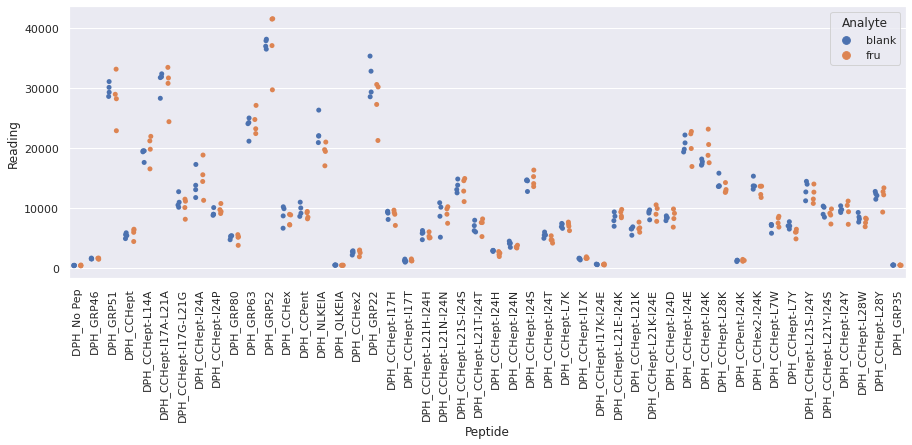

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_7.xlsx
Drawing scatter plot of data spread for glu_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

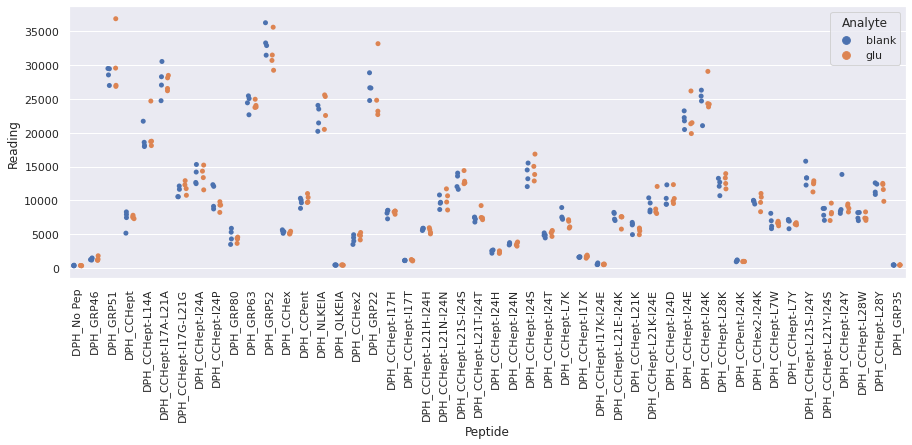

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_7.xlsx
Drawing scatter plot of data spread for gluam_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

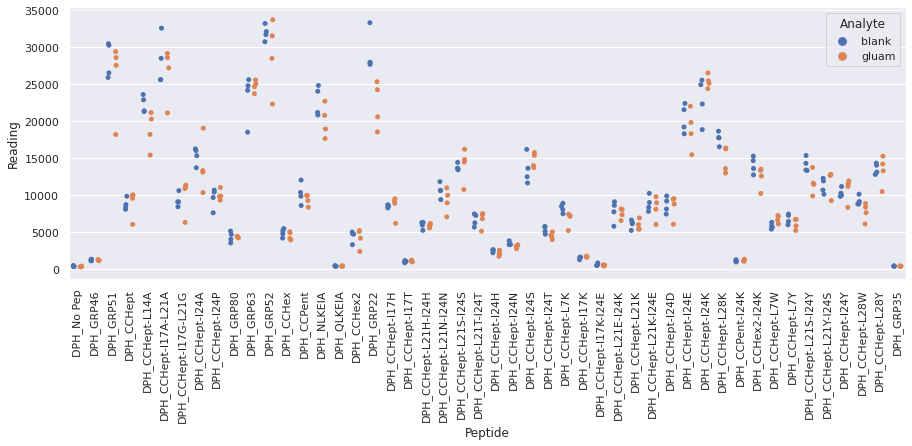

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_7.xlsx
Drawing scatter plot of data spread for mal_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

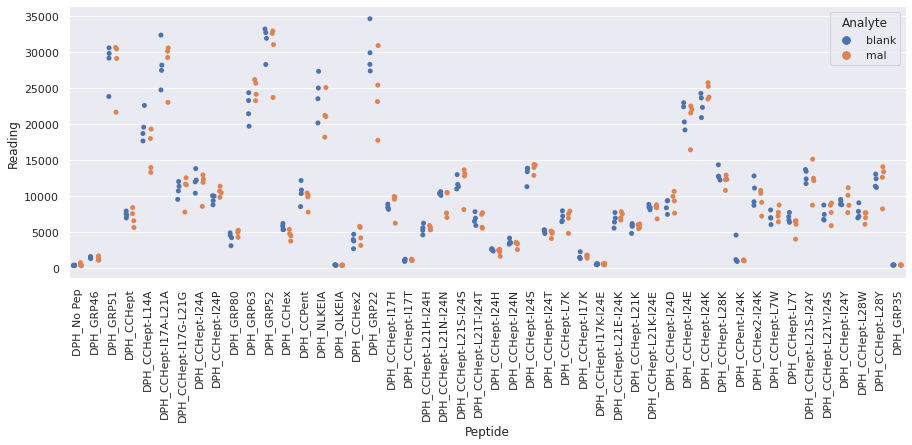

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_7.xlsx
Drawing scatter plot of data spread for man_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

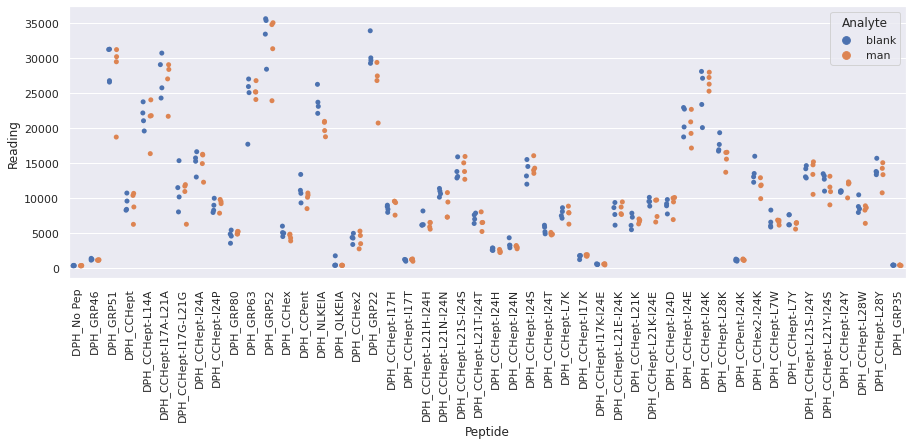

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_8.xlsx
Drawing scatter plot of data spread for fru_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

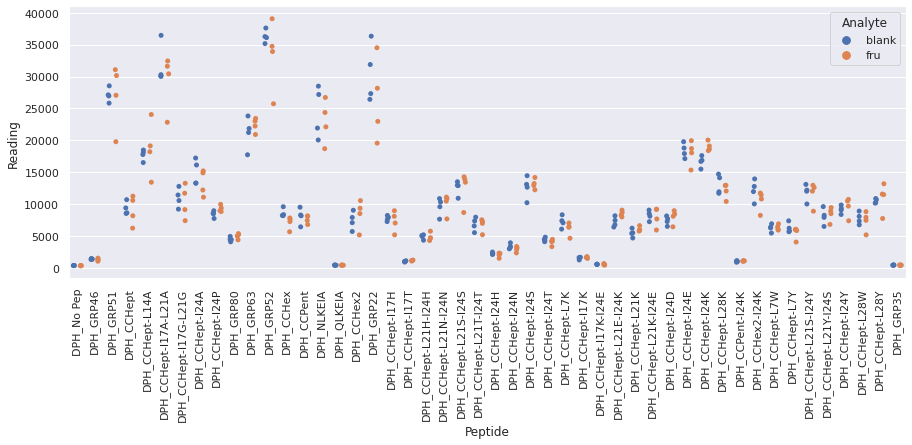

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_8.xlsx
Drawing scatter plot of data spread for glu_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

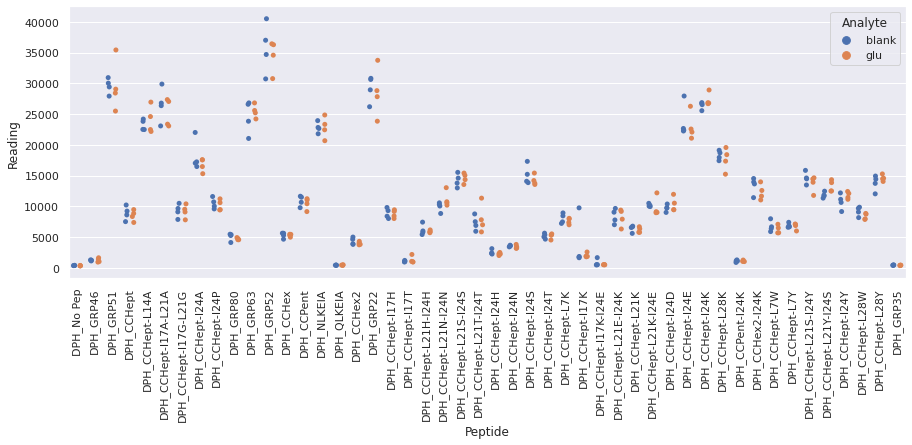

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_8.xlsx
Drawing scatter plot of data spread for gluam_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

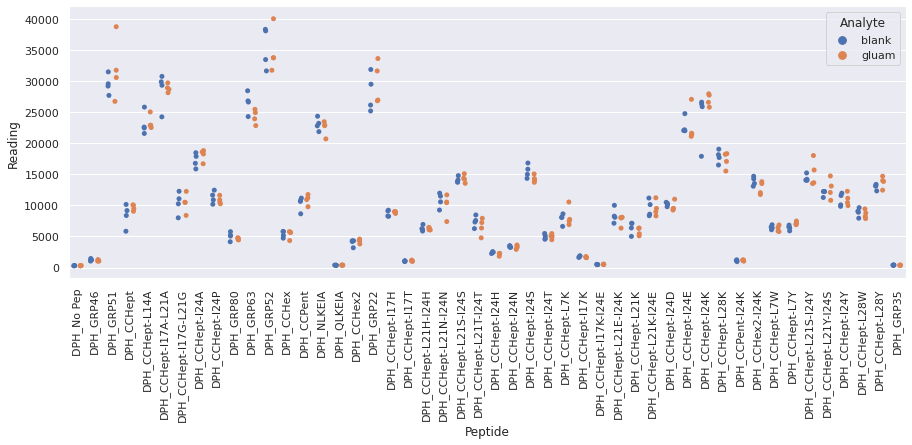

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_8.xlsx
Drawing scatter plot of data spread for mal_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

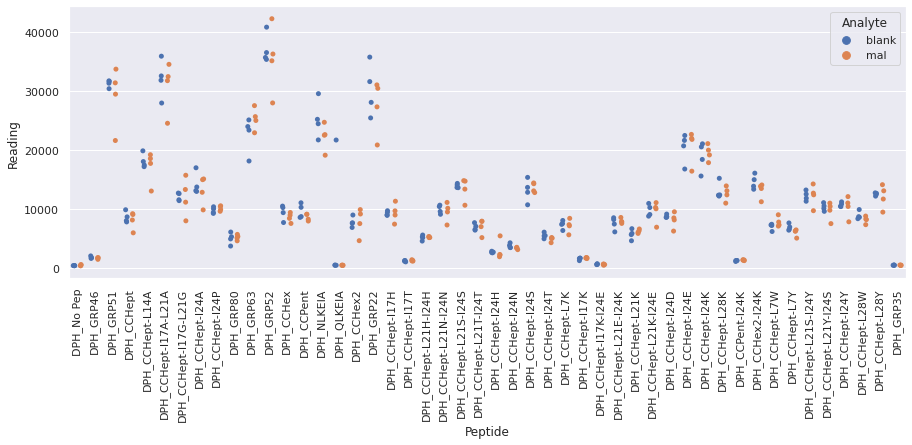

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_8.xlsx
Drawing scatter plot of data spread for man_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

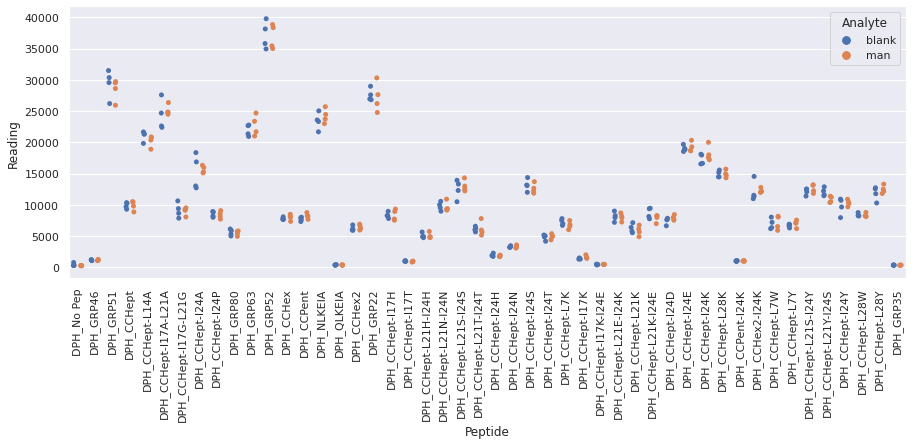

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_9.xlsx
Drawing scatter plot of data spread for fru_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

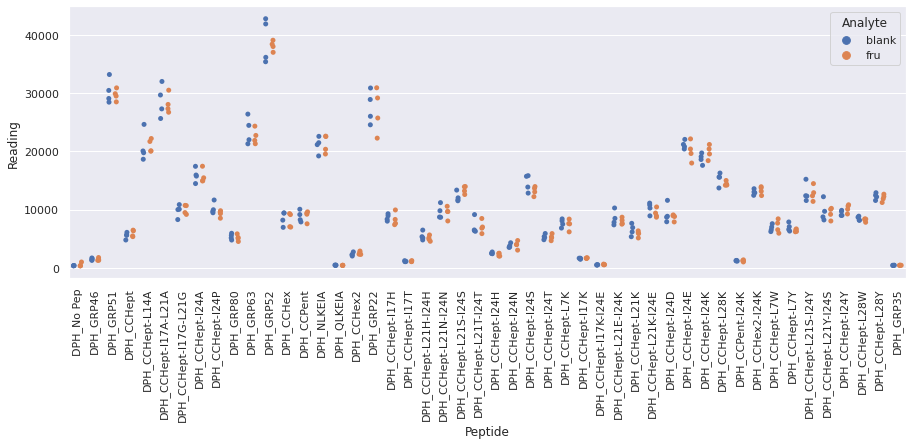

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_9.xlsx
Drawing scatter plot of data spread for glu_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

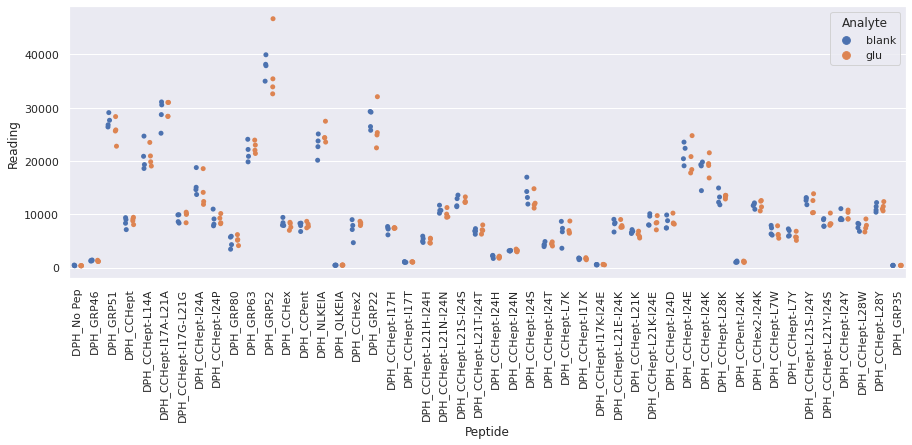

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_9.xlsx
Drawing scatter plot of data spread for gluam_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

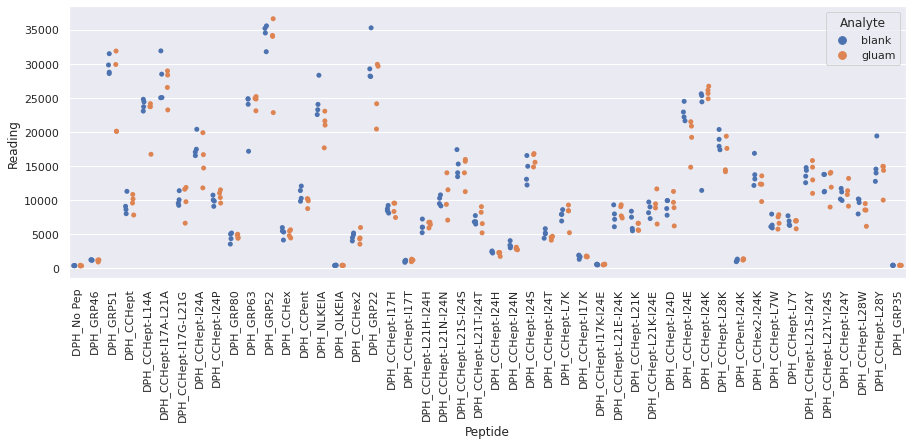

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_9.xlsx
Drawing scatter plot of data spread for mal_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

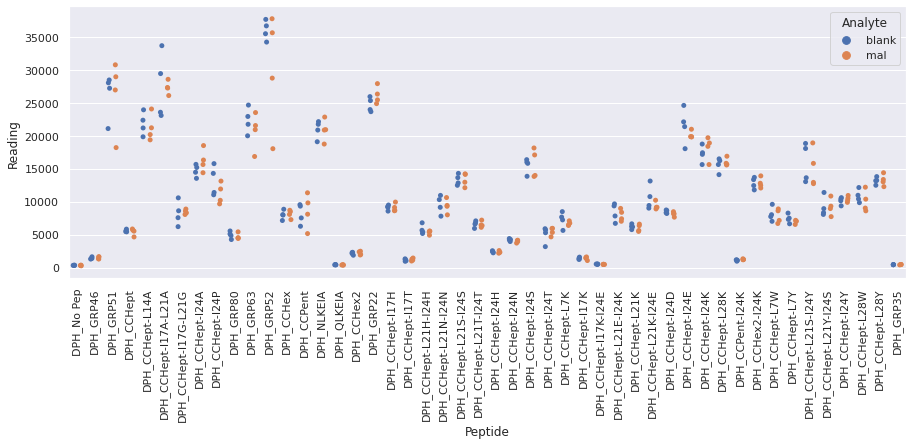

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_9.xlsx
Drawing scatter plot of data spread for man_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

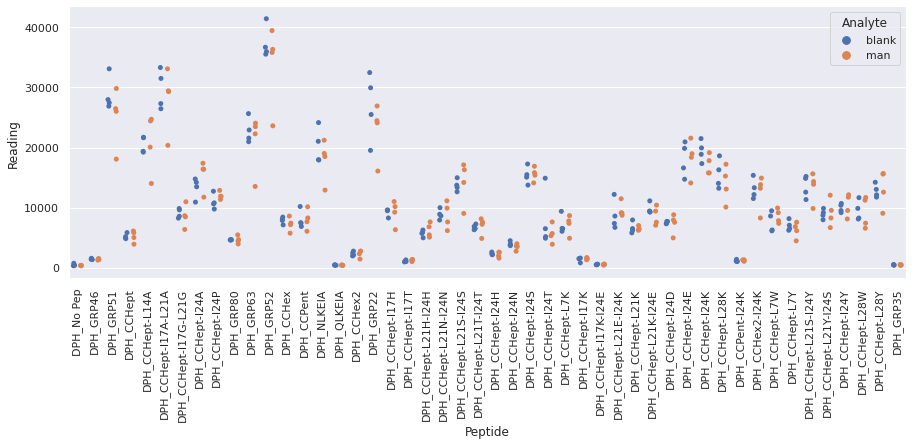

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_10.xlsx
Drawing scatter plot of data spread for fru_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

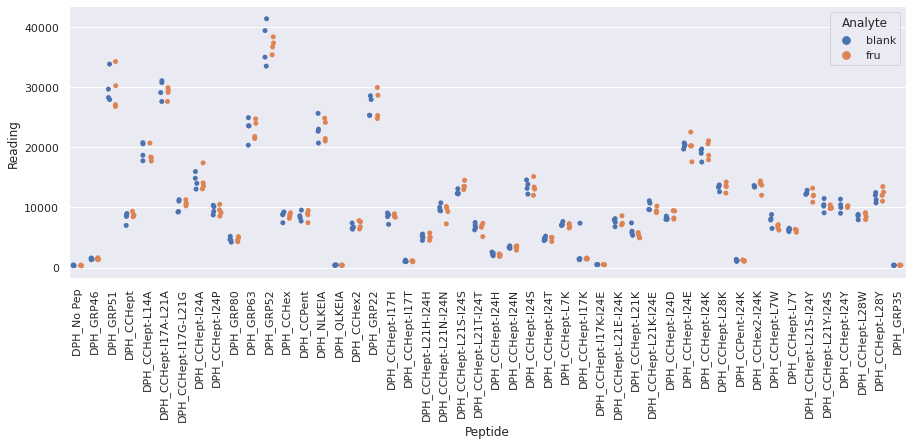

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_10.xlsx
Drawing scatter plot of data spread for glu_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

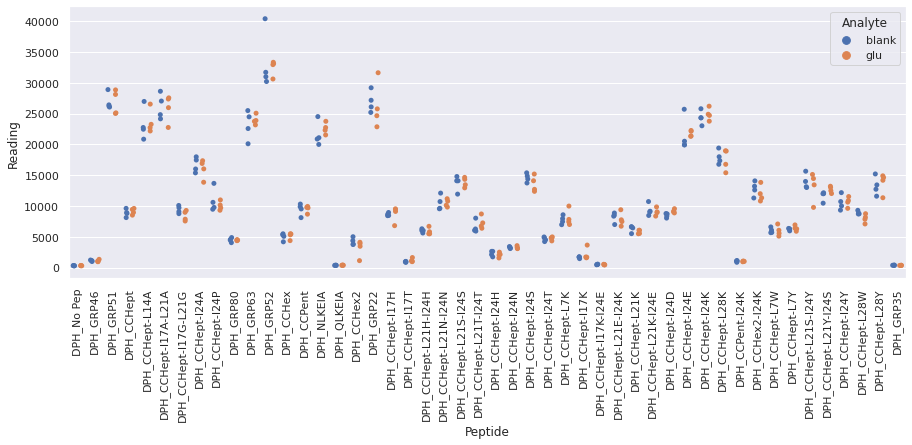

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_10.xlsx
Drawing scatter plot of data spread for gluam_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

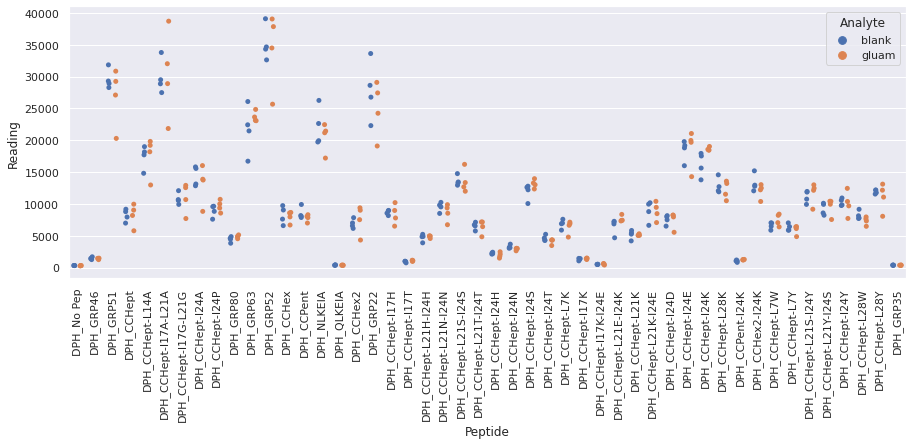

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_10.xlsx
Drawing scatter plot of data spread for mal_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

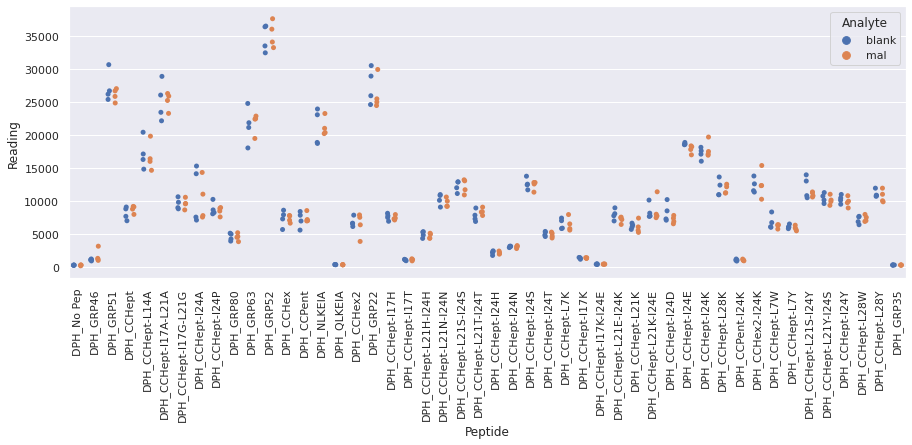

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_10.xlsx
Drawing scatter plot of data spread for man_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

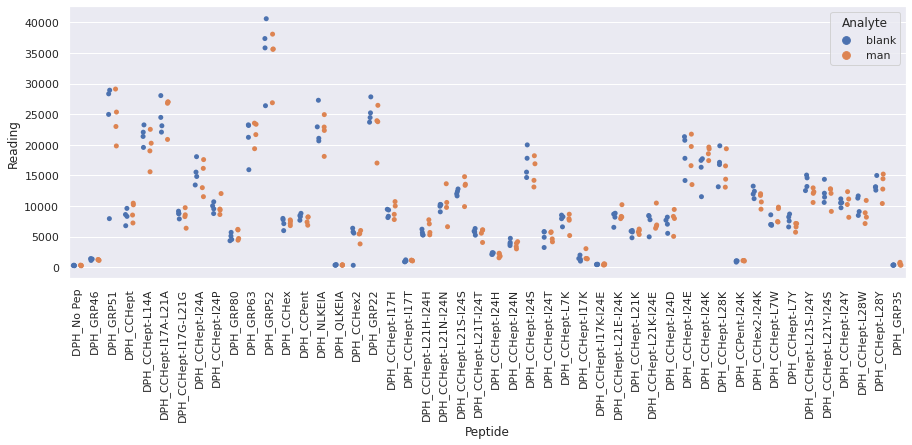

Drawing scatter plot of data spread for fru_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

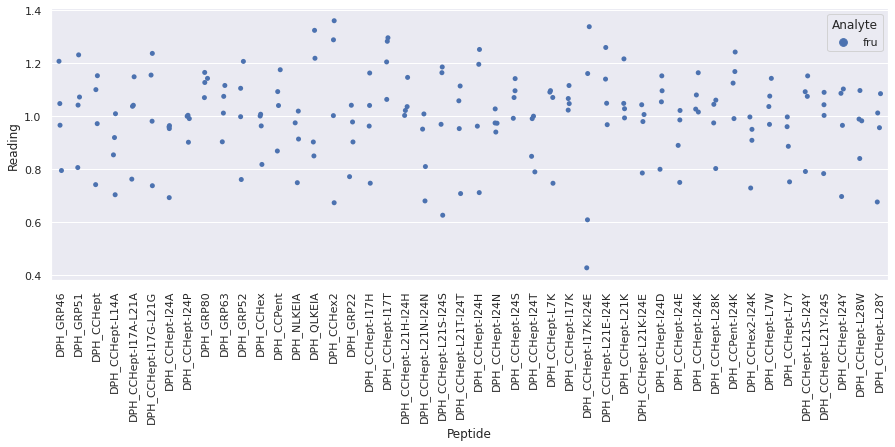

Drawing scatter plot of data spread for glu_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

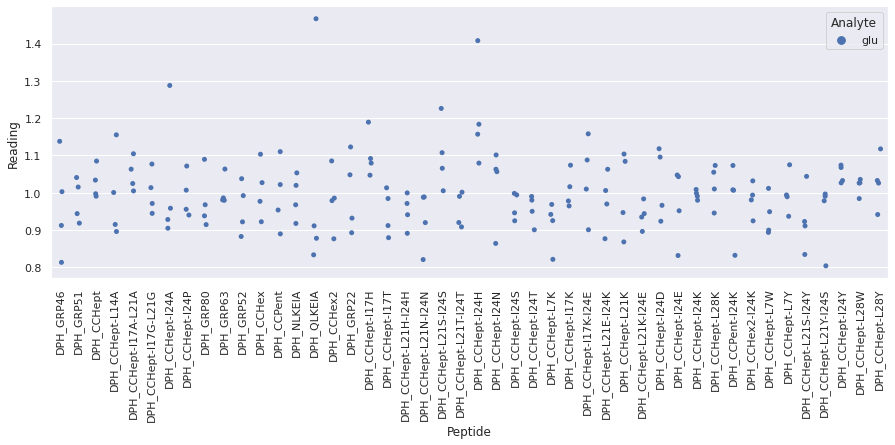

Drawing scatter plot of data spread for gluam_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

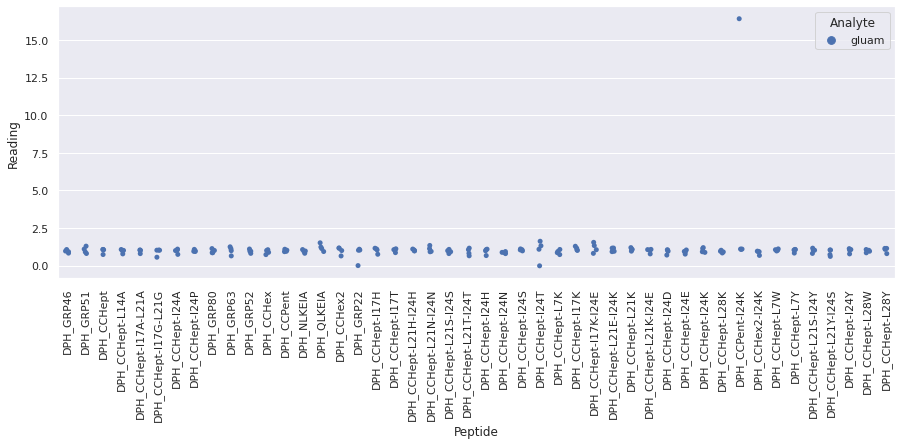

Drawing scatter plot of data spread for mal_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

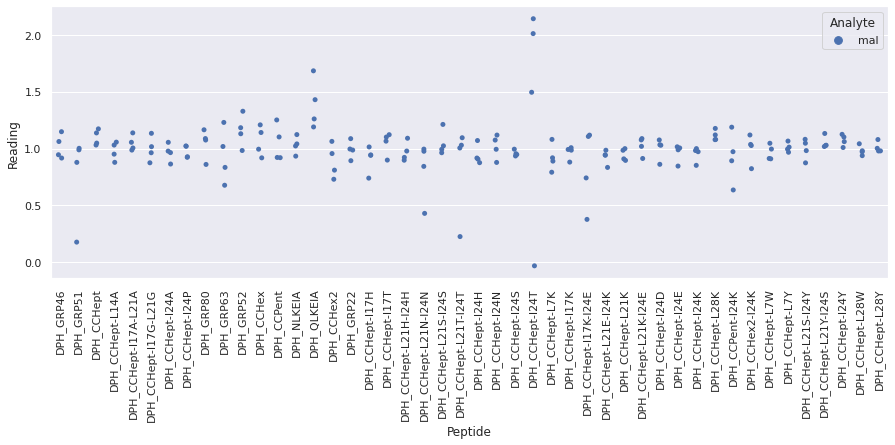

Drawing scatter plot of data spread for man_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

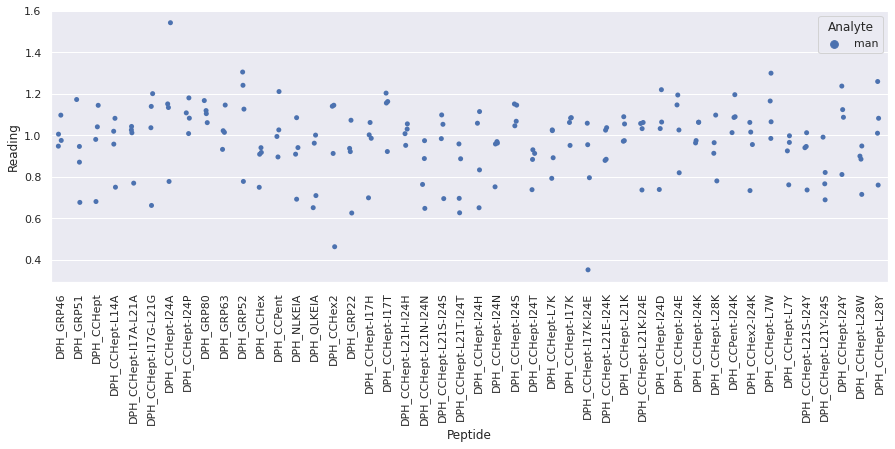

Drawing scatter plot of data spread for fru_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

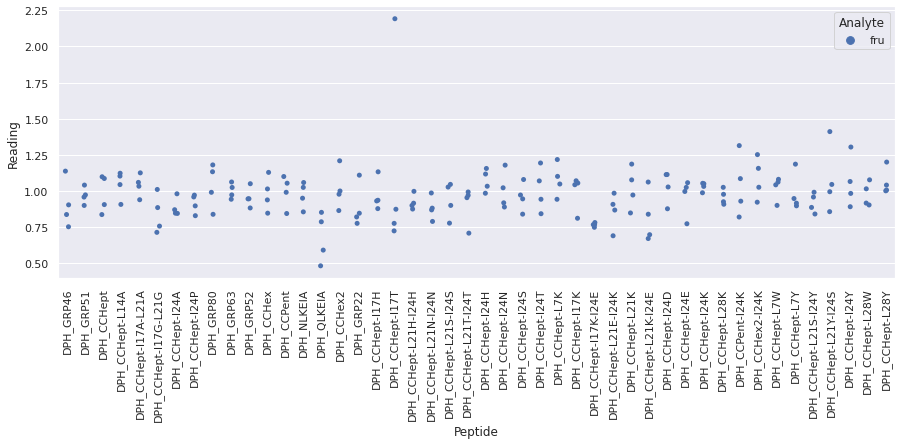

Drawing scatter plot of data spread for glu_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

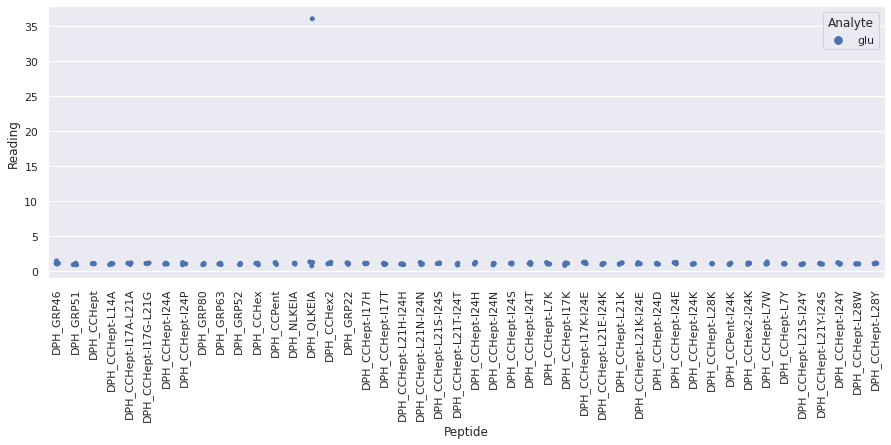

Drawing scatter plot of data spread for gluam_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

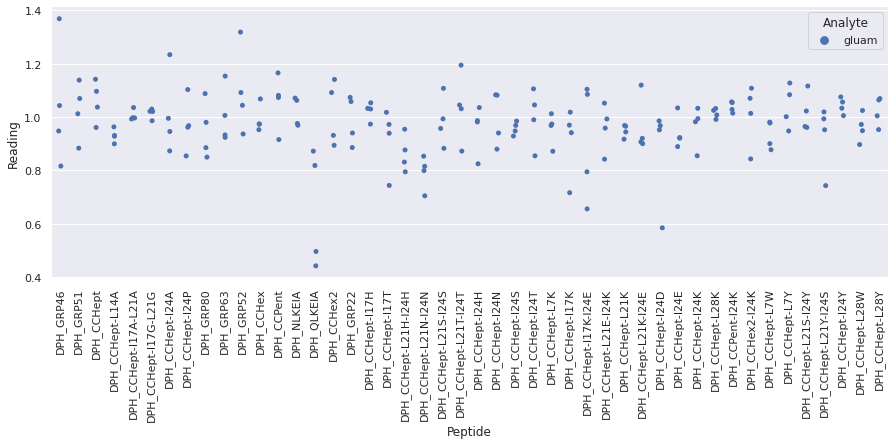

Drawing scatter plot of data spread for mal_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

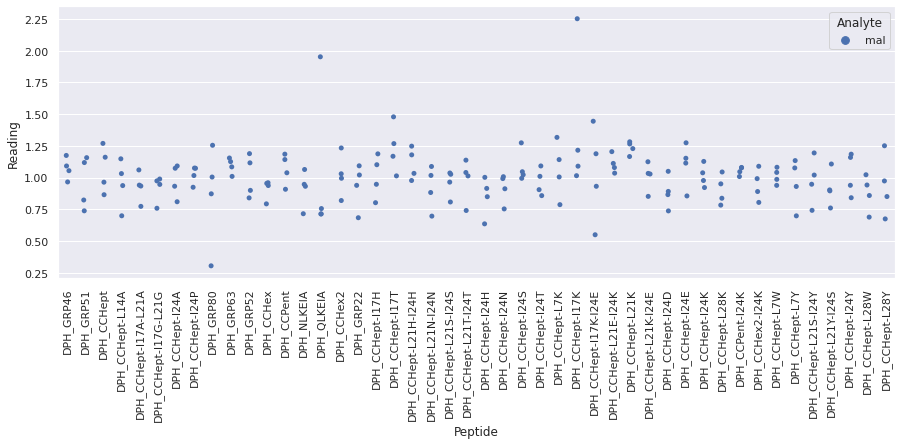

Drawing scatter plot of data spread for man_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

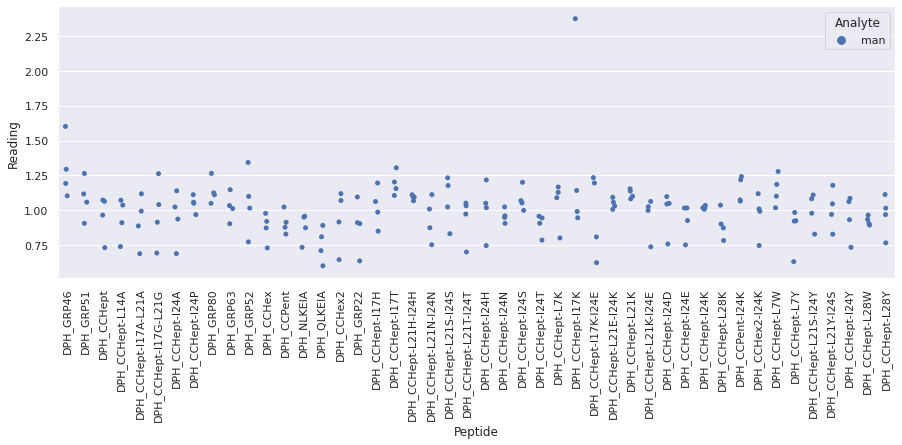

Drawing scatter plot of data spread for fru_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

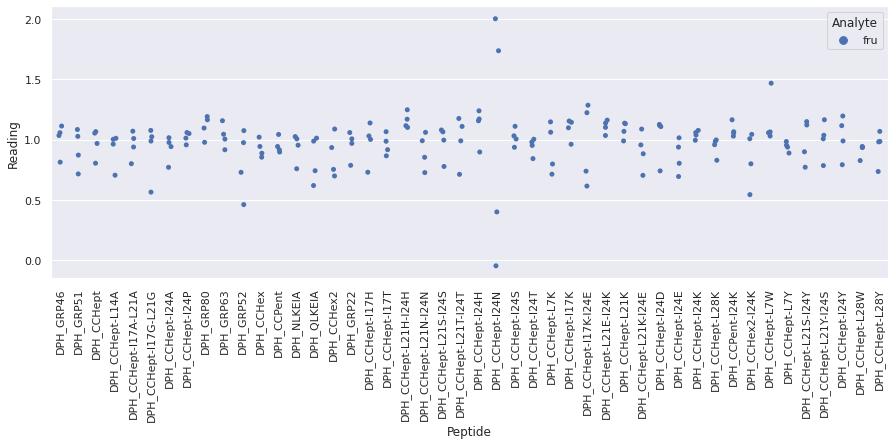

Drawing scatter plot of data spread for glu_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

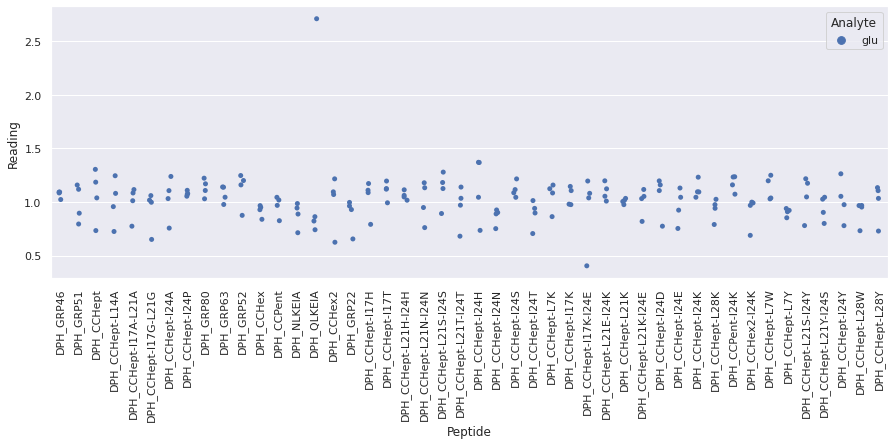

Drawing scatter plot of data spread for gluam_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

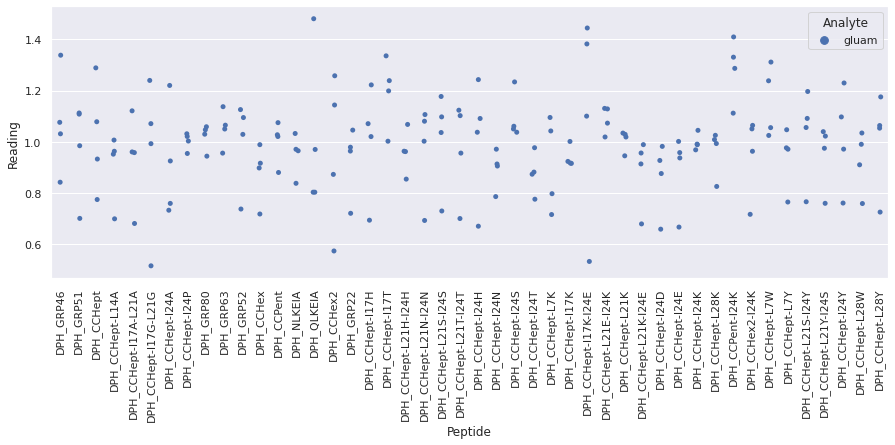

Drawing scatter plot of data spread for mal_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

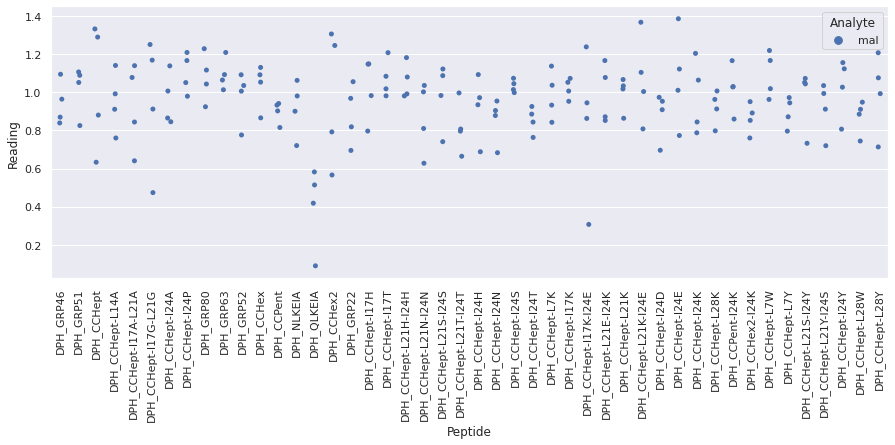

Drawing scatter plot of data spread for man_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

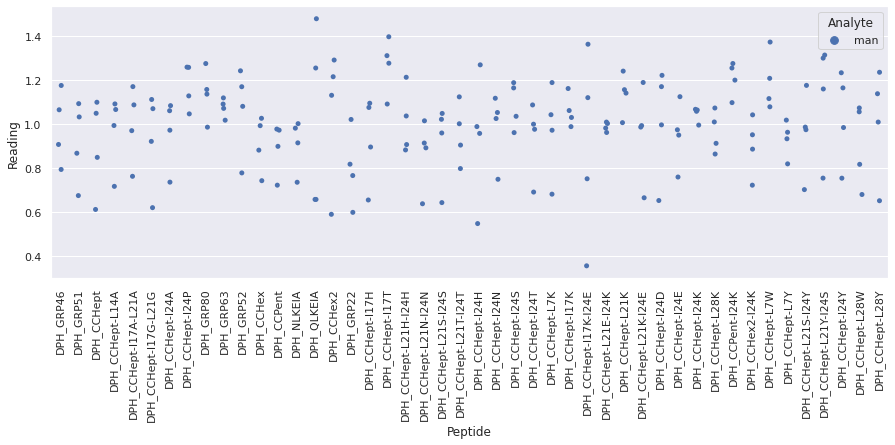

Drawing scatter plot of data spread for fru_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

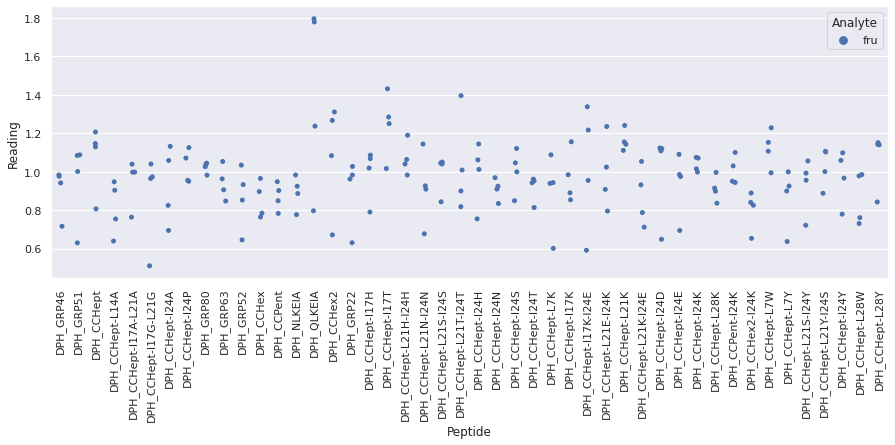

Drawing scatter plot of data spread for glu_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

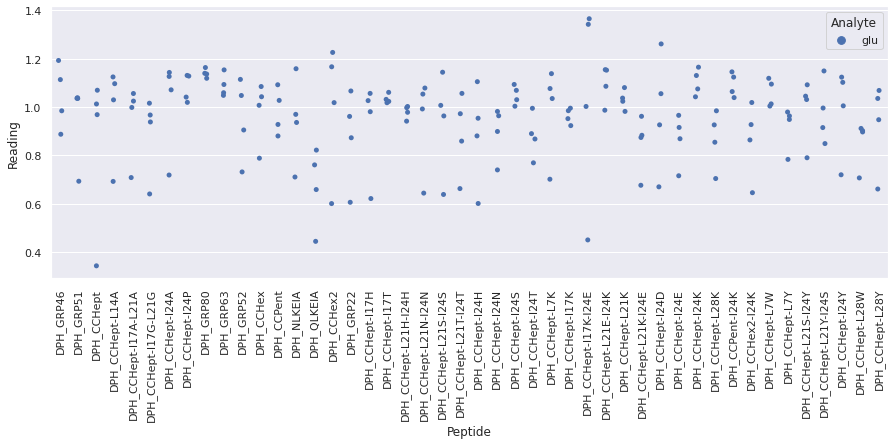

Drawing scatter plot of data spread for gluam_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

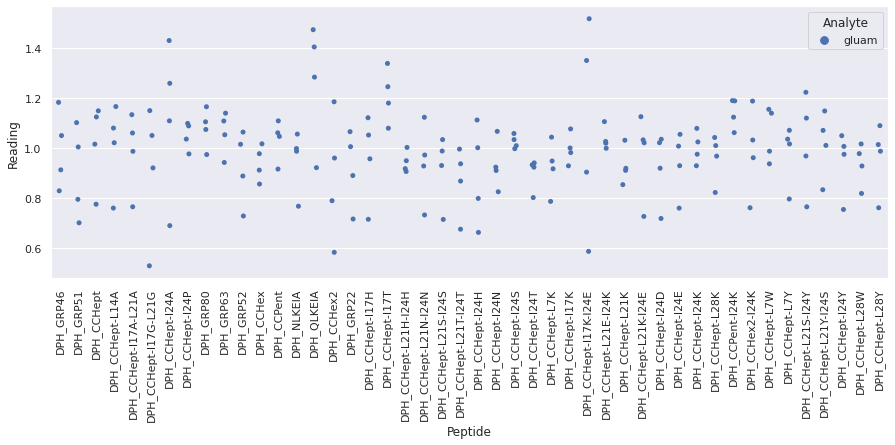

Drawing scatter plot of data spread for mal_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

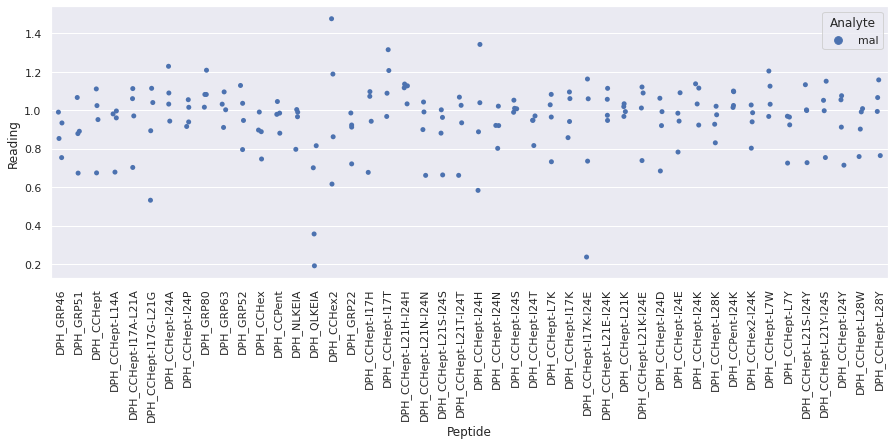

Drawing scatter plot of data spread for man_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

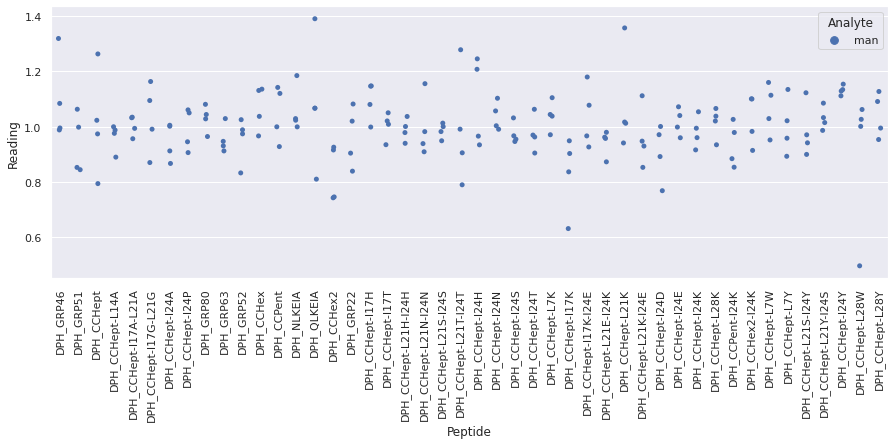

Drawing scatter plot of data spread for fru_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

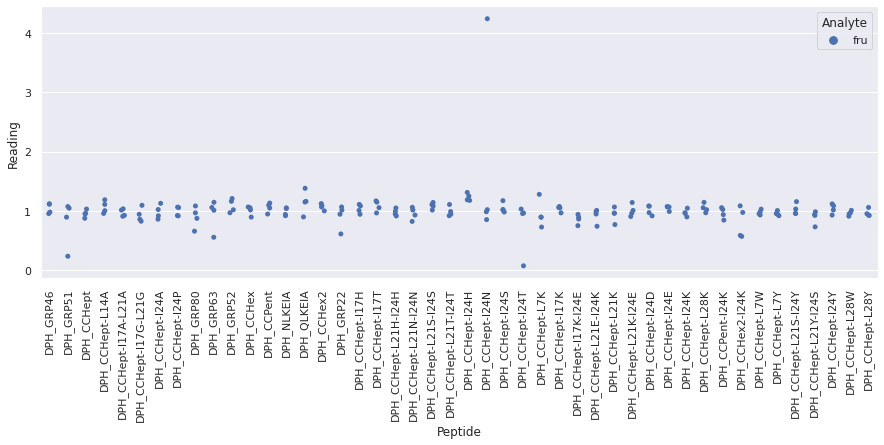

Drawing scatter plot of data spread for glu_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

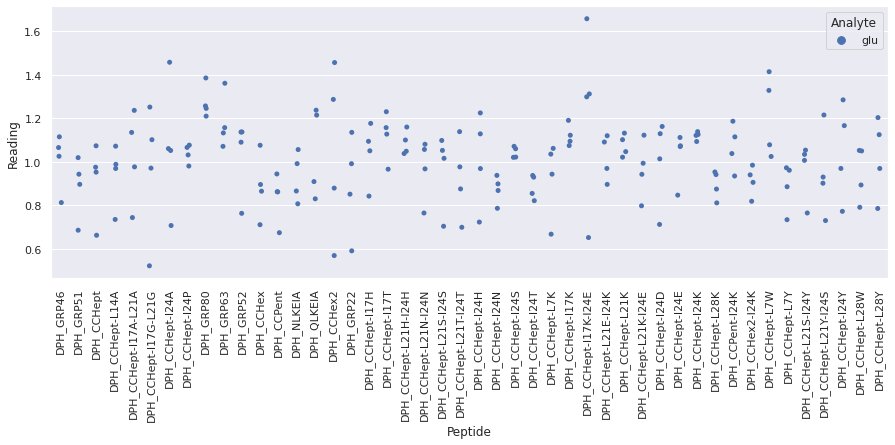

Drawing scatter plot of data spread for gluam_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

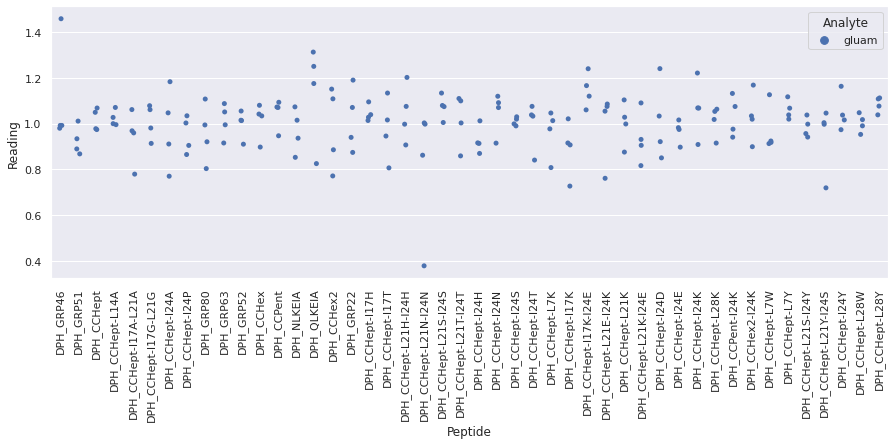

Drawing scatter plot of data spread for mal_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

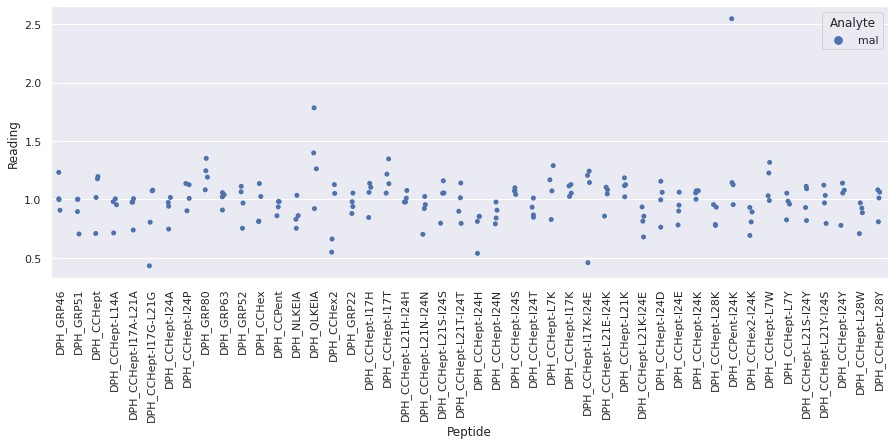

Drawing scatter plot of data spread for man_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

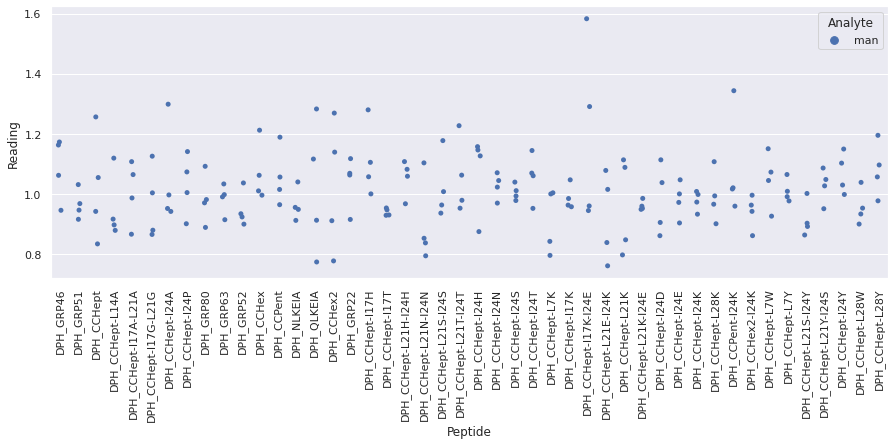

Drawing scatter plot of data spread for fru_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

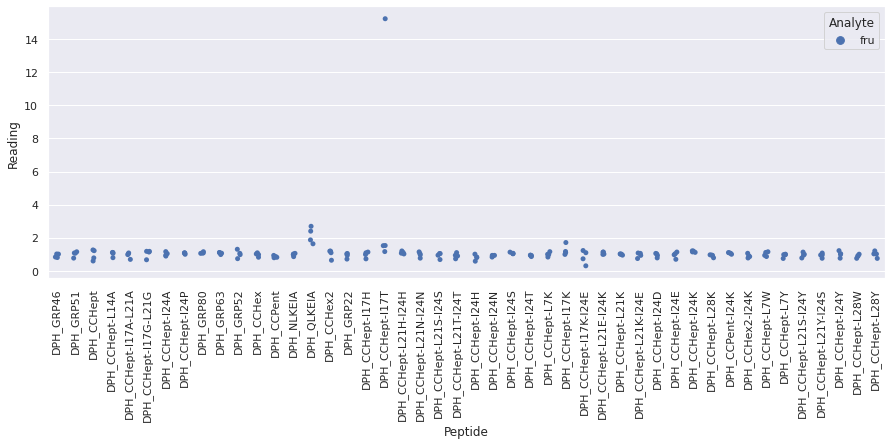

Drawing scatter plot of data spread for glu_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

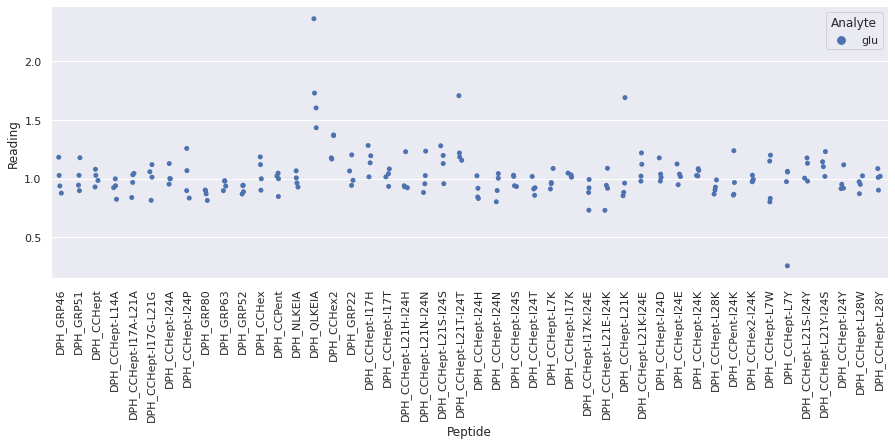

Drawing scatter plot of data spread for gluam_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

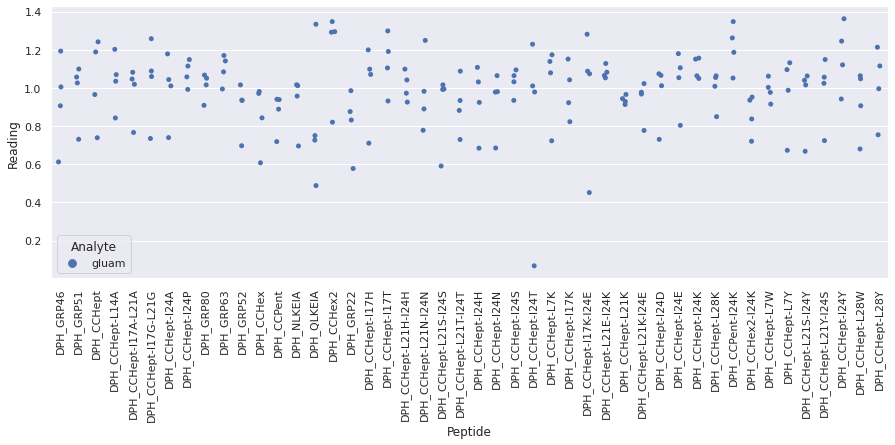

Drawing scatter plot of data spread for mal_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

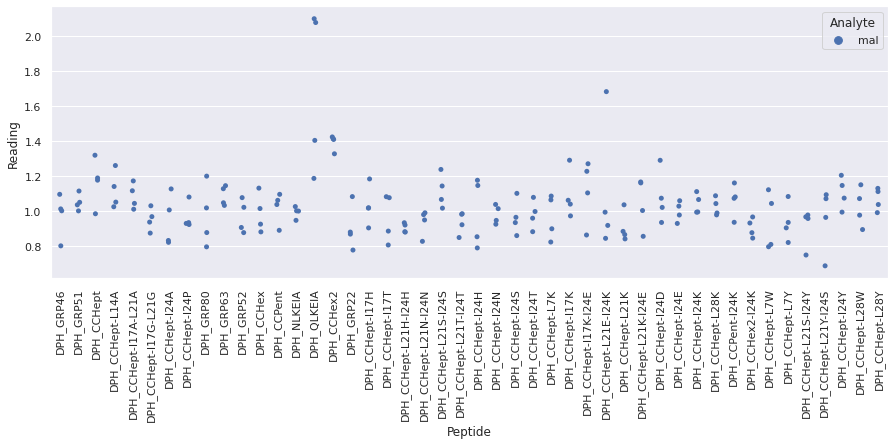

Drawing scatter plot of data spread for man_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

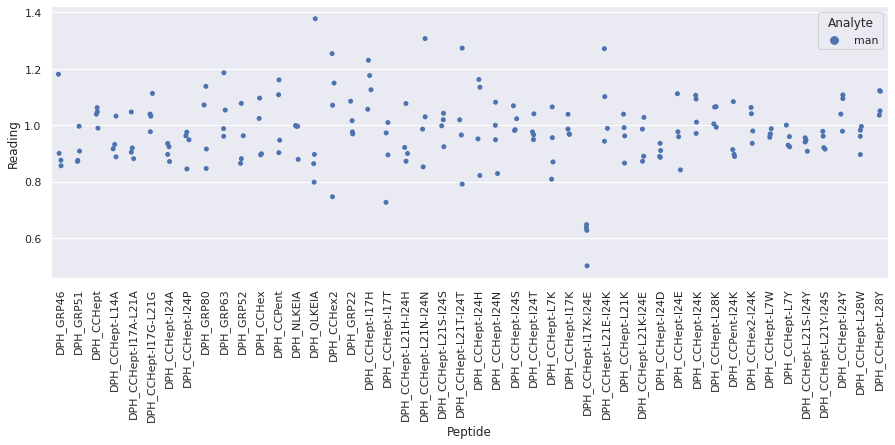

Drawing scatter plot of data spread for fru_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

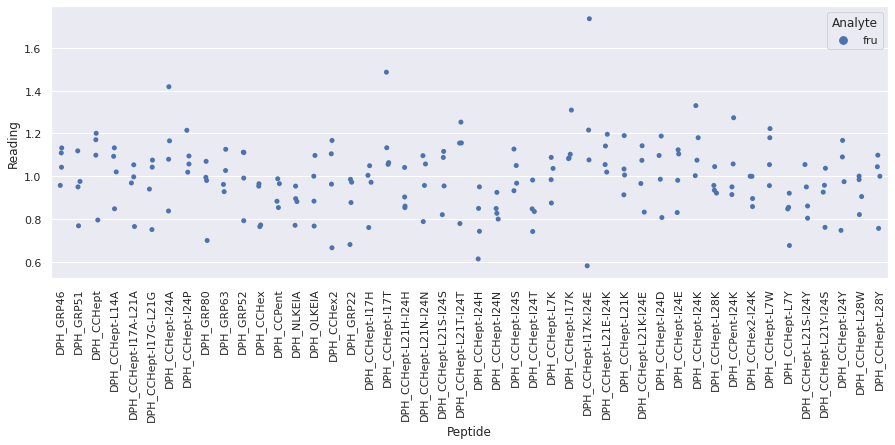

Drawing scatter plot of data spread for glu_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

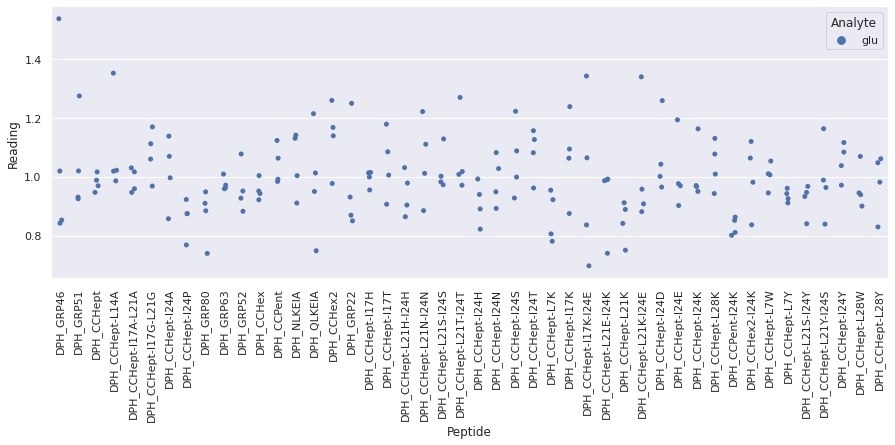

Drawing scatter plot of data spread for gluam_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

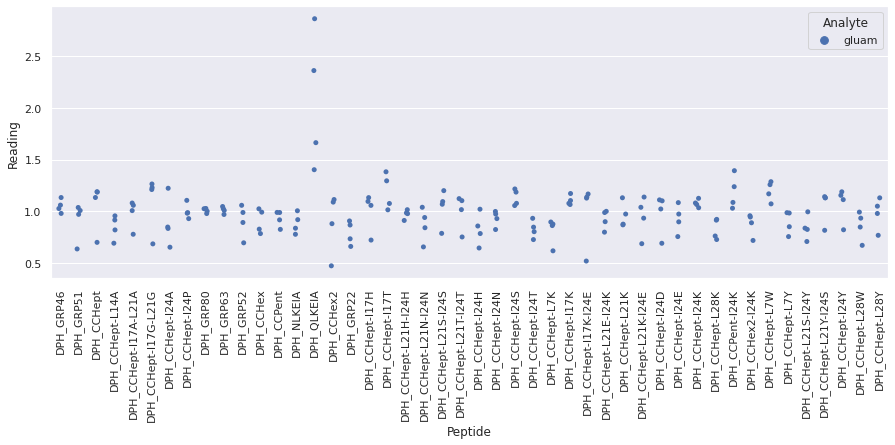

 WARNING - median fluorescence of (mal + DPH_QLKEIA + fluorophore) is less than fluorescence of (mal + fluorophore) alone on plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for mal_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

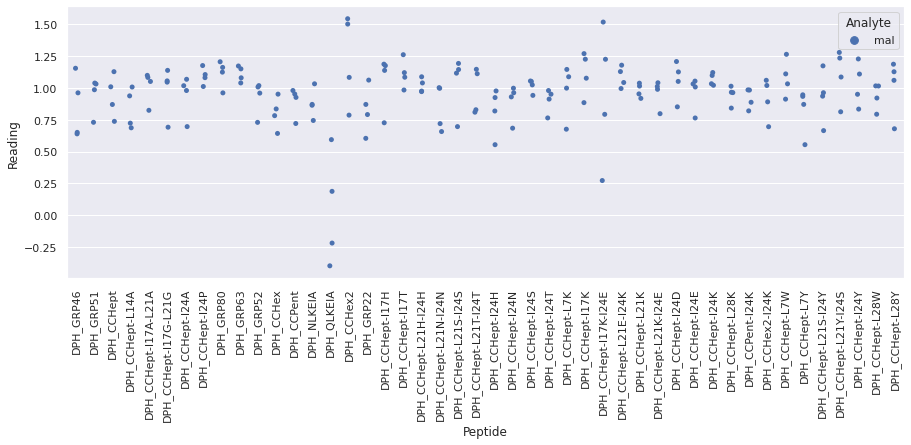

Drawing scatter plot of data spread for man_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

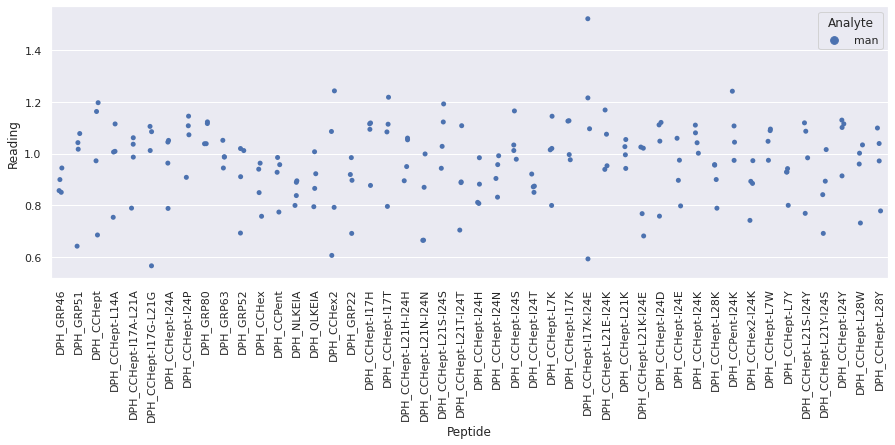

Drawing scatter plot of data spread for fru_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

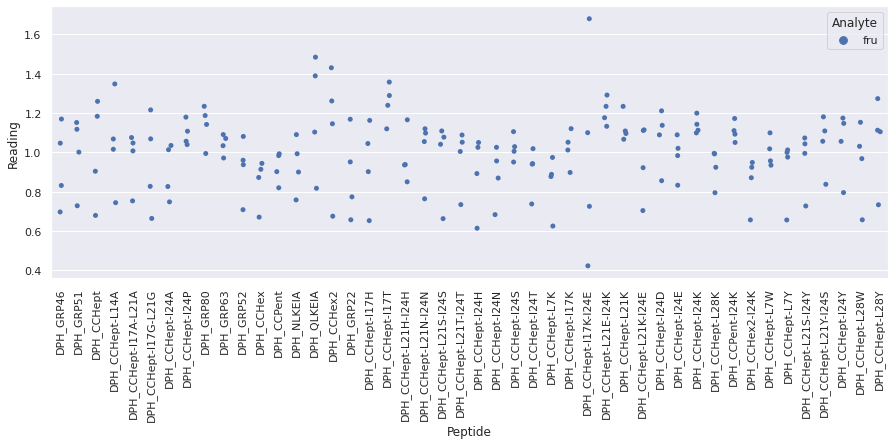

Drawing scatter plot of data spread for glu_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

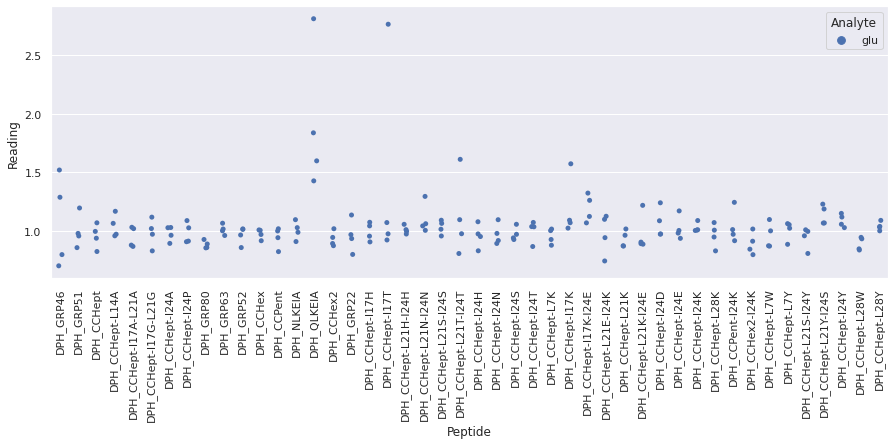

Drawing scatter plot of data spread for gluam_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

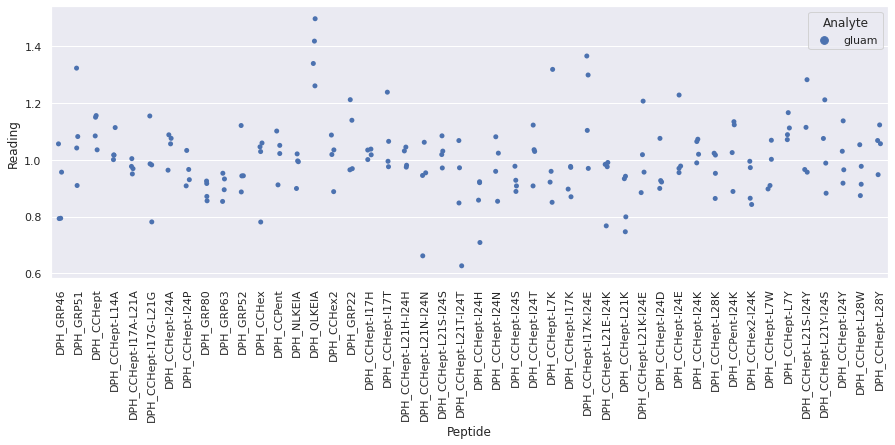

 WARNING - median fluorescence of (mal + DPH_QLKEIA + fluorophore) is less than fluorescence of (mal + fluorophore) alone on plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_8.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for mal_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

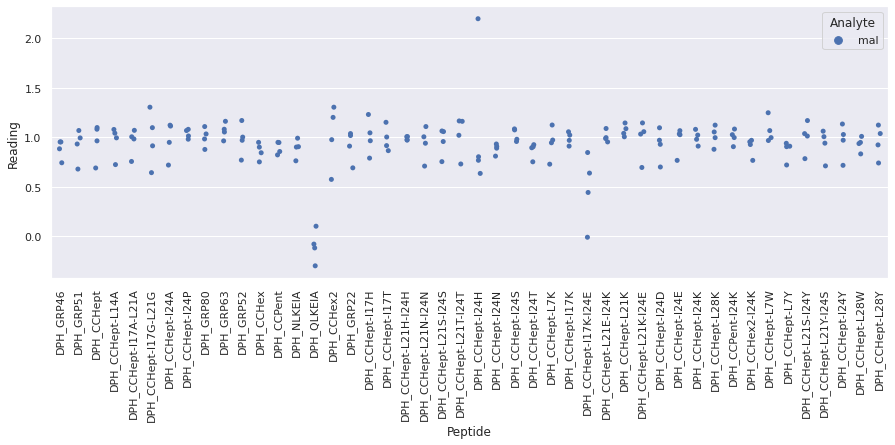

Drawing scatter plot of data spread for man_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

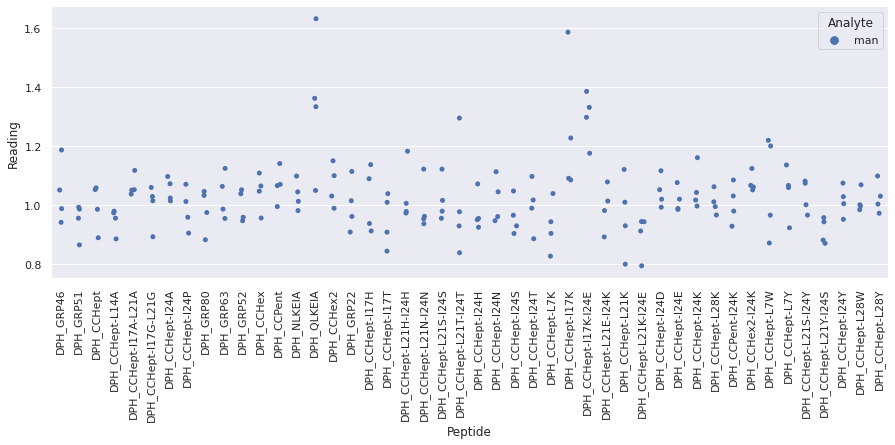

Drawing scatter plot of data spread for fru_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

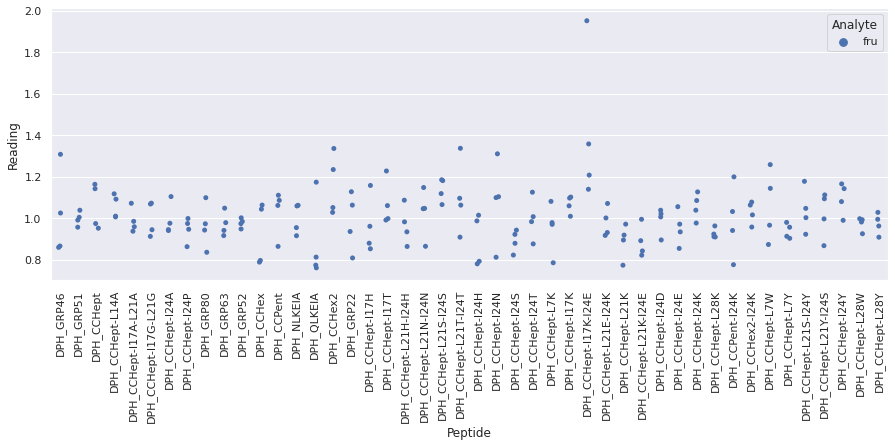

Drawing scatter plot of data spread for glu_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

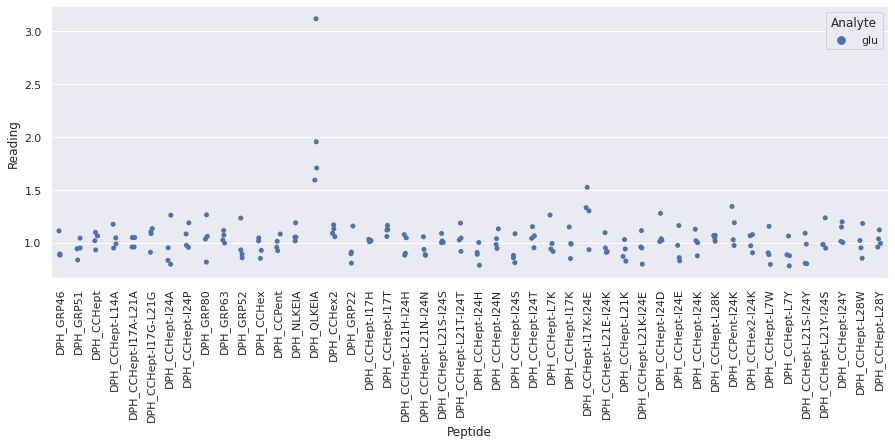

Drawing scatter plot of data spread for gluam_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

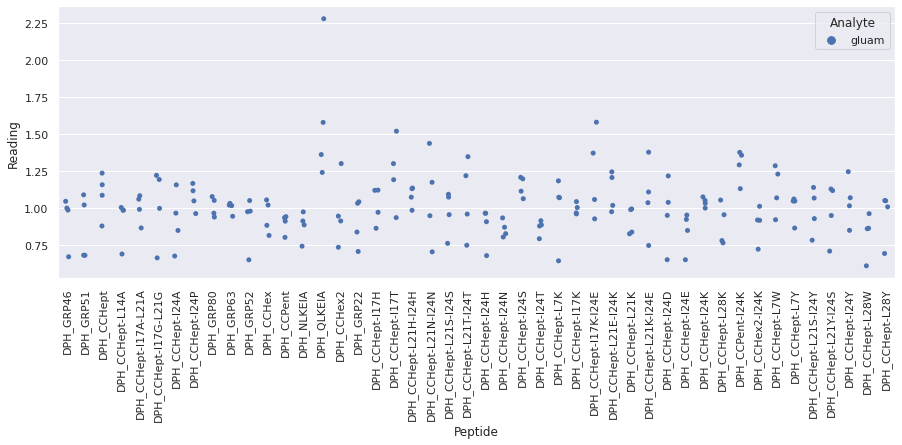

Drawing scatter plot of data spread for mal_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

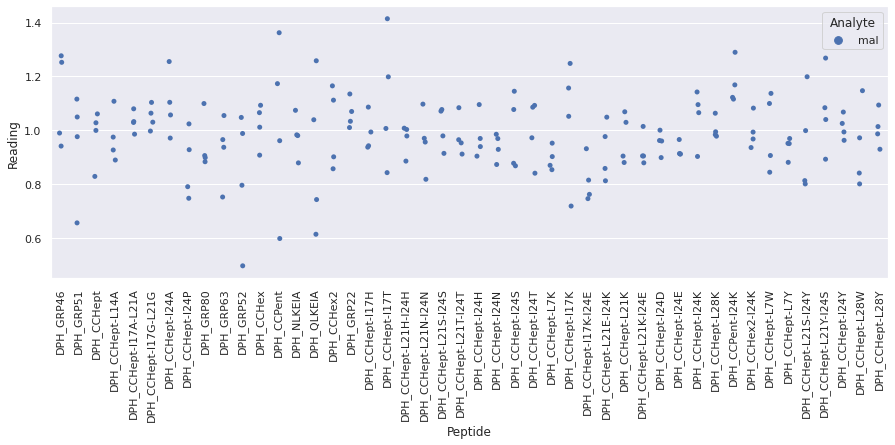

Drawing scatter plot of data spread for man_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

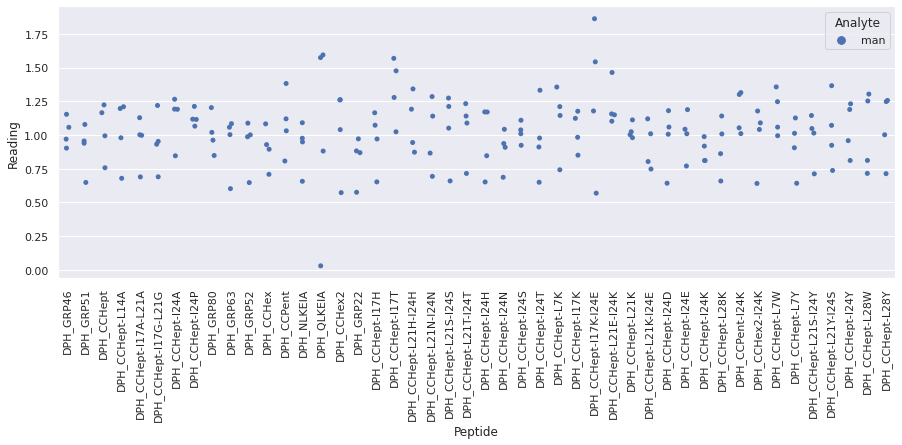

Drawing scatter plot of data spread for fru_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

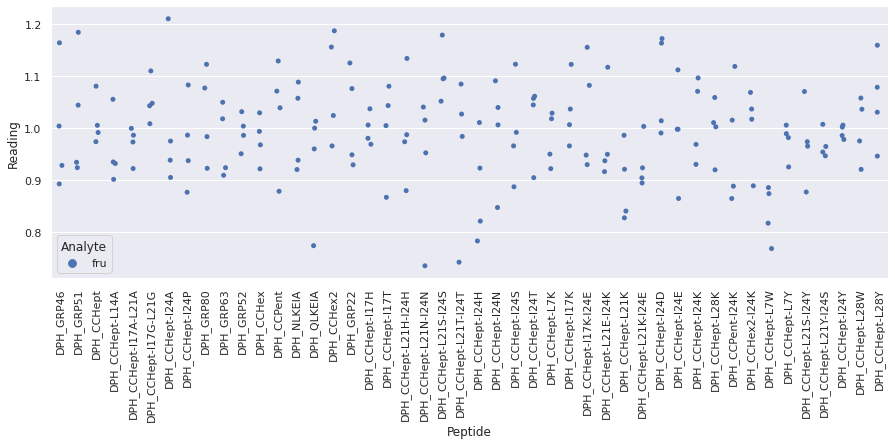

Drawing scatter plot of data spread for glu_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

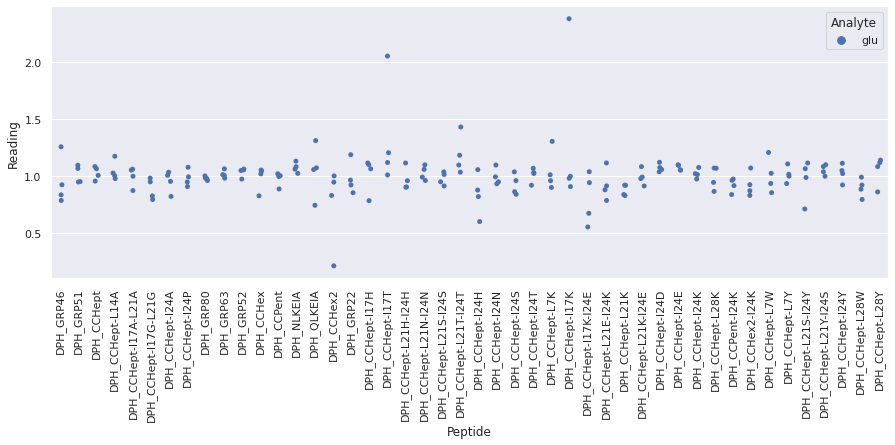

Drawing scatter plot of data spread for gluam_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

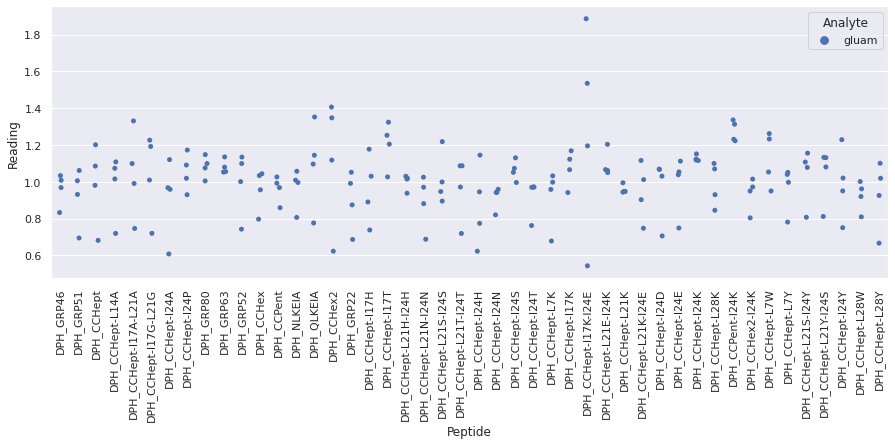

Drawing scatter plot of data spread for mal_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

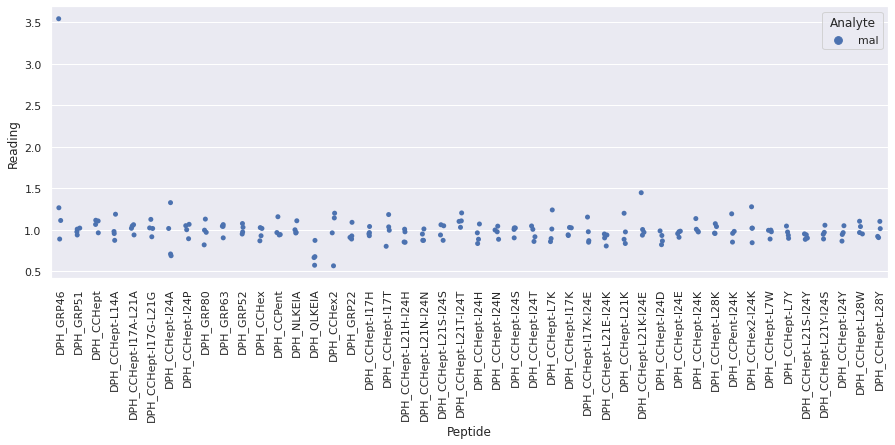

Drawing scatter plot of data spread for man_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

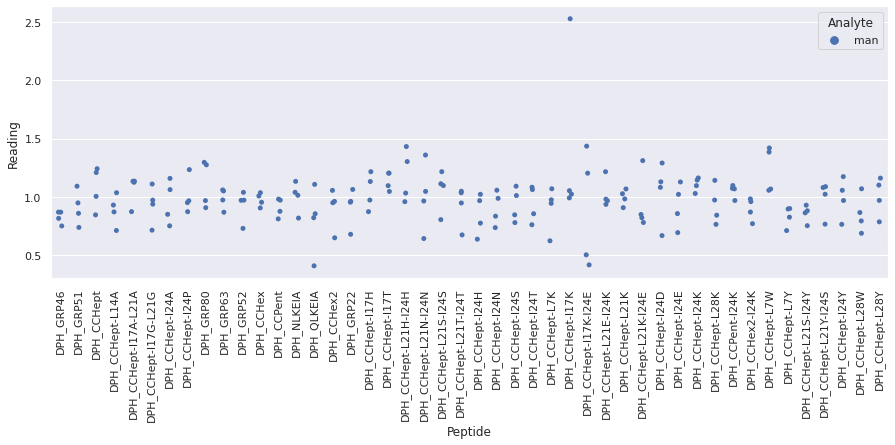



Outliers on the same plate:

/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-I24N, 5154.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-I24S, 13076.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-I17K, 1343.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-L21E-I24K, 6301.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-L21K, 5090.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-L28K, 24009.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/Sugars

In [6]:
sugar_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='Sugar'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous
- The fluorescence of peptides GRP35, QLKEIA and CCHept-I17K-I24E in the presence of DPH is very similar to that of DPH on its own.
- In all cases, addition of analyte causes little/no (by eye) noticeable change in fluorescence signal. Hence training a model to distinguish the unique fingerprints of the different sugar classes that performs well may be difficult.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
sugar_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_fru: fru, DPH_CCHept-I24A, 0.6936249622657044
repeat_1_fru: fru, DPH_CCHept-I24P, 0.9025750430421439
repeat_1_fru: fru, DPH_CCHept-L7K, 0.7478243927782829
repeat_1_glu: glu, DPH_CCHept-I24A, 1.2876719439397872
repeat_1_glu: glu, DPH_GRP63, 1.0634136382196815
repeat_1_glu: glu, DPH_QLKEIA, 1.4666666666666666
repeat_1_glu: glu, DPH_CCHept-L21Y-I24S, 0.8038316746803832
repeat_1_gluam: gluam, DPH_CCHept, 0.7321971683272155
repeat_1_gluam: gluam, DPH_CCHept-I17A-L21A, 0.7923772425696325
repeat_1_gluam: gluam, DPH_CCHept-I17G-L21G, 0.5530310401868249
repeat_1_gluam: gluam, DPH_GRP22, -0.003287954131681204
repeat_1_gluam: gluam, DPH_CCPent-I24K, 16.41392543859649
repeat_1_gluam: gluam, DPH_CCHex2-I24K, 0.6733983074149889
repeat_1_gluam: gluam, DPH_CCHept-L7Y, 0.8293958293958293
repeat_1_mal: mal, DPH_GRP51, 0.17836010143702452
repeat_1_mal: mal, DPH_CCHept-L21T-I24T, 0.2268723970778999
repeat_1_mal: mal, DPH_CCHept-I24E, 0.8462747916713461
repeat_1_mal: mal

Display range of data points across repeats for the different analytes




Original_data:


fru


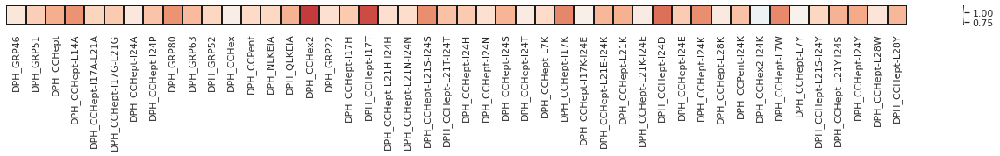


glu


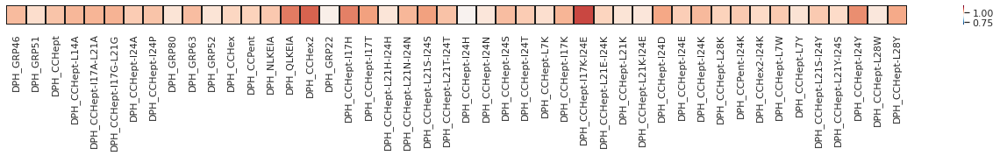


gluam


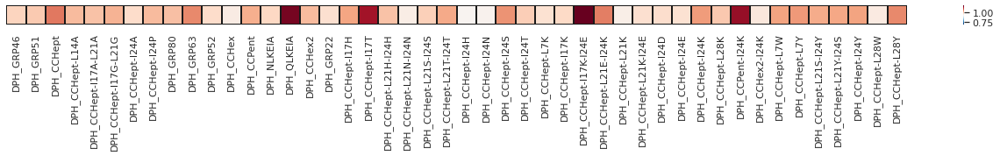


mal


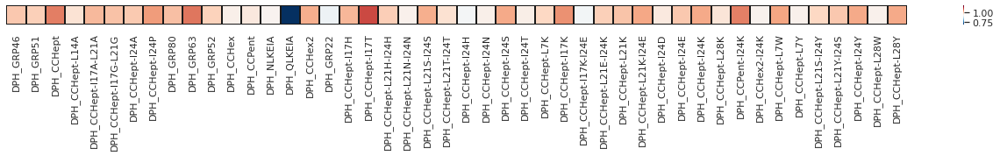


man


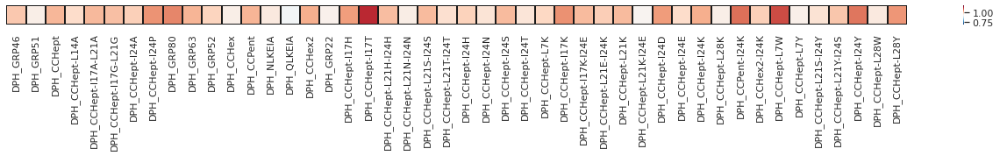




Scaled_data:


fru


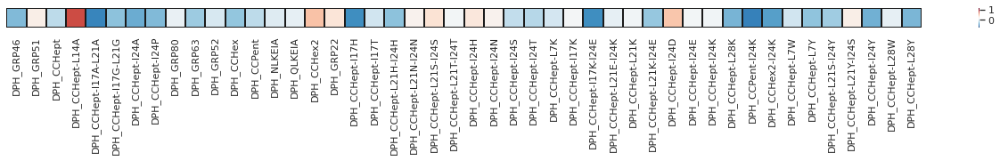


glu


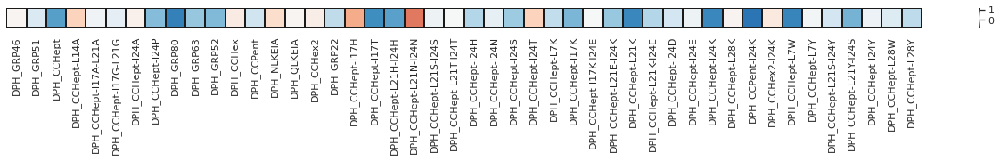


gluam


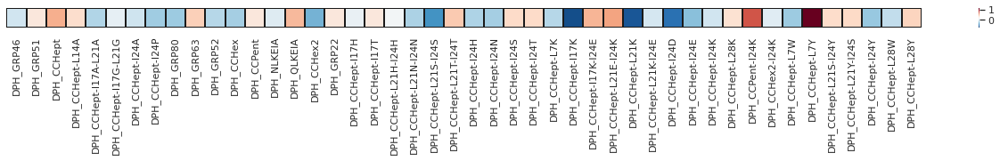


mal


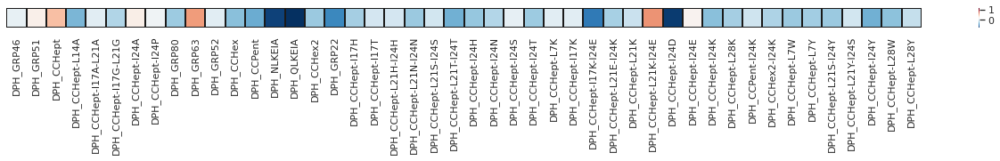


man


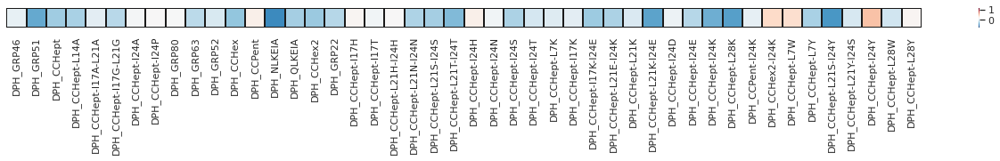




Original_data:



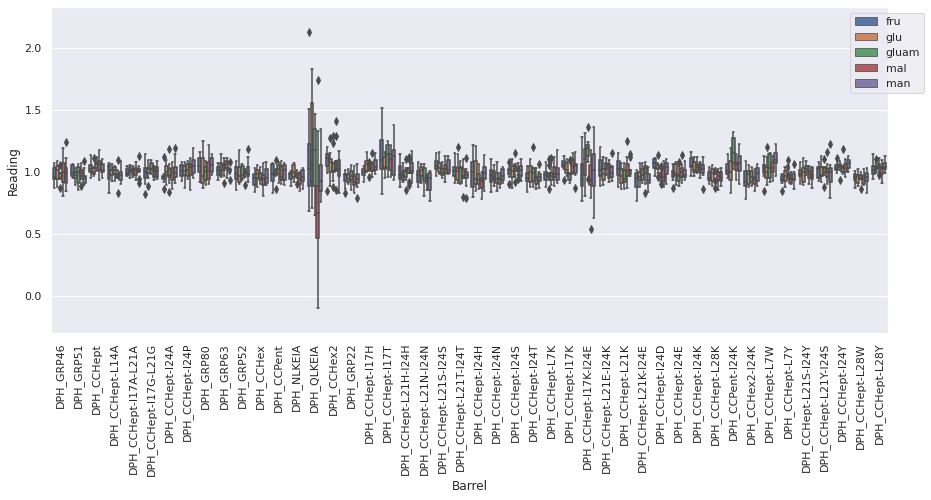

fru


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


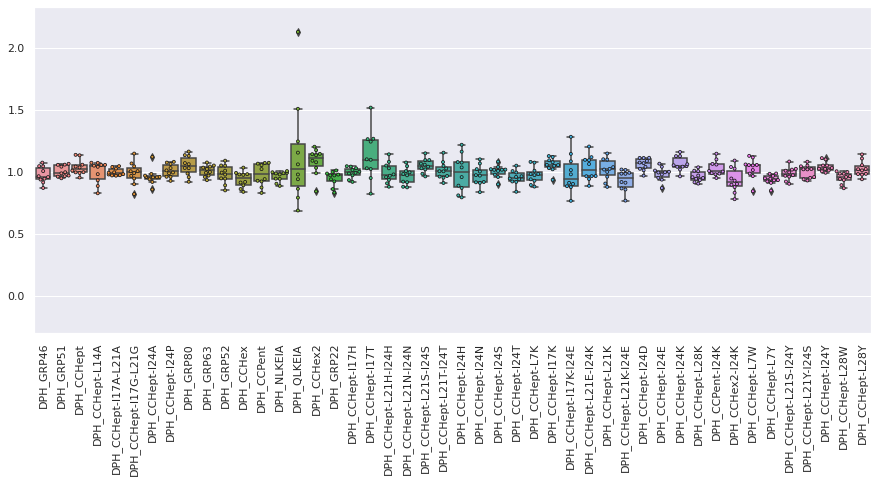

glu


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


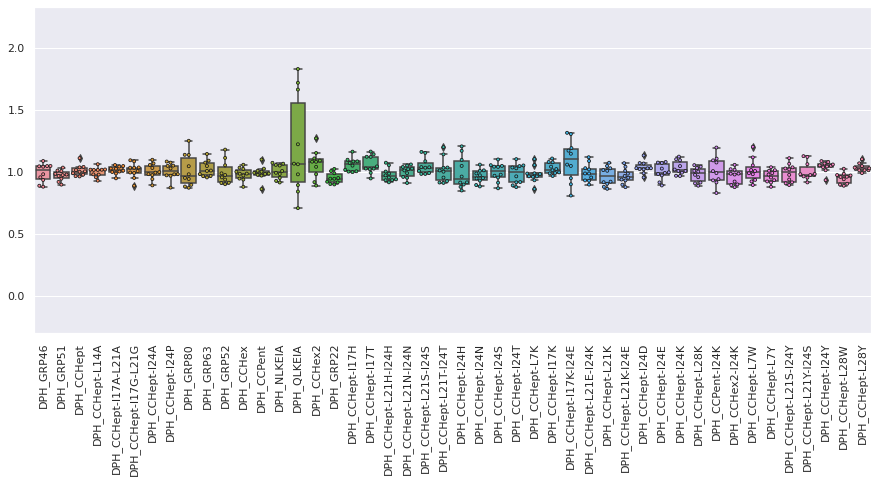

gluam


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


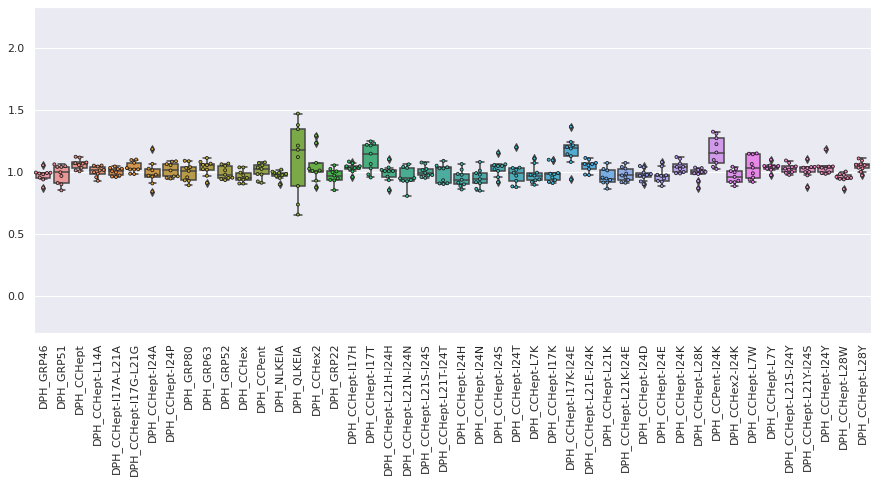

mal


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


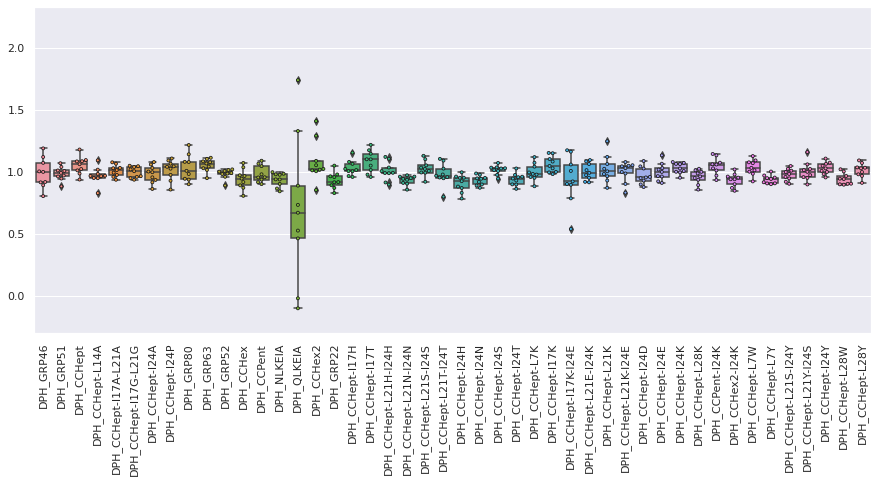

man


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


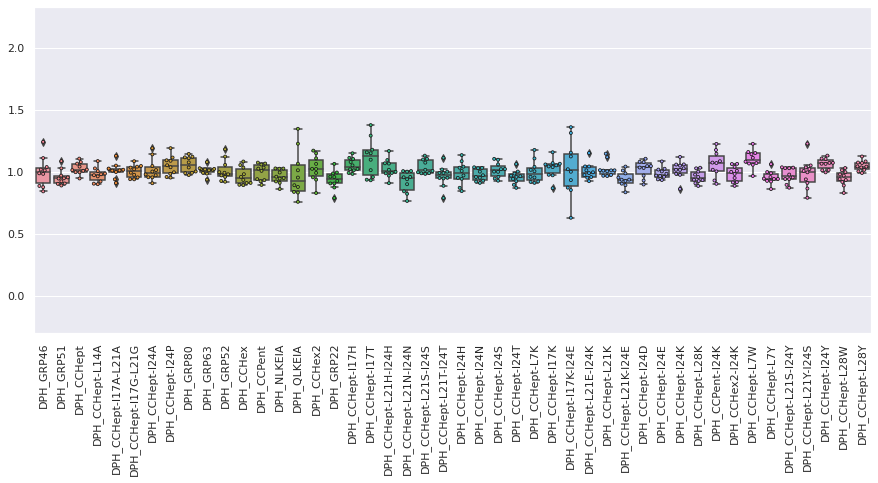




Scaled_data:



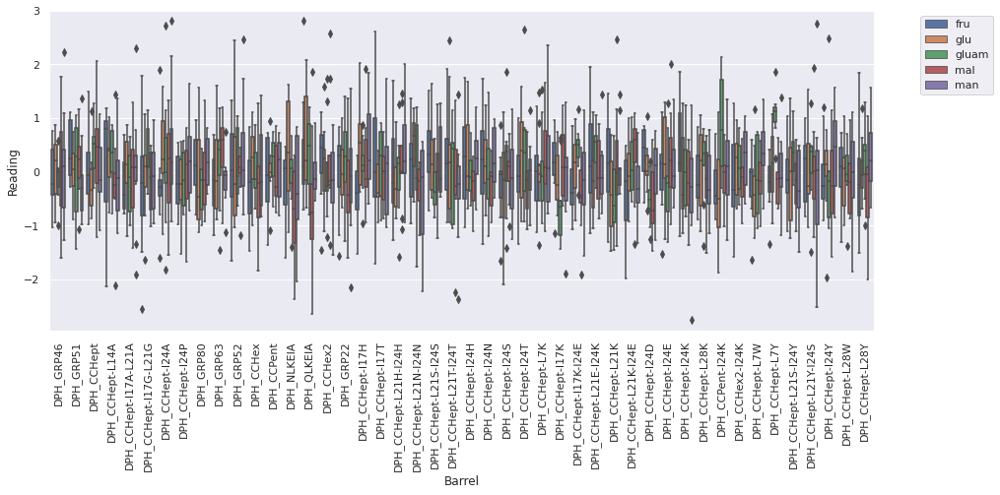

fru


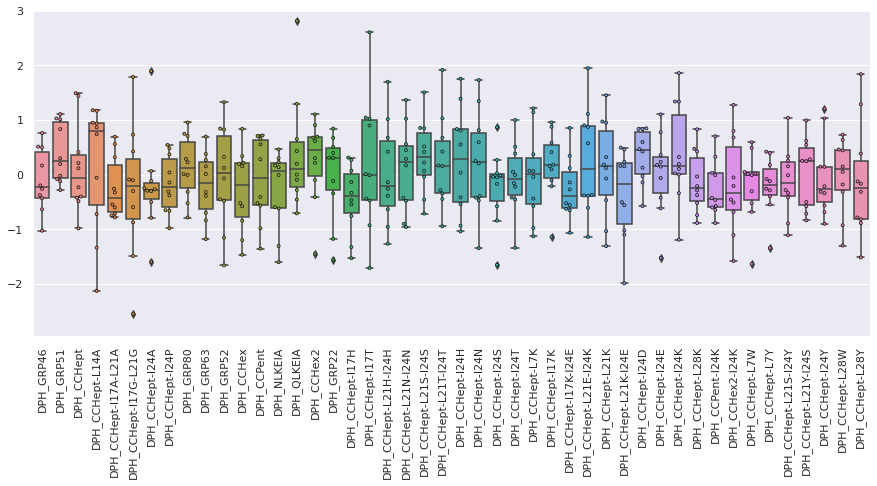

glu


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


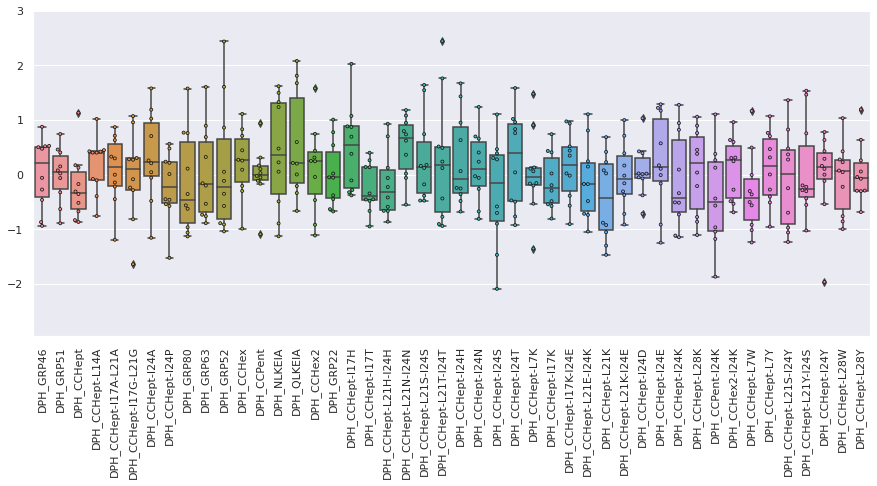

gluam


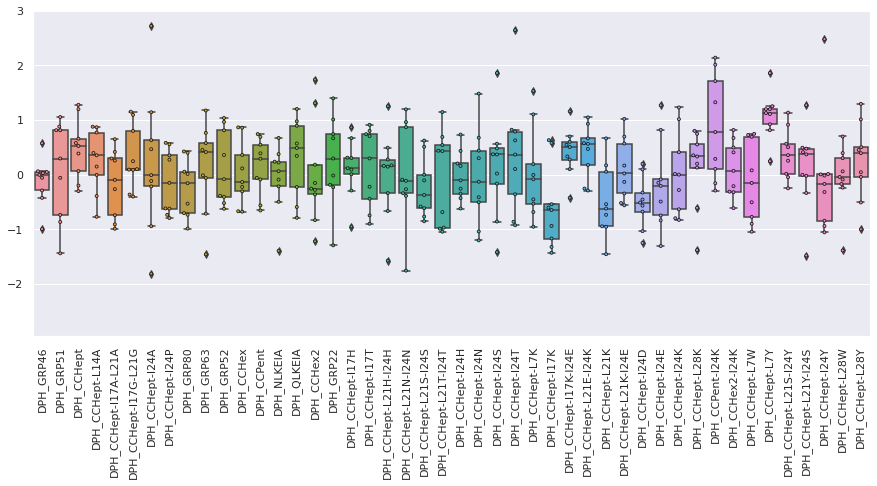

mal


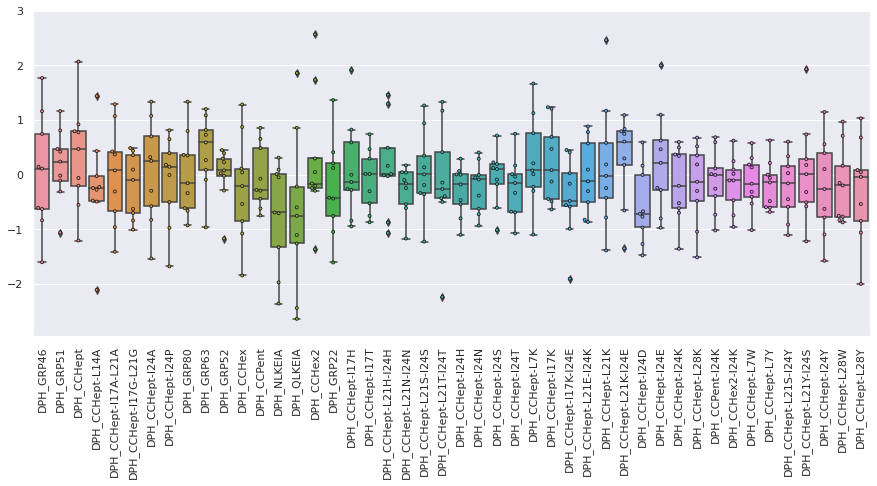

man


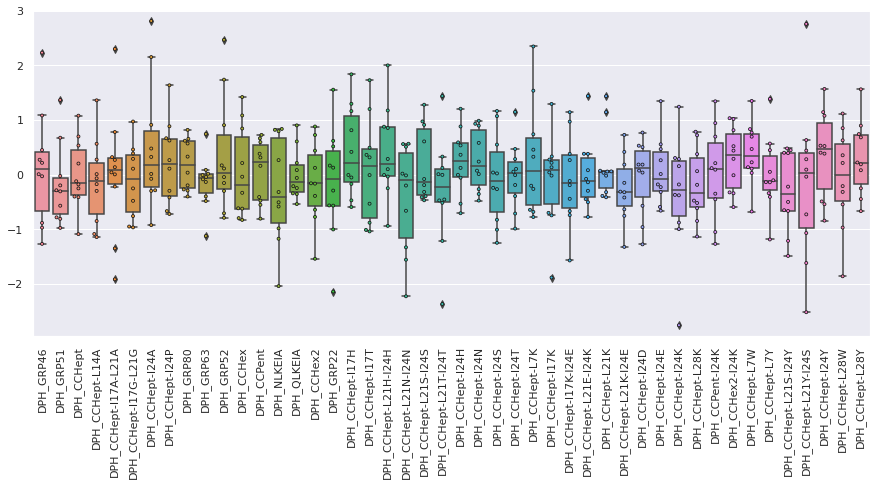

In [8]:
sugar_fluor_data.display_data_distribution()

- There is very little difference between the fingerprints of the different analytes.
- Peptide QLKEIA in particular has an especially large range for the unscaled data. However, the degree of overlap between the readings for the different classes is not noticeably poorer for QLKEIA as compared to the other peptides when looking at the scaled data, hence I will not exclude any of the features from the initial ML dataset.
- By eye, there are no peptides that obviously show a greater separation of readings for the five classes as compared to the other peptides.

In [9]:
sugar_fluor_data.ml_fluor_data

,DPH_GRP46,DPH_GRP51,DPH_CCHept,DPH_CCHept-L14A,DPH_CCHept-I17A-L21A,DPH_CCHept-I17G-L21G,DPH_CCHept-I24A,DPH_CCHept-I24P,DPH_GRP80,DPH_GRP63,...,DPH_CCPent-I24K,DPH_CCHex2-I24K,DPH_CCHept-L7W,DPH_CCHept-L7Y,DPH_CCHept-L21S-I24Y,DPH_CCHept-L21Y-I24S,DPH_CCHept-I24Y,DPH_CCHept-L28W,DPH_CCHept-L28Y,Analyte
0,1.007561,1.057822,1.036774,0.887552,1.040055,1.068872,0.957298,0.996107,1.135611,1.044049,...,1.147379,0.930518,1.056854,0.924214,1.084326,1.023822,1.026658,0.986582,0.985167,fru
1,0.871650,0.966434,0.997105,1.074542,1.047111,0.822234,0.859522,0.928841,1.062858,0.999639,...,1.008481,1.092062,1.053025,0.932783,0.923230,1.021075,1.025339,0.966632,1.024450,fru
2,1.045623,0.949490,1.011159,0.982712,0.974085,1.006001,0.959281,1.031531,1.129966,1.024603,...,1.059988,0.903539,1.060613,0.945754,1.010466,1.021581,1.052406,0.935655,0.983218,fru
3,0.958987,1.042908,1.138167,0.828841,0.997698,0.969021,0.941753,1.013060,1.032518,0.934362,...,0.990571,0.832761,1.129959,0.912539,0.974231,1.051766,1.012722,0.869452,1.141413,fru
4,1.046980,0.971281,0.955592,1.057546,0.970405,0.901603,0.970740,0.989376,0.921684,1.035220,...,0.981503,0.781212,0.967253,0.948786,0.996827,0.931506,1.052180,0.960213,0.941624,fru
5,0.916046,1.065954,0.992331,1.073768,0.994153,1.148351,0.984442,1.064631,1.071640,1.076417,...,1.065174,0.878794,1.015320,0.968855,0.962925,0.953062,1.005790,0.894355,1.013123,fru
6,1.075497,0.962863,1.134499,1.056561,0.982706,0.991135,1.122418,1.075748,0.987486,0.994135,...,1.003704,0.947549,1.117092,0.850735,0.905292,0.941660,1.032321,0.944620,1.022030,fru
7,0.939213,1.059270,1.043729,1.041898,1.027629,0.947970,0.919951,1.082026,1.164580,1.052285,...,1.101504,0.897593,0.987347,0.987777,1.019110,1.082697,1.101645,0.999524,1.108727,fru
8,0.945908,0.998113,1.058628,1.051230,0.972284,1.006880,0.960748,0.960998,0.958367,0.960313,...,0.986959,1.040113,1.055456,0.935042,1.025462,1.045716,1.111754,0.987546,0.979002,fru
9,0.966087,0.989337,0.998559,0.933323,0.979852,1.045623,0.956684,0.961973,1.030550,0.970917,...,0.951786,1.027093,0.845216,0.985630,0.969592,0.959312,0.993974,1.005902,1.054856,fru


#### ML analysis

In [10]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/home/ks17361/ML_environment/BADASS/Small_molecule_analysis_large_array/'
                'Sugars/Sugar_ML_plots',
    fluor_data=sugar_fluor_data.ml_fluor_data,
    classes=sugar_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=None, shuffle=False
)

- Calculate feature correlations

In [11]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size

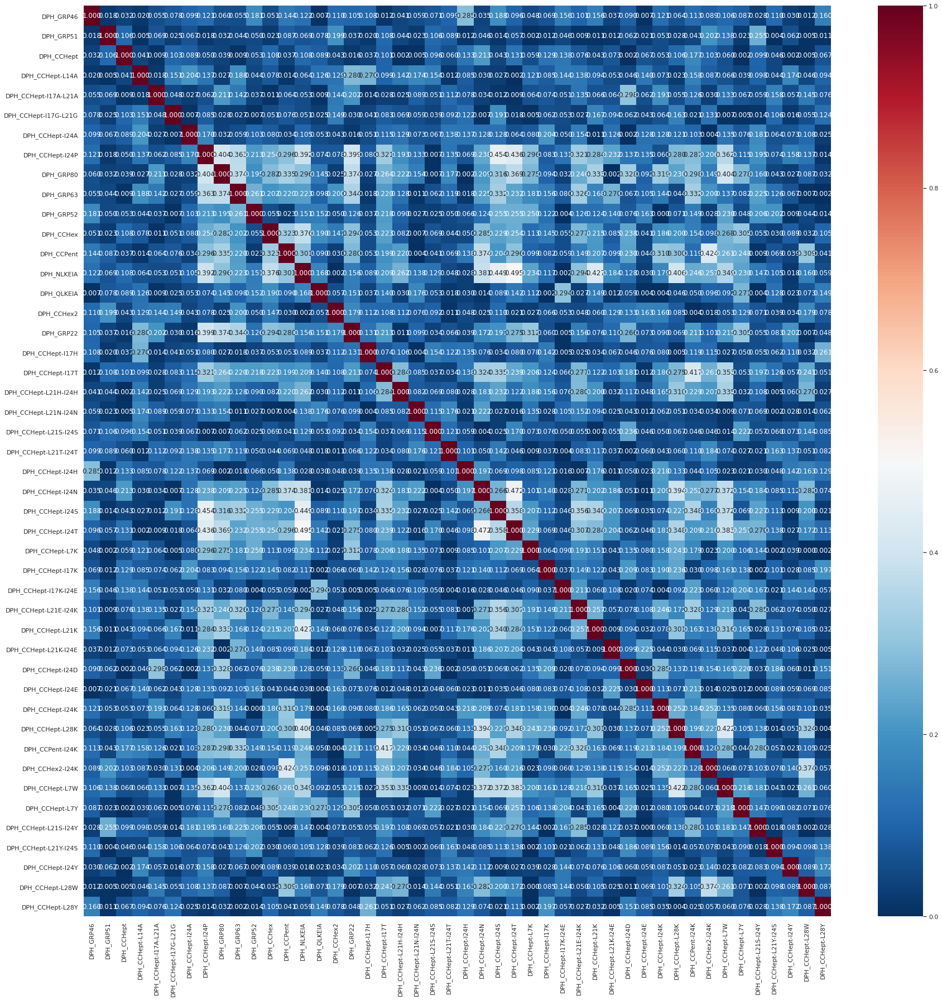

In [12]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

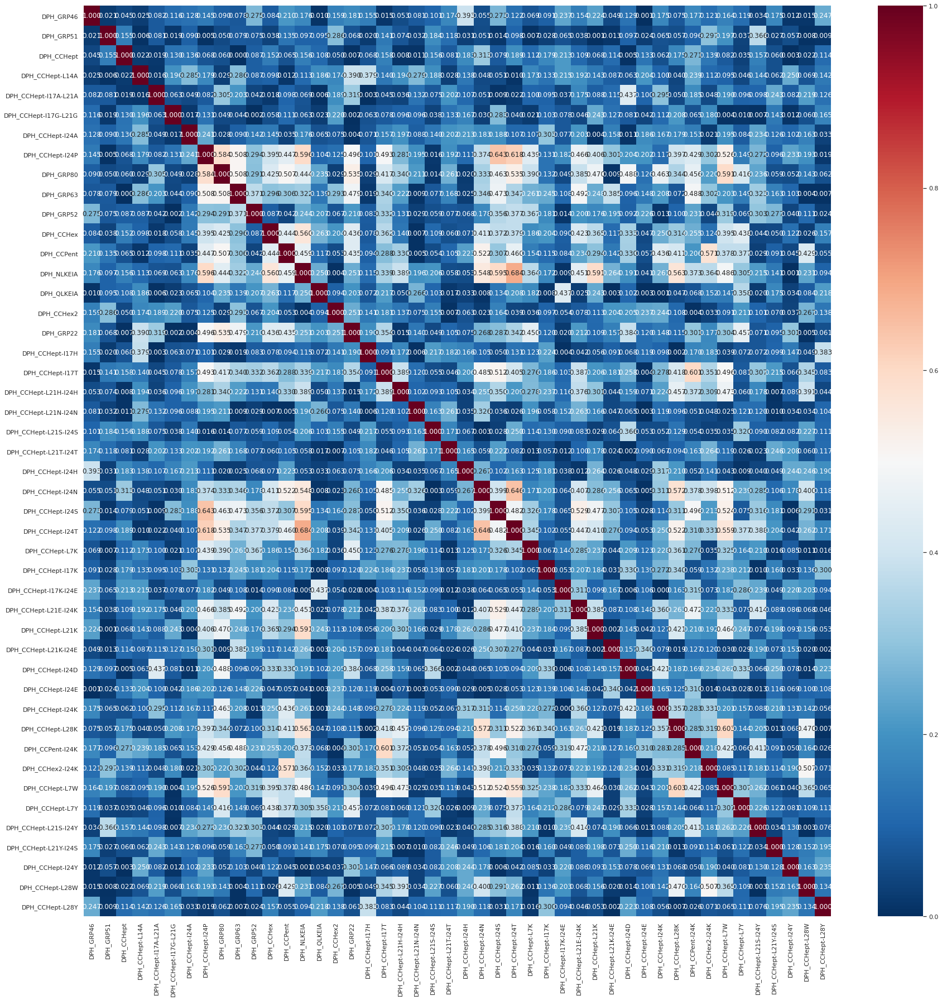

In [13]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

The correlation coefficients between the readings from most of the barrels are pretty low. Would expect that if the readings are providing useful information (i.e. not just noise) about sugar class that a larger number would show higher correlation coefficients (as it is highly unlikely that all 46 peptides will provide unique, unrelated information about sugar class). Consequently model training might be tricky, and feature reduction might lead to an improvement in performance (by removing peptides that just contribute noise) - we will see whether this is the case in the following analysis!

In [14]:
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

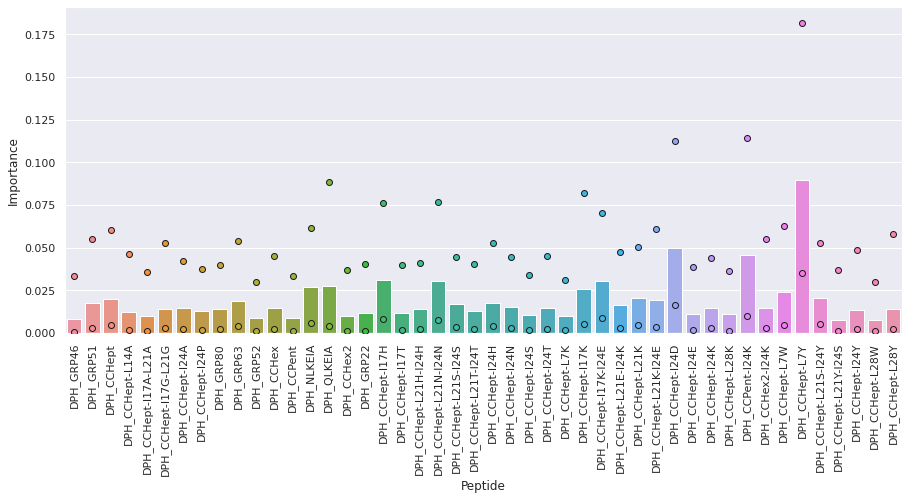

<Figure size 720x720 with 0 Axes>

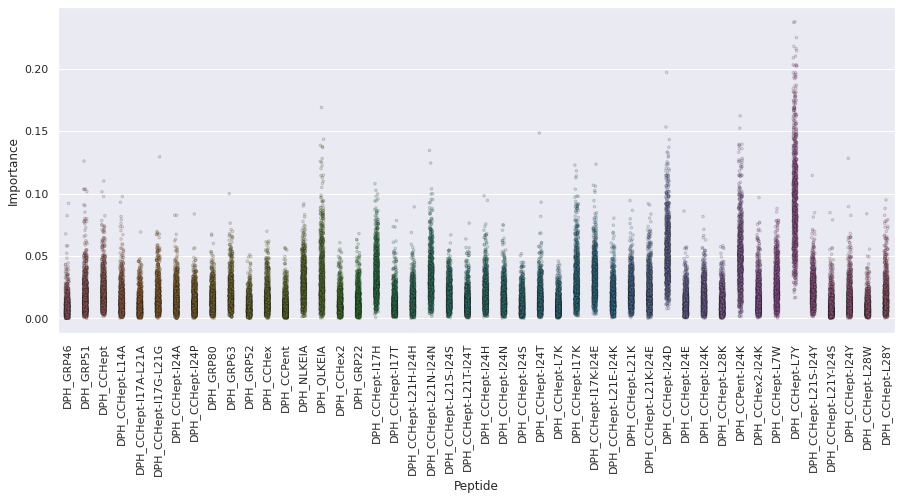

In [15]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [16]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHept-L7Y,0.089501,0.035078,0.181929
1,DPH_CCHept-I24D,0.049629,0.016292,0.112268
2,DPH_CCPent-I24K,0.045754,0.009948,0.114511
3,DPH_CCHept-I17H,0.031273,0.008323,0.076325
4,DPH_CCHept-I17K-I24E,0.030733,0.008640,0.070668
5,DPH_CCHept-L21N-I24N,0.030404,0.007814,0.076777
6,DPH_QLKEIA,0.027704,0.004148,0.088722
7,DPH_NLKEIA,0.026769,0.005793,0.061552
8,DPH_CCHept-I17K,0.026161,0.005369,0.082127
9,DPH_CCHept-L7W,0.023964,0.004613,0.062645


In [17]:
with open('{}/KBest_feat_importances.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((kbest_feat_importances_dict), f)

KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another.

CCHept-L7Y, CCHept-I24D and CCPent-I24K have the highest importance scores with this method. In particular, the importance score of CCHept-L7Y is ~2x as large as the second most important peptide.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

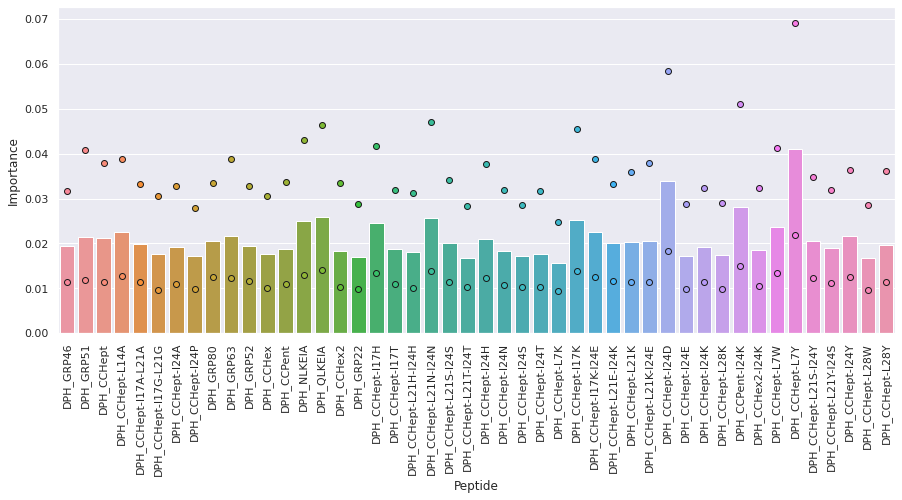

<Figure size 720x720 with 0 Axes>

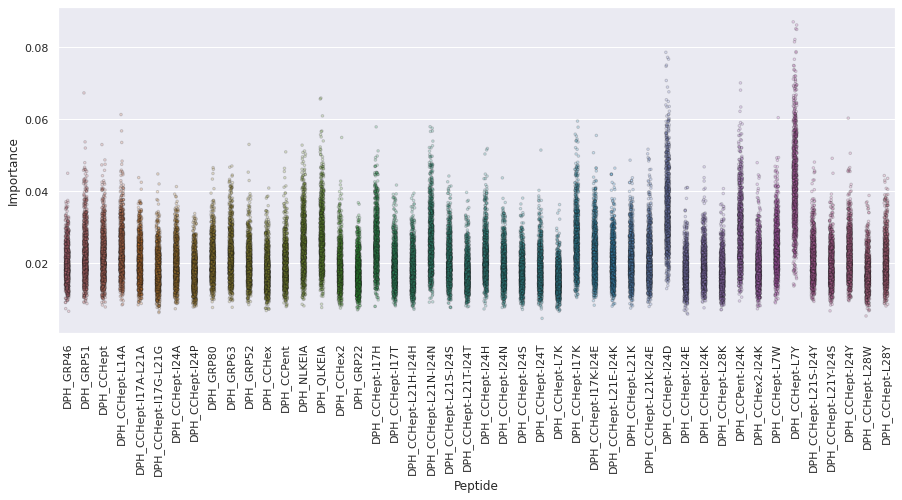

In [18]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [19]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHept-L7Y,0.041038,0.021961,0.069273
1,DPH_CCHept-I24D,0.034035,0.018244,0.058530
2,DPH_CCPent-I24K,0.028243,0.014882,0.051031
3,DPH_QLKEIA,0.025880,0.014045,0.046357
4,DPH_CCHept-L21N-I24N,0.025597,0.013775,0.047016
5,DPH_CCHept-I17K,0.025264,0.013879,0.045635
6,DPH_NLKEIA,0.024912,0.012918,0.043091
7,DPH_CCHept-I17H,0.024601,0.013500,0.041640
8,DPH_CCHept-L7W,0.023664,0.013524,0.041312
9,DPH_CCHept-L14A,0.022654,0.012843,0.038855


In [20]:
with open('{}/Tree_feat_importances.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((tree_feat_importances_dict), f)

In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

The same three peptides (CCHept-L7Y, CCHept-I24D and CCPent-I24K) as identified in KBest analysis are again found to have the highest importance scores with this method. However, the difference in their relative importance scores is less pronounced.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

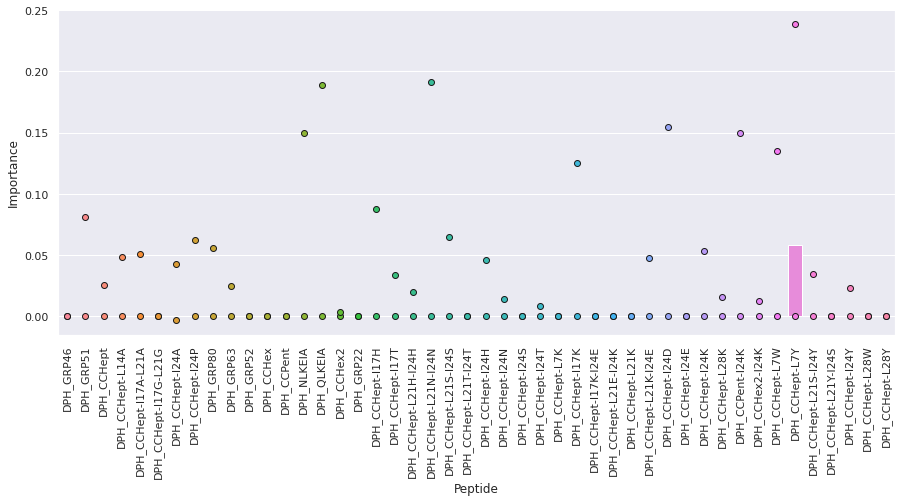

<Figure size 720x720 with 0 Axes>

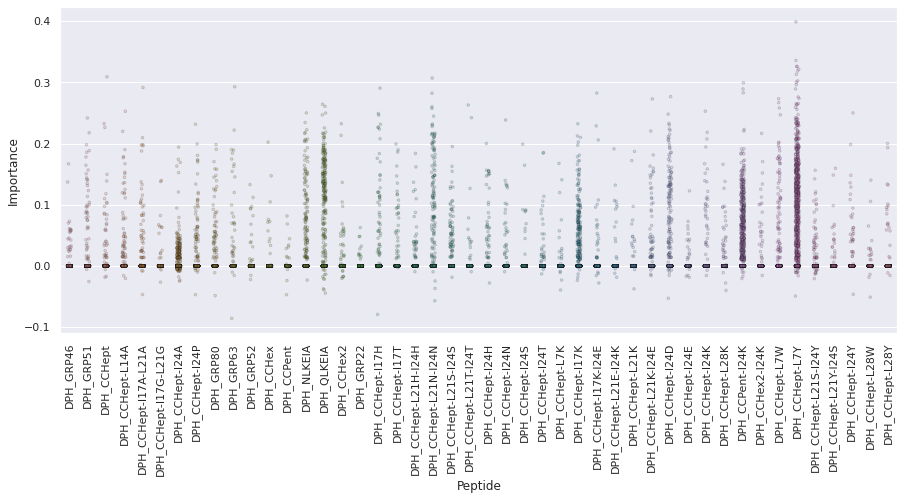

In [21]:
f1 = make_scorer(f1_score, average='weighted')
permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1, num_repeats=1000,
    scale=True, plt_name=''
)

In [22]:
print('Peptides ordered by median importance:')
permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHept-L7Y,0.058343,0.00000,0.238923
1,DPH_GRP46,0.000000,0.00000,0.000102
2,DPH_CCHept-I24E,0.000000,0.00000,0.000000
3,DPH_CCHept-I24S,0.000000,0.00000,0.000000
4,DPH_CCHept-I24T,0.000000,0.00000,0.008443
5,DPH_CCHept-L7K,0.000000,0.00000,0.000000
6,DPH_CCHept-I17K,0.000000,0.00000,0.124838
7,DPH_CCHept-I17K-I24E,0.000000,0.00000,0.000000
8,DPH_CCHept-L21E-I24K,0.000000,0.00000,0.000000
9,DPH_CCHept-L21K,0.000000,0.00000,0.000000


In [23]:
mean_permut_feat_importances_df = OrderedDict({})
lower_conf_permut_feat_importances_df = OrderedDict({})
upper_conf_permut_feat_importances_df = OrderedDict({})

for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
    lower_conf_permut_feat_importances_df[feat] = np.percentile(score_list, 2.5)
    upper_conf_permut_feat_importances_df[feat] = np.percentile(score_list, 97.5)

mean_permut_feat_importances_df = pd.DataFrame({
    'Feature': list(mean_permut_feat_importances_df.keys()),
    'Score': list(mean_permut_feat_importances_df.values()),
    'Lower conf limit': list(lower_conf_permut_feat_importances_df.values()),
    'Upper conf limit': list(upper_conf_permut_feat_importances_df.values())
})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [24]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score,Lower conf limit,Upper conf limit
0,DPH_CCHept-L7Y,0.074560,0.00000,0.238923
1,DPH_CCPent-I24K,0.030744,0.00000,0.150006
2,DPH_QLKEIA,0.024714,0.00000,0.188766
3,DPH_CCHept-L21N-I24N,0.014047,0.00000,0.191175
4,DPH_CCHept-I24D,0.012772,0.00000,0.154679
5,DPH_CCHept-I17K,0.012327,0.00000,0.124838
6,DPH_NLKEIA,0.010576,0.00000,0.150005
7,DPH_CCHept-L7W,0.007657,0.00000,0.135316
8,DPH_CCHept-I17H,0.005170,0.00000,0.087753
9,DPH_CCHept-I24A,0.004380,-0.00361,0.042328


In [25]:
with open('{}/Permutation_feat_importances.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((permut_feat_importances_dict), f)

In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

As can be seen from the plots, most of the features provide little unique information about the output class (all peptides bar 1 have a median importance score of 0). CCHept-L7Y, CCPent-I24K and CCHept-I24D are again found to be three of the most important peptides. This method finds CCHept-L7Y to be the most important peptide by some margin, as does KBest, but the ExtraTrees importance scores of the top three peptides in ExtraTrees are more similar to one another.

So, whilst there is variation in the relative order of the less important peptides, all three methods agree that CCHept-L7Y, CCPent-I24K and CC-Hept-I24D are three of the most informative peptides, with respect to both their independent relationship with the output class label plus the unique information they provide. All three methods also find QLKEIA to be one of the most important peptides => good job it wasn't discarded earlier in the analysis due to the large size of its unscaled fluorescence readings.

- What percentage of the signal in the data can be measured by N principal components?

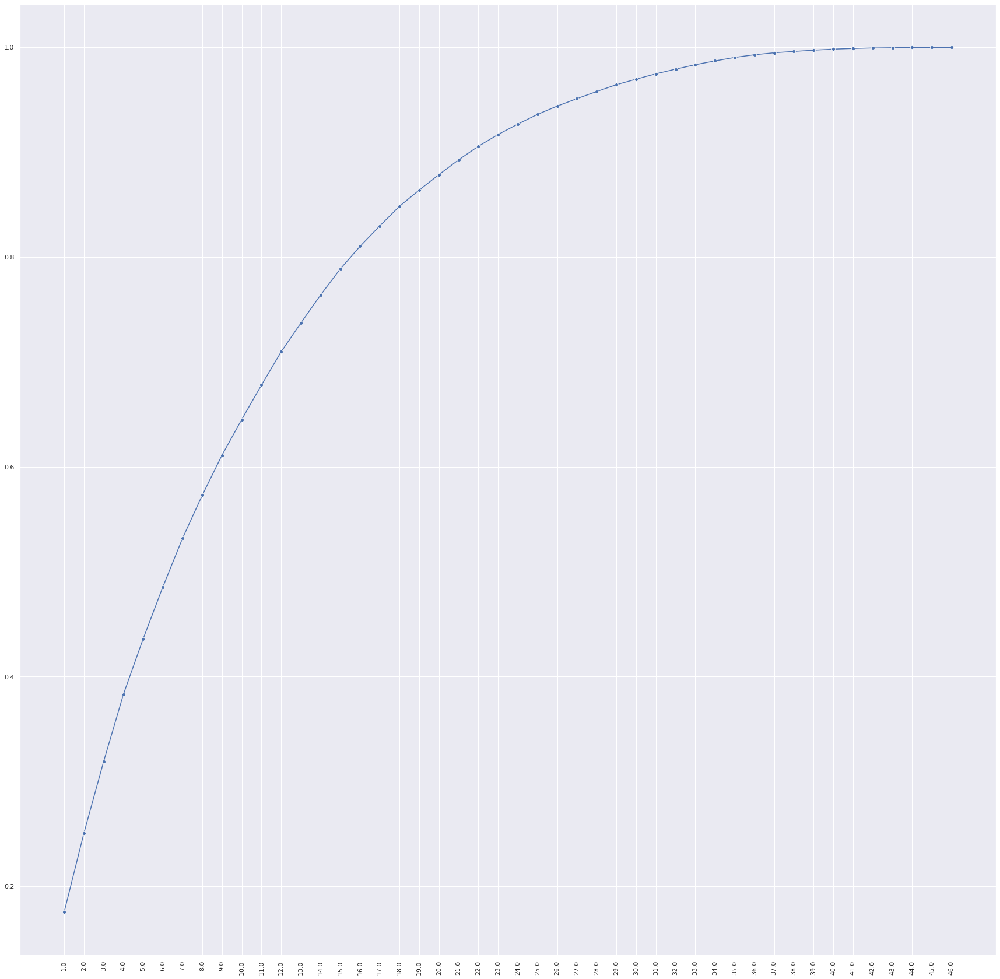

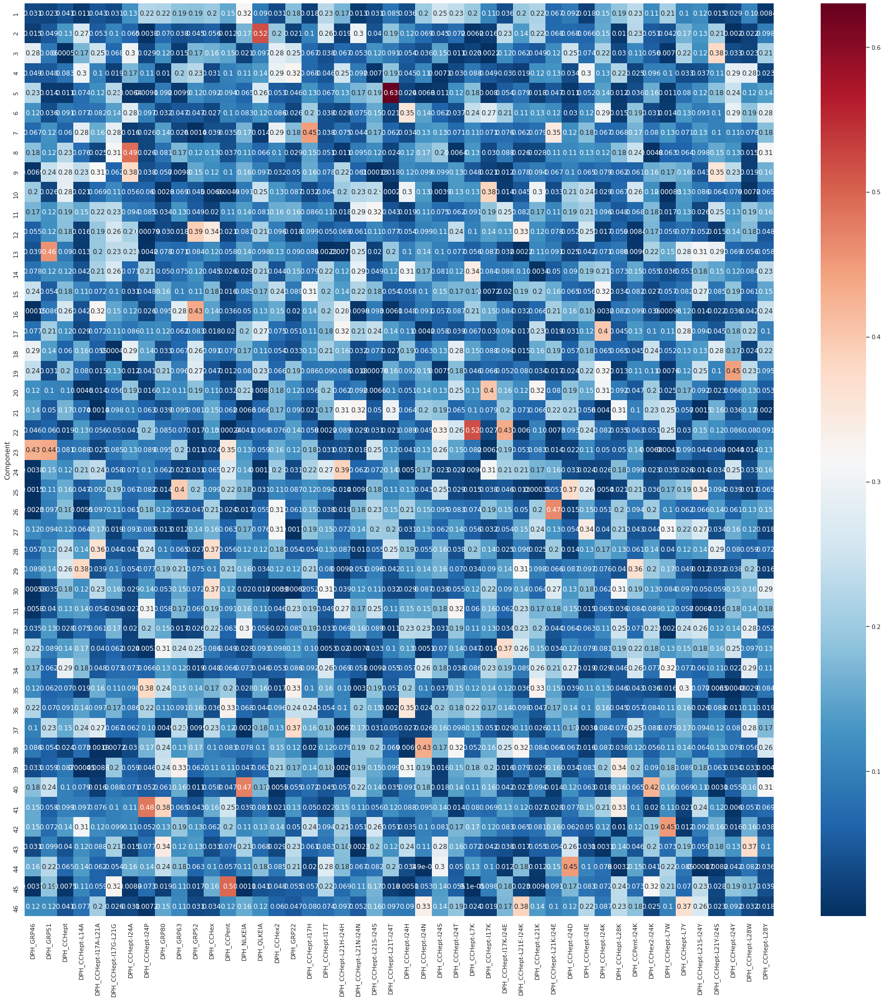

In [26]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(fluor_data=ml.fluor_data, scale=True, plt_name='')
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

~25 components are required to explain >90% of the variance in the data. Lots of different peptides make a contribution to the first principal component. The feature that makes by far the largest contribution to the second principal component is QLKEIA, which is not overly surprising given that as described above permutation analysis identifies it as one of the peptides that provides the most unique information about the output class.

Scatter plots of data transformed to PCA dimensions

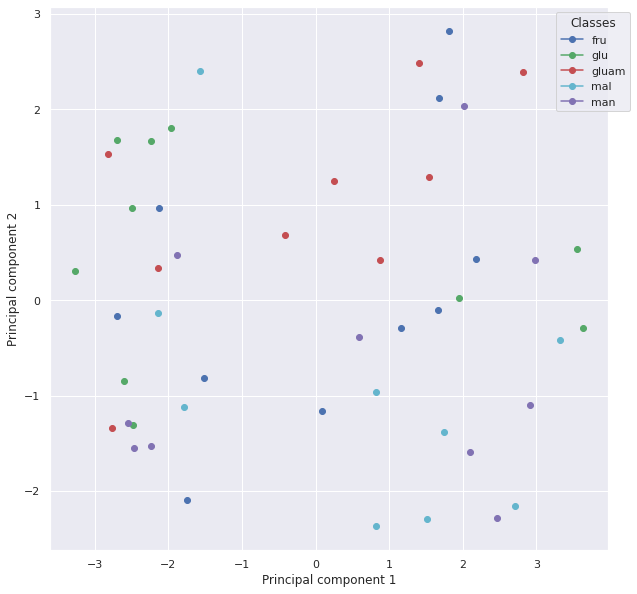

In [27]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=None, num_dimensions=2, scale=True, plt_name=''
)

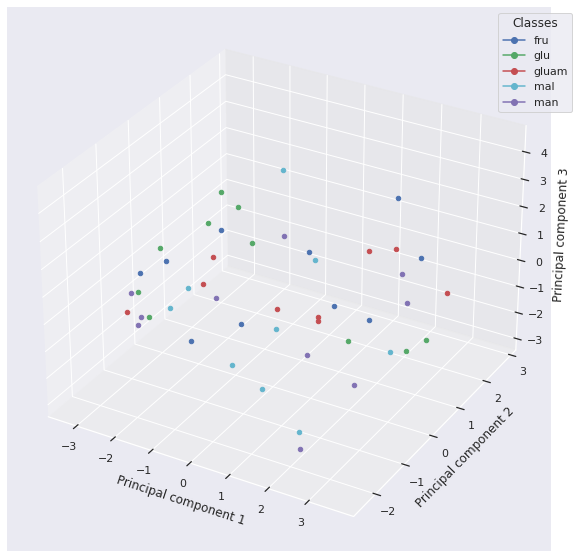

In [28]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=None, num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter and box plots of fluorescence readings, the sugar classes aren't distinguishable from one another by eye when plotted on PCA axes.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 6 different ML algorithms and 2 dummy (random) classifiers. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [29]:
algorithms = [DummyClassifier, DummyClassifier, KNeighborsClassifier, GaussianNB, LinearDiscriminantAnalysis,
              LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 5
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for index, algorithm in enumerate(algorithms):
    for resampling_method in resampling_methods:
        if index == 0:
            fixed_params = OrderedDict({'strategy': 'prior',
                                        'random_state': 1})
            tuned_params = OrderedDict({})
        elif index == 1:
            fixed_params = OrderedDict({'strategy': 'stratified',
                                        'random_state': 1})
            tuned_params = OrderedDict({})
        else:
            fixed_params = ml.define_fixed_model_params(classifier=algorithm())
            if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                fixed_params['random_state'] = 1
            tuned_params = ml.define_tuned_model_params(
                classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
            )

        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )
        
        if index == 0:
            all_feat_searches[
                'DummyClassifierPrior__{}'.format(resampling_method)
            ] = copy.deepcopy(nested_cv_search)
        elif index == 1:
            all_feat_searches[
                'DummyClassifierStratified__{}'.format(resampling_method)
            ] = copy.deepcopy(nested_cv_search)
        else:
            all_feat_searches[
                '{}__{}'.format(algorithm.__name__, resampling_method)
            ] = copy.deepcopy(nested_cv_search)

        if index == 0:
            all_feat_score_dict['Algorithm'].append('DummyClassifier_prior')
        elif index == 1:
            all_feat_score_dict['Algorithm'].append('DummyClassifier_stratified')
        else:
            all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        for n, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][n]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][n]))





DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accurac

In [30]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [31]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
1,DummyClassifier_stratified,no_balancing,0.186667,0.043319,0.186667,0.043319,0.291111,0.041126,0.221481,0.042504
2,KNeighborsClassifier,no_balancing,0.308889,0.118738,0.308889,0.118738,0.299704,0.156480,0.282561,0.131983
3,GaussianNB,no_balancing,0.146667,0.116375,0.146667,0.116375,0.122222,0.148449,0.122402,0.124237
4,LinearDiscriminantAnalysis,no_balancing,0.186667,0.043319,0.186667,0.043319,0.191852,0.093051,0.179111,0.057125
5,LinearSVC,no_balancing,0.182222,0.128764,0.182222,0.128764,0.127778,0.096545,0.148148,0.108542
6,SVC,no_balancing,0.166667,0.056656,0.166667,0.056656,0.154444,0.066944,0.151852,0.047431
7,AdaBoostClassifier,no_balancing,0.268889,0.082552,0.268889,0.082552,0.132127,0.082526,0.155949,0.069408


In [32]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

The algorithms do not appear to perform any better than random guessing (which would have an expected accuracy of ~0.2 - see results for the dummy classifiers). KNeighborsClassifier has the best performance across all metrics (although it is only marginally better than the stratified dummy classifier) => take KNN forwards.

In [33]:
all_feat_searches['KNeighborsClassifier__no_balancing']['outer_loop_params']

[OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 8),
              ('p', 2),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 5),
              ('p', 1),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 4),
              ('p', 1),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 7),
              ('p', 1),
              ('weights', 'distance')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 6),
              ('p', 1),
              ('weights', 'uniform')])]

In [34]:
all_feat_searches['KNeighborsClassifier__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 5),
                           ('p', 1),
                           ('weights', 'uniform')])),
             ('recall',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 5),
                           ('p', 1),
                           ('weights', 'uniform')])),
             ('precision',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 4),
                           ('p', 1),
                           ('weights', 'uniform')])),
             ('f1',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 4),
                           ('p', 1),
                         

In [35]:
all_feat_searches['KNeighborsClassifier__no_balancing']['test_scores']['accuracy']

[0.3, 0.4, 0.4, 0.3333333333333333, 0.1111111111111111]

In [36]:
all_feat_nested_pred = all_feat_searches['KNeighborsClassifier__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['KNeighborsClassifier__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['KNeighborsClassifier__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

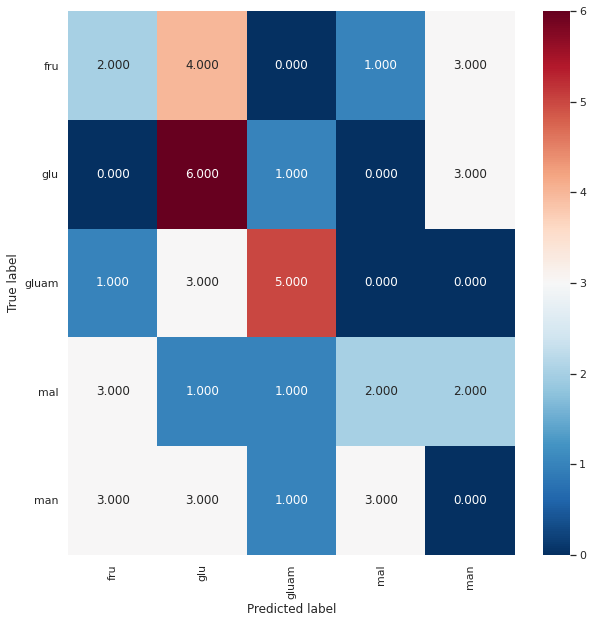

Normalised over true label (rows)


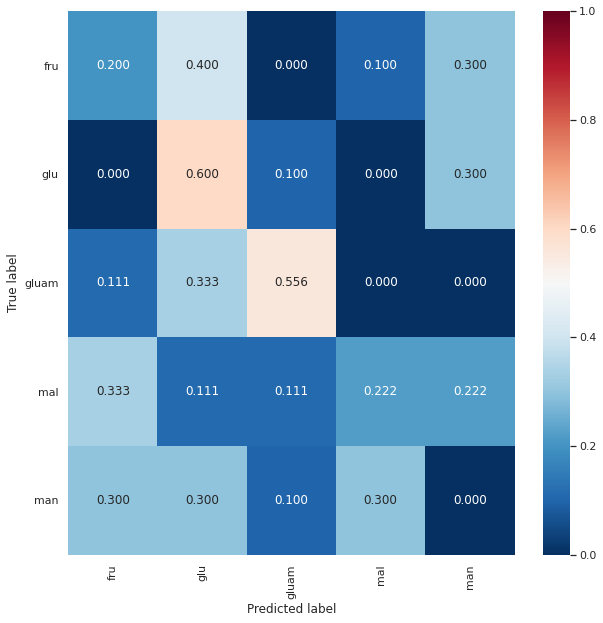

Normalised over pred label (columns)


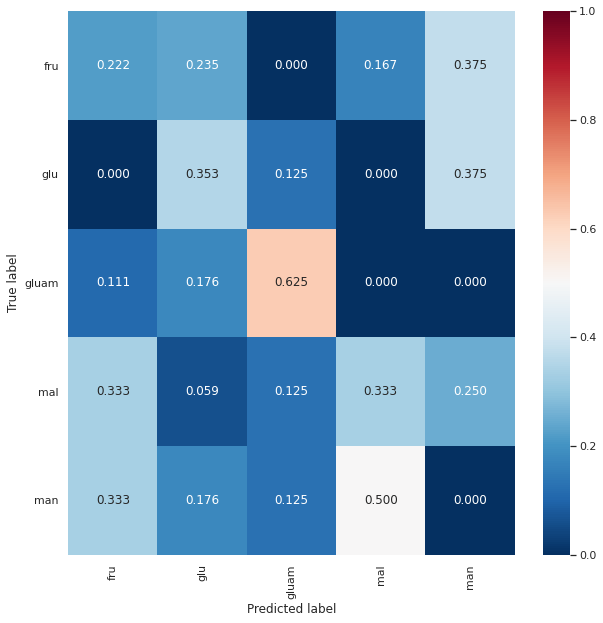

In [37]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [38]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

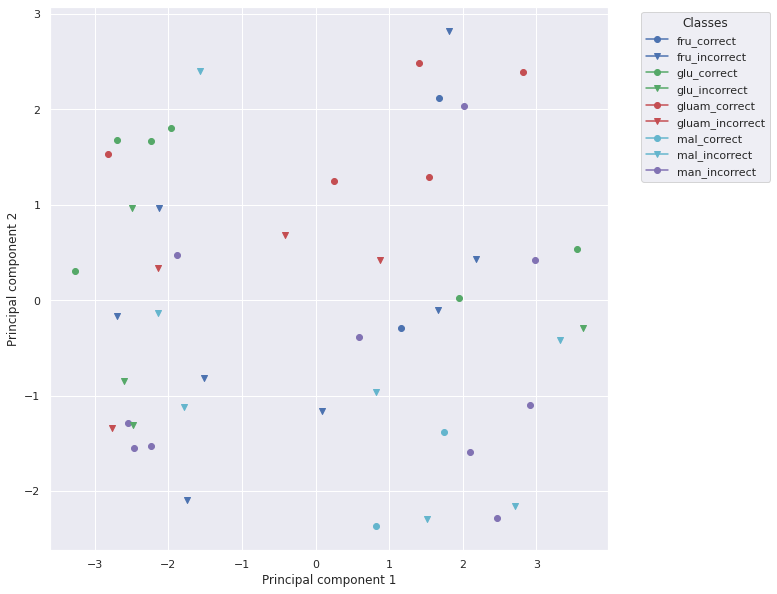

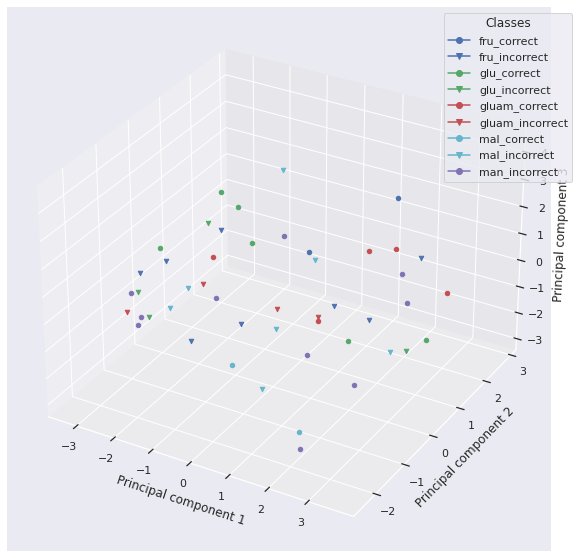

In [39]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# fru_incorrect = Value that is actually fructose is predicted to be something else

So, the trained KNeighbors classifier performs no better than random guessing. Can we train a working classifier by reducing the number of features included in the dataset?

#### Is it possible to improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [40]:
algorithms = [DummyClassifier, DummyClassifier, KNeighborsClassifier, GaussianNB, LinearDiscriminantAnalysis,
              LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 5
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for index, algorithm in enumerate(algorithms):
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                if index == 0:
                    fixed_params = OrderedDict({'strategy': 'prior',
                                                'random_state': 1})
                    tuned_params = OrderedDict({})
                elif index == 1:
                    fixed_params = OrderedDict({'strategy': 'stratified',
                                                'random_state': 1})
                    tuned_params = OrderedDict({})
                else:
                    fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                    if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                        fixed_params['random_state'] = 1
                    tuned_params = ml.define_tuned_model_params(
                        classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                    )

                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )
                
                if index == 0:
                    red_feat_searches[
                        'DummyClassifierPrior__{}__{}__{}'.format(resampling_method, feat_method, num_features)
                    ] = copy.deepcopy(nested_cv_search)
                elif index == 1:
                    red_feat_searches[
                        'DummyClassifierStratified__{}__{}__{}'.format(
                            resampling_method, feat_method, num_features
                        )
                    ] = copy.deepcopy(nested_cv_search)
                else:
                    red_feat_searches[
                        '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                    ] = copy.deepcopy(nested_cv_search)

                if index == 0:
                    red_feat_score_dict['Algorithm'].append('DummyClassifier_prior')
                elif index == 1:
                    red_feat_score_dict['Algorithm'].append('DummyClassifier_stratified')
                else:
                    red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                for n, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][n]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][n]))





DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




Du





DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2






DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.14814814814814814




DummyClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F





DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.14814814814814814




DummyClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('rando





KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'distance')])
Accuracy: 0.3
F1: 0.21333333333333332




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.2
F1: 0.2




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5
F1: 0.45999999999999996




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.3111111111111111




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neigh





KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.2
F1: 0.13714285714285715




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.2
F1: 0.15714285714285717




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.4
F1: 0.3666666666666666




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.2222222222222222
F1: 0.09876543209876544




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_j





KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3
F1: 0.26666666666666666




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.6
F1: 0.5933333333333334




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 1), ('weights', 'distance')])
Accuracy: 0.5
F1: 0.5




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.2




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', 





GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.2571428571428572




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.25




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.36




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5343915343915344




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.2222222222222222
F1: 0.2




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.15714285714285717




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.18




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.31428571428571433




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.42328042328042326







LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.13333333333333333




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.26




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.31333333333333335




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.39682539682539686




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5333333333333333




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.36




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.24000000000000005




LinearDiscriminantAnalysis: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.6
F





LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.36




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.36




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.6
F1: 0.5933333333333334




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5111111111111111




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.3333333333333333




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.34




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.3133333333333333




LinearDiscriminantAnalysis: no_balancing,  Permutation_score,  10
Parameters: Orde





LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.3
F1: 0.26




LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.3
F1: 0.24000000000000005




LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.8
F1: 0.7999999999999999




LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.5555555555555556
F1: 0.4973544973544974




LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.7777777777777778
F1: 0.6888888888888889




LinearSVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([(

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.2
F1: 0.1142857142857143




LinearSVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.3
F1: 0.21000000000000002




LinearSVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 64.0)])
Accuracy: 0.3
F1: 0.22666666666666666




LinearSVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.3333333333333333
F1: 0.21164021164021163




LinearSVC: no_balancing,  Permutation_score,





LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.2
F1: 0.13333333333333333




LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.4
F1: 0.32




LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.3
F1: 0.3333333333333333




LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.4444444444444444
F1: 0.37037037037037035




LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074
Range tested: [0.03125, 0.0625, 0.





SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.3
F1: 0.29333333333333333




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.2
F1: 0.2




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.0009765625), ('kernel', 'rbf')])
Accuracy: 0.4
F1: 0.3276190476190476




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 16384.0), ('gamma', 0.00048828125), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.34920634920634924




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 1024.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.2740740740740741




SVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state





SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.6
F1: 0.5809523809523809




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.3
F1: 0.29999999999999993




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.5
F1: 0.5266666666666666




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 8192.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.2888888888888889




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.25925925925925924




SVC: no_balancing,  Permutation_score,  5
Parameters: Order





AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.2
F1: 0.08888888888888889




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.27999999999999997




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.7
F1: 0.7




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.32098765432098764




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.2222222222222222
F1: 0.08888888888888889




AdaBoostClassifier: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.24888888888888888




Ad





AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.24888888888888888




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.27999999999999997




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.5
F1: 0.45999999999999996




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.32098765432098764




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.2222222222222222
F1: 0.08888888888888889




AdaBoostClassifier: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])

In [41]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [42]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,KBest_Fscore,1,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
1,DummyClassifier_prior,no_balancing,KBest_Fscore,2,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
2,DummyClassifier_prior,no_balancing,KBest_Fscore,3,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
3,DummyClassifier_prior,no_balancing,KBest_Fscore,4,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
4,DummyClassifier_prior,no_balancing,KBest_Fscore,5,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
...,...,...,...,...,...,...,...,...,...,...,...,...
155,AdaBoostClassifier,no_balancing,Permutation_score,10,0.268889,0.082552,0.268889,0.082552,0.132127,0.082526,0.155949,0.069408
156,AdaBoostClassifier,no_balancing,Permutation_score,15,0.268889,0.082552,0.268889,0.082552,0.132127,0.082526,0.155949,0.069408
157,AdaBoostClassifier,no_balancing,Permutation_score,20,0.268889,0.082552,0.268889,0.082552,0.132127,0.082526,0.155949,0.069408
158,AdaBoostClassifier,no_balancing,Permutation_score,30,0.268889,0.082552,0.268889,0.082552,0.132127,0.082526,0.155949,0.069408


In [43]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

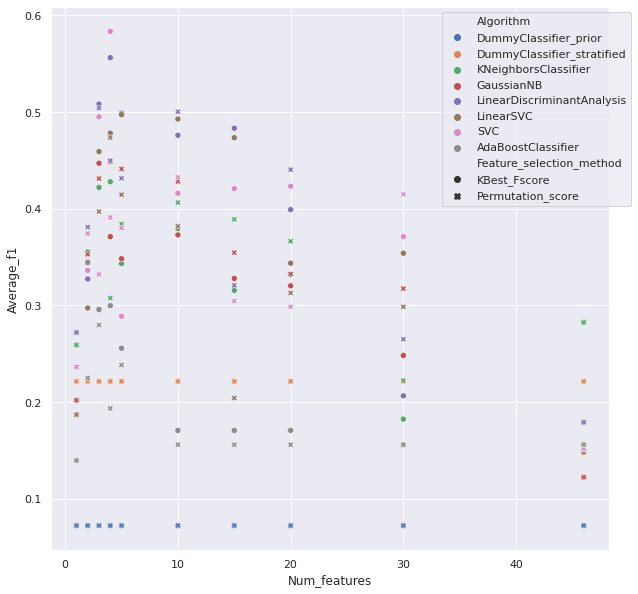

In [44]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

Model performance reaches a peak at ~3-5 features (depending upon the algorithm), then declines when further features are included (which indicates that the additional features are just introducing noise that obscures the signal separating the five classes).

In [45]:
sub_red_feat_score_df = red_feat_score_df[
      (red_feat_score_df['Num_features'] == 4)
    & (red_feat_score_df['Feature_selection_method'] == 'KBest_Fscore')
].reset_index(drop=True)

In [46]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,KBest_Fscore,4,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
1,DummyClassifier_stratified,no_balancing,KBest_Fscore,4,0.186667,0.043319,0.186667,0.043319,0.291111,0.041126,0.221481,0.042504
2,KNeighborsClassifier,no_balancing,KBest_Fscore,4,0.464444,0.231261,0.464444,0.231261,0.438519,0.227779,0.427915,0.219433
3,GaussianNB,no_balancing,KBest_Fscore,4,0.400000,0.146776,0.400000,0.146776,0.365926,0.138713,0.371175,0.137012
4,LinearDiscriminantAnalysis,no_balancing,KBest_Fscore,4,0.586667,0.195379,0.586667,0.195379,0.569630,0.250766,0.556212,0.215495
5,LinearSVC,no_balancing,KBest_Fscore,4,0.522222,0.246832,0.522222,0.246832,0.498519,0.299400,0.478138,0.263405
6,SVC,no_balancing,KBest_Fscore,4,0.608889,0.226405,0.608889,0.226405,0.608519,0.289889,0.583407,0.249760
7,AdaBoostClassifier,no_balancing,KBest_Fscore,4,0.413333,0.134807,0.413333,0.134807,0.263016,0.174684,0.299753,0.170015


All of the algorithms now perform better than random guessing. SVC has the best performance scores across all four metrics => take forwards.

In [47]:
red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['outer_loop_params']

[OrderedDict([('random_state', 1),
              ('C', 8192.0),
              ('gamma', 0.001953125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 512.0),
              ('gamma', 0.001953125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 4.0),
              ('gamma', 0.0625),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 2048.0),
              ('gamma', 0.00390625),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 128.0),
              ('gamma', 0.015625),
              ('kernel', 'rbf')])]

In [48]:
red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('random_state', 1),
                           ('C', 128.0),
                           ('gamma', 0.015625),
                           ('kernel', 'rbf')])),
             ('recall',
              OrderedDict([('random_state', 1),
                           ('C', 128.0),
                           ('gamma', 0.015625),
                           ('kernel', 'rbf')])),
             ('precision',
              OrderedDict([('random_state', 1),
                           ('C', 128.0),
                           ('gamma', 0.015625),
                           ('kernel', 'rbf')])),
             ('f1',
              OrderedDict([('random_state', 1),
                           ('C', 128.0),
                           ('gamma', 0.015625),
                           ('kernel', 'rbf')]))])

In [49]:
red_feat_nested_pred = red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['predictions']
red_feat_nested_y_true = red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['y_true']
red_feat_nested_x_true = red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

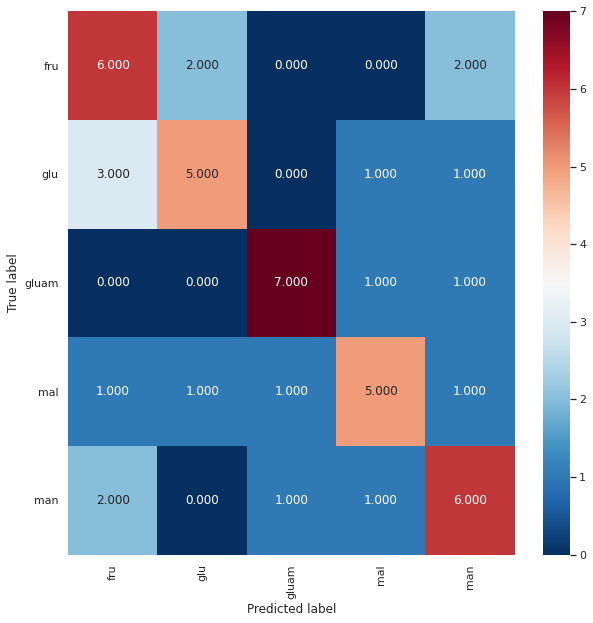

Normalised over true label (rows)


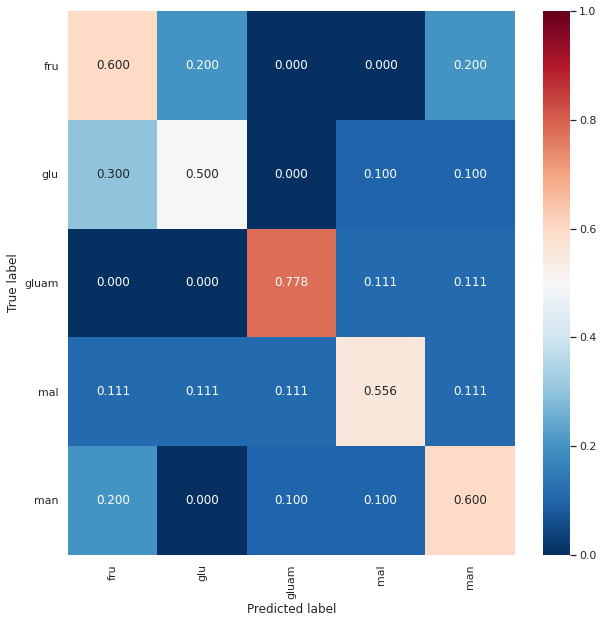

Normalised over pred label (columns)


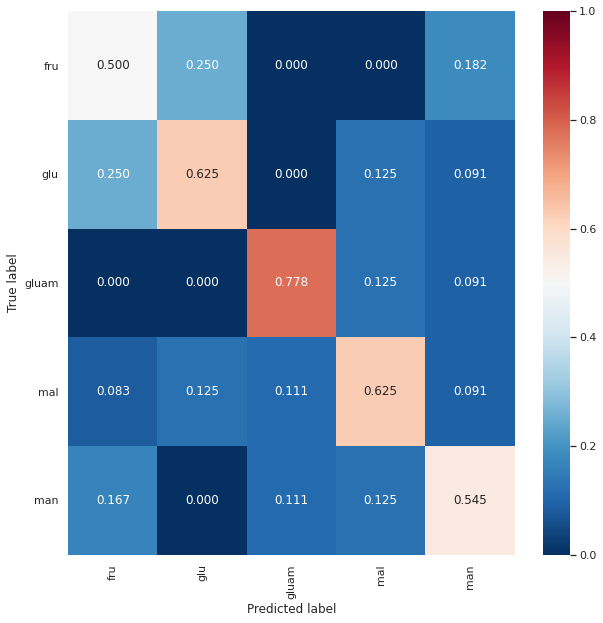

In [50]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [51]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

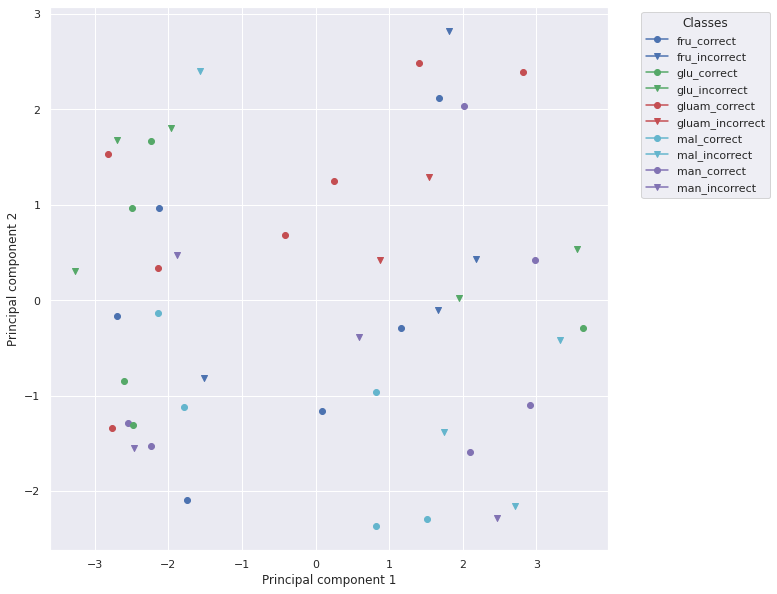

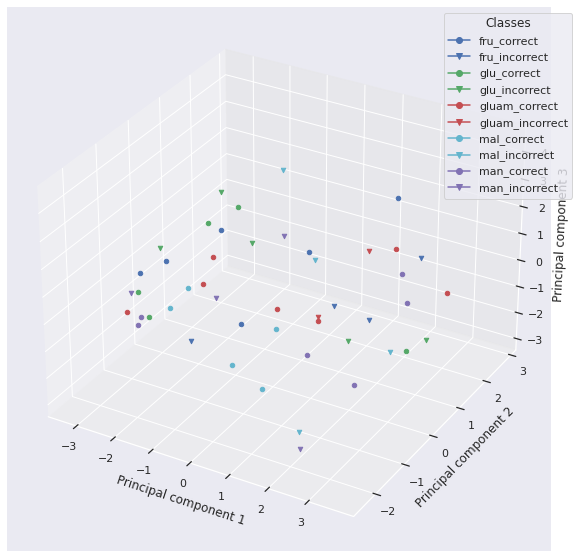

In [52]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# fru_incorrect = Value that is actually fructose is predicted to be something else

So, SVC model trained with just 4 peptides performs better than the KNeighbors model trained with all features - the latter performs little/no better than random guessing, whereas the former has (limited) ability to distinguish between the sugar classes (in particular it is effective at identifying gluam samples).

**Am I overestimating classifier performance by performing feature selection outside of the CV loop?**

In order to test whether the number of features in the array can be reduced, I want to select the same subset of features in every CV fold. This subset has been selected from feature importance analysis on the entire dataset. Therefore there is a danger of information "leakage" between the training and test sets, and consequent overestimation of model performance. Consequently, as a sanity check on the results above, below I perform feature selection (via KBest analysis) within the CV loop.

In [53]:
algorithms = [DummyClassifier, DummyClassifier, KNeighborsClassifier, GaussianNB, LinearDiscriminantAnalysis,
              LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 5
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

cv_imp_feat_searches = OrderedDict({})
cv_imp_feat_score_dict = OrderedDict({'Algorithm': [],
                                      'Resampling_method': [],
                                      'Num_features': [],
                                      'Average_accuracy': [],
                                      'Std_dev_accuracy': [],
                                      'Average_recall': [],
                                      'Std_dev_recall': [],
                                      'Average_precision': [],
                                      'Std_dev_precision': [],
                                      'Average_f1': [],
                                      'Std_dev_f1': []})
for index, algorithm in enumerate(algorithms):
    for resampling_method in resampling_methods:
        for num_features in num_features_list:
            if index == 0:
                fixed_params = OrderedDict({'strategy': 'prior',
                                            'random_state': 1})
                tuned_params = OrderedDict({})
            elif index == 1:
                fixed_params = OrderedDict({'strategy': 'stratified',
                                            'random_state': 1})
                tuned_params = OrderedDict({})
            else:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                )

            nested_cv_search = ml.run_nested_CV(
                clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=num_features,
                inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                fixed_params=fixed_params, tuned_params=tuned_params,
                train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
            )

            if index == 0:
                cv_imp_feat_searches[
                    'DummyClassifierPrior__{}__{}'.format(resampling_method, num_features)
                ] = copy.deepcopy(nested_cv_search)
            elif index == 1:
                cv_imp_feat_searches[
                    'DummyClassifierStratified__{}__{}'.format(resampling_method, num_features)
                ] = copy.deepcopy(nested_cv_search)
            else:
                cv_imp_feat_searches[
                    '{}__{}__{}'.format(algorithm.__name__, resampling_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

            if index == 0:
                cv_imp_feat_score_dict['Algorithm'].append('DummyClassifier_prior')
            elif index == 1:
                cv_imp_feat_score_dict['Algorithm'].append('DummyClassifier_stratified')
            else:
                cv_imp_feat_score_dict['Algorithm'].append(algorithm.__name__)
            cv_imp_feat_score_dict['Resampling_method'].append(resampling_method)
            cv_imp_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
            cv_imp_feat_score_dict['Num_features'].append(num_features)
            cv_imp_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
            cv_imp_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
            cv_imp_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
            cv_imp_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
            cv_imp_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
            cv_imp_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
            cv_imp_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

            for n, params in enumerate(nested_cv_search['outer_loop_params']):
                print('\n\n\n')
                print('{}: {},  {}'.format(algorithm.__name__, resampling_method, num_features))
                print('Parameters: {}'.format(params))
                print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][n]))
                print('F1: {}'.format(nested_cv_search['test_scores']['f1'][n]))





DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  1
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.0808080808080808




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.06666666666666668




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'prior'), ('random_s





DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924




DummyClassifier: no_balancing,  2
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.1111111111111111
F1: 0.14814814814814814




DummyClassifier: no_balancing,  3
Parameters: OrderedDict([('strategy', 'stratified'), ('random_state', 1)])
Accuracy: 0.2
F1: 0.2333333333333333




DummyClassifier: no_balancing,  3
Parameters: OrderedDict([('str





KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5
F1: 0.44000000000000006




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 2), ('weights', 'distance')])
Accuracy: 0.3
F1: 0.26




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'distance')])
Accuracy: 0.3
F1: 0.1942857142857143




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.32098765432098764




KNeighborsClassifier: no_balancing,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'distance')])
Accuracy: 0.44444444444444





GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.14666666666666667




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.25




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.14666666666666667




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.2222222222222222
F1: 0.17777777777777778




GaussianNB: no_balancing,  1
Parameters: OrderedDict()
Accuracy: 0.2222222222222222
F1: 0.2222222222222222




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.26666666666666666




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.26




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.2333333333333333




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.35555555555555557




GaussianNB: no_balancing,  2
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.2888888888888889









LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.3
F1: 0.26666666666666666




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.3904761904761905




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.2




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.2222222222222222
F1: 0.21164021164021163




LinearDiscriminantAnalysis: no_balancing,  15
Parameters: OrderedDict()
Accuracy: 0.2222222222222222
F1: 0.2222222222222222




LinearDiscriminantAnalysis: no_balancing,  20
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.21333333333333332




LinearDiscriminantAnalysis: no_balancing,  20
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.18




LinearDiscriminantAnalysis: no_balancing,  20
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.18




LinearDiscriminantAnalysis: no_balancing,  20
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.3
F1: 0.26




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.2
F1: 0.2333333333333333




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.2
F1: 0.2




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.4444444444444444
F1: 0.37037037037037035




LinearSVC: no_balancing,  10
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.2222222





SVC: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.00390625), ('kernel', 'rbf')])
Accuracy: 0.4
F1: 0.31333333333333335




SVC: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.4
F1: 0.36




SVC: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('C', 1024.0), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.3
F1: 0.23714285714285716




SVC: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('C', 1024.0), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4592592592592592




SVC: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.0009765625), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




SVC: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.5
F1: 0.5133333333333333









AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.26




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.32222222222222224




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.3
F1: 0.26666666666666666




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.2222222222222222
F1: 0.21164021164021163




AdaBoostClassifier: no_balancing,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.2222222222222222
F1: 0.08888888888888889




AdaBoostClassifier: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.2
F1: 0.08888888888888889




AdaBoostClassifier: no_balancing,  3
Parameters: OrderedDict([('random_state', 1), ('n_esti

In [54]:
cv_imp_feat_score_df = pd.DataFrame(cv_imp_feat_score_dict)

In [55]:
cv_imp_feat_score_df

,Algorithm,Resampling_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,DummyClassifier_prior,no_balancing,1,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
1,DummyClassifier_prior,no_balancing,2,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
2,DummyClassifier_prior,no_balancing,3,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
3,DummyClassifier_prior,no_balancing,4,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
4,DummyClassifier_prior,no_balancing,5,0.208889,0.012172,0.208889,0.012172,0.043753,0.005139,0.072323,0.007746
...,...,...,...,...,...,...,...,...,...,...,...
75,AdaBoostClassifier,no_balancing,10,0.288889,0.101835,0.288889,0.101835,0.133238,0.084431,0.170737,0.088110
76,AdaBoostClassifier,no_balancing,15,0.288889,0.101835,0.288889,0.101835,0.133238,0.084431,0.170737,0.088110
77,AdaBoostClassifier,no_balancing,20,0.288889,0.101835,0.288889,0.101835,0.133238,0.084431,0.170737,0.088110
78,AdaBoostClassifier,no_balancing,30,0.268889,0.082552,0.268889,0.082552,0.132127,0.082526,0.155949,0.069408


In [56]:
with open('{}/CV_importance_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((cv_imp_feat_searches, cv_imp_feat_score_df), f)

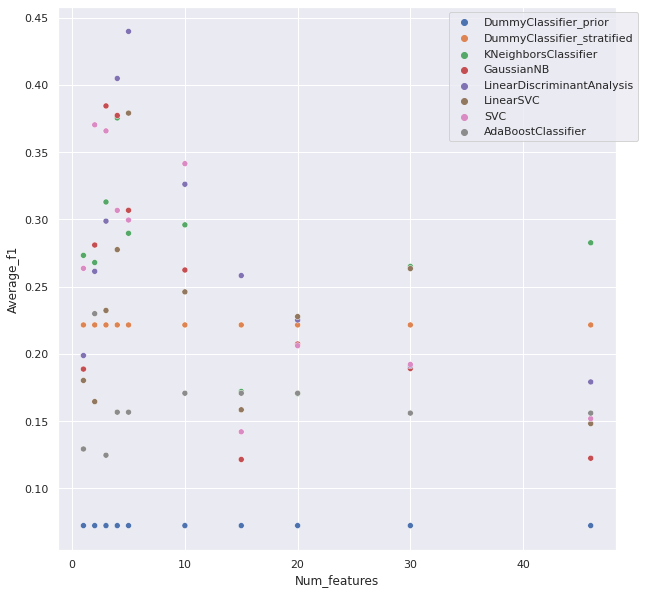

/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [57]:
plt.clf()
sns.scatterplot(
    x=cv_imp_feat_score_df['Num_features'], y=cv_imp_feat_score_df['Average_f1'],
    hue=cv_imp_feat_score_df['Algorithm']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/CV_importance_feature_number_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

So, see a substantial drop in performance when training a model with a subset of features when those features are selected within the CV loop as opposed to from feature selection on the entire dataset. This does suggest that using the latter method introduces optimistic bias into my estimate of model performance on unseen data.

Regardless, it's clear that some of the algorithms when trained with ~2-10 features perform better than random classifiers, hence the model performance achieved above when feature selection is performed on the entire dataset is not solely down to the bias that this methodology introduces.

**Is there a significant difference in model performance when reduce the number of features?**

4 features, feature selection on entire dataset

In [60]:
params_1 = all_feat_searches['KNeighborsClassifier__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['best_outer_loop_params']['f1']
selected_features_2 = kbest_feat_importances_df['Feature'].tolist()[:4]

print('Model 1:')
print('Algorithm: KNeighborsClassifier')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: SVC')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=KNeighborsClassifier, classifier_2=SVC, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: KNeighborsClassifier
Parameters:
OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Features:
['DPH_GRP46', 'DPH_GRP51', 'DPH_CCHept', 'DPH_CCHept-L14A', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I24A', 'DPH_CCHept-I24P', 'DPH_GRP80', 'DPH_GRP63', 'DPH_GRP52', 'DPH_CCHex', 'DPH_CCPent', 'DPH_NLKEIA', 'DPH_QLKEIA', 'DPH_CCHex2', 'DPH_GRP22', 'DPH_CCHept-I17H', 'DPH_CCHept-I17T', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-I24H', 'DPH_CCHept-I24N', 'DPH_CCHept-I24S', 'DPH_CCHept-I24T', 'DPH_CCHept-L7K', 'DPH_CCHept-I17K', 'DPH_CCHept-I17K-I24E', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-I24D', 'DPH_CCHept-I24E', 'DPH_CCHept-I24K', 'DPH_CCHept-L28K', 'DPH_CCPent-I24K', 'DPH_CCHex2-I24K', 'DPH_CCHept-L7W', 'DPH_CCHept-L7Y', 'DPH_CCHept-L21S-I24Y', 'DPH_CCHept-L21Y-I24S', 'DPH_CCHept-I24Y', 'DPH_C

In [61]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 6.203695930534917
p value: 0.02868256565182465


So, there is a significant difference (namely an improvement) in performance when reduce the number of peptides from 46 to 4. This indicates that most of the additional 42 peptides simply introduce noise.

5 features, feature selection within CV loop

In [62]:
params_1 = all_feat_searches['KNeighborsClassifier__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = 46
params_2 = cv_imp_feat_searches['LinearDiscriminantAnalysis__no_balancing__5']['best_outer_loop_params']['f1']
selected_features_2 = 5

print('Model 1:')
print('Algorithm: KNeighborsClassifier')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: LinearDiscriminantAnalysis')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=KNeighborsClassifier, classifier_2=LinearDiscriminantAnalysis, params_1=params_1,
    params_2=params_2, resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: KNeighborsClassifier
Parameters:
OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Features:
46




Model 2:
Algorithm: LinearDiscriminantAnalysis
Parameters:
OrderedDict()
Features:
5


In [63]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 1.1392407356515144
p value: 0.4705890869623336


So, there is no significant difference in performance between a model trained with all features and trained with a subset of features selected by KBest analysis during the CV loop. This is not surprising: the p value obtained when comparing a constant selection of features to all features is only slightly less than a threshold of p=0.05, and it can be seen from the scatter plots above that the F1 scores of the models trained with a constant selection of features are greater than those of the models trained with features selected during the CV loop. However, with a larger dataset a difference would likely be detectable for both options (=> because random error will have less of an effect upon feature selection during the CV loop).

**Is there a significant difference between the best performing model and a random classifier?**

In [68]:
params_1 = red_feat_searches['SVC__no_balancing__KBest_Fscore__4']['best_outer_loop_params']['f1']
selected_features_1 = kbest_feat_importances_df['Feature'].tolist()[:4]
params_2 = all_feat_searches['DummyClassifierPrior__no_balancing']['best_outer_loop_params']['f1']
selected_features_2 = list(ml.features)

print('Model 1:')
print('Algorithm: SVC')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: DummyClassifierPrior')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=SVC, classifier_2=DummyClassifier, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: SVC
Parameters:
OrderedDict([('random_state', 1), ('C', 128.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Features:
['DPH_CCHept-L7Y', 'DPH_CCHept-I24D', 'DPH_CCPent-I24K', 'DPH_CCHept-I17H']




Model 2:
Algorithm: DummyClassifierPrior
Parameters:
OrderedDict([('strategy', 'prior'), ('random_state', 1)])
Features:
['DPH_GRP46', 'DPH_GRP51', 'DPH_CCHept', 'DPH_CCHept-L14A', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I24A', 'DPH_CCHept-I24P', 'DPH_GRP80', 'DPH_GRP63', 'DPH_GRP52', 'DPH_CCHex', 'DPH_CCPent', 'DPH_NLKEIA', 'DPH_QLKEIA', 'DPH_CCHex2', 'DPH_GRP22', 'DPH_CCHept-I17H', 'DPH_CCHept-I17T', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-I24H', 'DPH_CCHept-I24N', 'DPH_CCHept-I24S', 'DPH_CCHept-I24T', 'DPH_CCHept-L7K', 'DPH_CCHept-I17K', 'DPH_CCHept-I17K-I24E', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-I24D', 'DPH_CCHept-I24E', 'DPH_CCHept-I24K', 'D

In [69]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 66.06492550897609
p value: 0.00011228399712278195


So, the trained model performs significantly better than a random classifier.